In [1]:
import os
import sys
cwd = os.getcwd()
module_path = os.path.abspath(os.path.join('..'))
sys.path.insert(0, os.path.join(cwd, "../"))

import pickle
import torch
import importlib
import numpy as np
import pandas as pd
import copy

import src.bin.tensorify as tensorify
import src.utils.data_conversion_utils as conversions
import src.data_manager.student_life_var_binned_data_manager as data_manager
import src.bin.trainer as trainer

from sklearn import metrics

from torch import nn
from copy import copy
from copy import deepcopy
from src import definitions
from src.bin import validations
from src.bin import statistics
from src.bin import plotting
from src.utils.read_utils import read_pickle
from src.utils import student_utils
from src.data_manager import sub_sampler
from src.data_manager import cross_val
from src.data_manager import helper as data_manager_helper
from tabulate import tabulate
from src.models import autoencoder
from src.models import multitask_learning
from src.models import user_dense_heads


pd.set_option('max_rows', 10000)

importlib.reload(validations)
importlib.reload(autoencoder)
importlib.reload(multitask_learning)
importlib.reload(user_dense_heads)
importlib.reload(sub_sampler)
importlib.reload(statistics)
importlib.reload(cross_val)
importlib.reload(definitions)
importlib.reload(conversions)
importlib.reload(tensorify)
importlib.reload(plotting)
importlib.reload(trainer)
importlib.reload(data_manager)
importlib.reload(student_utils)
importlib.reload(data_manager_helper)
feature_list = data_manager.FEATURE_LIST

# ##### Pickle #####
data = read_pickle('../data/training_data/shuffled_splits/training_date_normalized_shuffled_splits_select_features.pkl')

#### Data ####
# student_list = student_list =  [53, 46, 7, 49, 22, 24, 2]
# # student_list = [2]
# data = data_manager.get_data_for_training_in_dict_format(*student_list, normalize=True, 
#                                                          fill_na=True, flatten_sequence=False)

# ###### Randomize ######
# train_ids, val_ids, test_ids = cross_val.random_stratified_splits(data)
# data['train_ids'] = train_ids
# data['val_ids'] = val_ids
# data['test_ids'] = test_ids

# data = sub_sampler.get_sub_sampled_sequences(data)

############# Stats ############# 
# unnormalized_data = data_manager.get_data_for_training_in_dict_format(*student_list, normalize=False, fill_na=False)
# statistics_df, raw_df = statistics.get_statistics_on_data_dict(unnormalized_data, feature_list)
# print(statistics.get_train_test_val_label_counts_from_raw_data(data))


# #### Data ####
# student_list = student_list =   [1, 2, 4 , 7, 10, 22, 24, 33, 42, 46, 49, 53, 57]
# # student_list = [2]
# data = data_manager.get_data_for_training_in_dict_format(*student_list, normalize=True, 
#                                                          fill_na=True, flatten_sequence=False)

# ###### Randomize ######
# train_ids, val_ids, test_ids = cross_val.random_stratified_splits(data, stratify_by='students')
# data['train_ids'] = train_ids
# data['val_ids'] = val_ids
# data['test_ids'] = test_ids

# data = sub_sampler.get_sub_sampled_sequences(data)

############ Stats ############# 
# unnormalized_data = data_manager.get_data_for_training_in_dict_format(*student_list, normalize=False, fill_na=False)
# statistics_df, raw_df = statistics.get_statistics_on_data_dict(unnormalized_data, feature_list)
print(statistics.get_train_test_val_label_counts_from_raw_data(data))

      Train    Val    Test
--  -------  -----  ------
 0      108     50      27
 1      131     50      35
 2       88     30      26


In [2]:
################################## Init ##################################
use_historgram = True
autencoder_bottle_neck_feature_size = 128
autoencoder_num_layers = 1
alpha , beta = 0, 1
decay = 0.0001
first_key = next(iter(data['data'].keys()))
if use_historgram:
    num_features = len(data['data'][first_key][4][0])
else:
    num_features = len(data['data'][first_key][0][0])
num_covariates = len(data['data'][first_key][3])
shared_hidden_layer_size = 256
user_dense_layer_hidden_size = 64
num_classes = 3
learning_rate = 0.000005
n_epochs = 300
shared_layer_dropout_prob=0.0
user_head_dropout_prob=0.0

print("Num Features:", num_features)

Num Features: 9


In [3]:
class_weights = torch.tensor(statistics.get_class_weights_in_inverse_proportion(data))
cuda_enabled = torch.cuda.is_available()
data = tensorify.tensorify_data_gru_d(data, cuda_enabled)

In [4]:
student_list = conversions.extract_distinct_student_idsfrom_keys(data['data'].keys())
model = multitask_learning.MultiTaskAutoEncoderLearner(
                               conversions.prepend_ids_with_string(student_list, "student_"),
                               num_features,
                               autencoder_bottle_neck_feature_size,
                               autoencoder_num_layers,
                               shared_hidden_layer_size,
                               user_dense_layer_hidden_size,
                               num_classes,
                               num_covariates,
                               shared_layer_dropout_prob,
                               user_head_dropout_prob)

if cuda_enabled:
    model.cuda()
    class_weights = class_weights.cuda()

reconstruction_criterion = torch.nn.L1Loss(reduction="sum")
classification_criterion = torch.nn.CrossEntropyLoss(weight=class_weights)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=decay)

/home/abhinavshaw/projects/MultiRes/student_life/notebooks/../src/models/autoencoder.py:21: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  nn.init.xavier_uniform(self.lstm.weight_ih_l0, gain=np.sqrt(2))
/home/abhinavshaw/projects/MultiRes/student_life/notebooks/../src/models/autoencoder.py:22: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  nn.init.xavier_uniform(self.lstm.weight_hh_l0, gain=np.sqrt(2))
/home/abhinavshaw/projects/MultiRes/student_life/notebooks/../src/models/autoencoder.py:56: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  nn.init.xavier_uniform(self.lstm.weight_ih_l0, gain=np.sqrt(2))
/home/abhinavshaw/projects/MultiRes/student_life/notebooks/../src/models/autoencoder.py:57: UserWarning: nn.init.xavier_uniform is now deprecated in favor of nn.init.xavier_uniform_.
  nn.init.xavier_uniform(self.lstm.weight_hh_l0, gain=np.sqrt(2))
/hom

/home/abhinavshaw/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


xxxxxxxxxxxxxx epoch: 0 xxxxxxxxxxxxxx


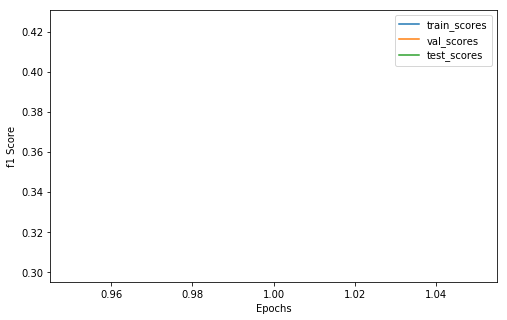

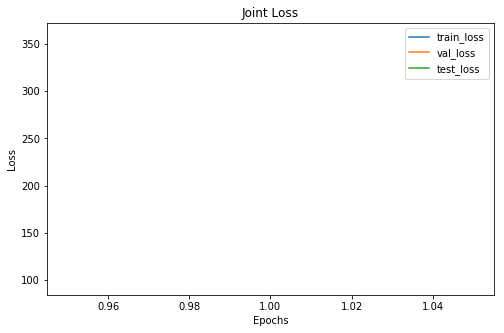

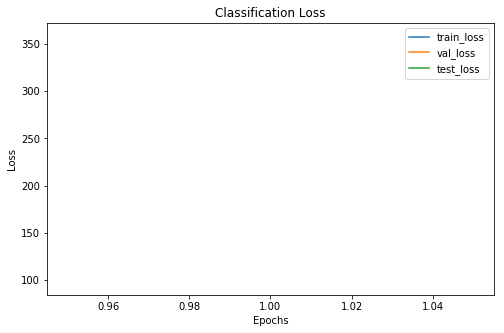

Cofusion Matrix For Val Set: 
--  --  --
24  23   3
18  14  18
 6   6  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     48      32
 1      102     43      29
 2       95     39      27
xxxxxxxxxxxxxx epoch: 1 xxxxxxxxxxxxxx


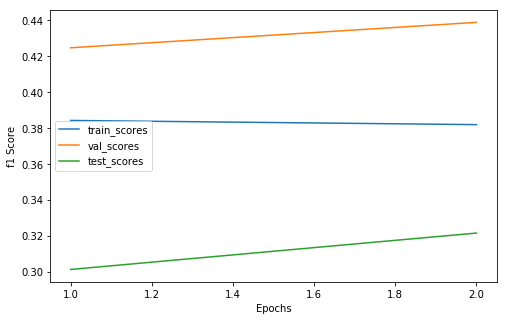

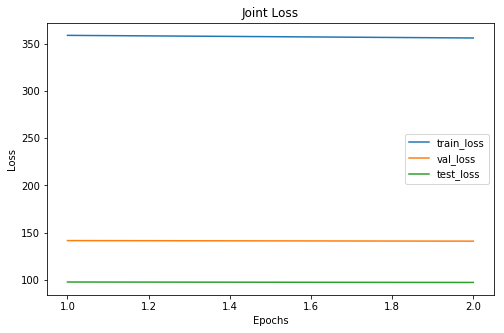

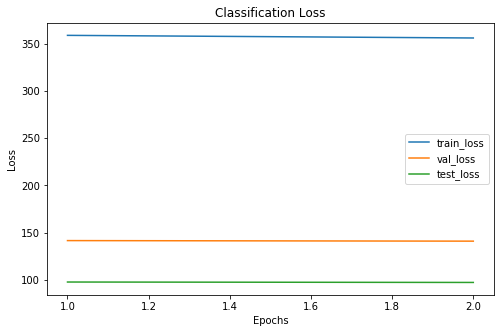

Cofusion Matrix For Val Set: 
--  --  --
26  21   3
18  14  18
 6   6  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     50      34
 1      100     41      28
 2       97     39      26
xxxxxxxxxxxxxx epoch: 2 xxxxxxxxxxxxxx


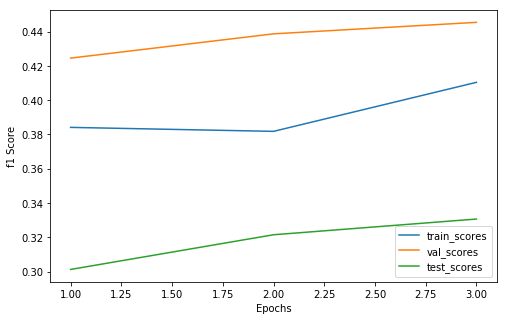

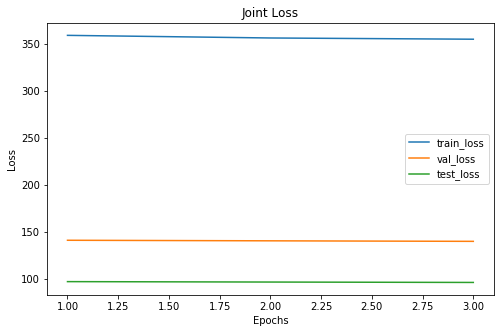

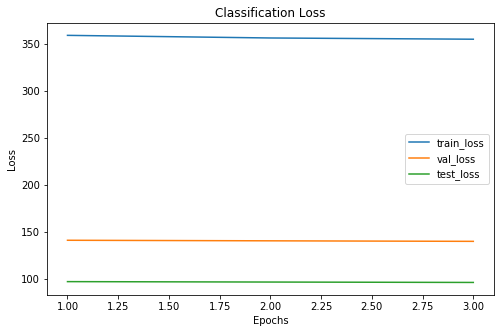

Cofusion Matrix For Val Set: 
--  --  --
27  20   3
19  14  17
 6   6  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      127     52      35
 1      105     40      27
 2       95     38      26
xxxxxxxxxxxxxx epoch: 3 xxxxxxxxxxxxxx


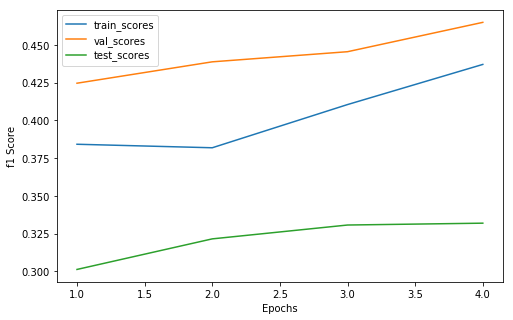

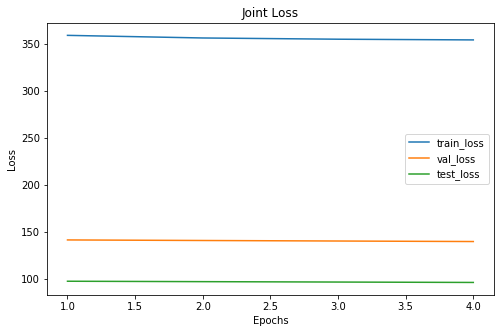

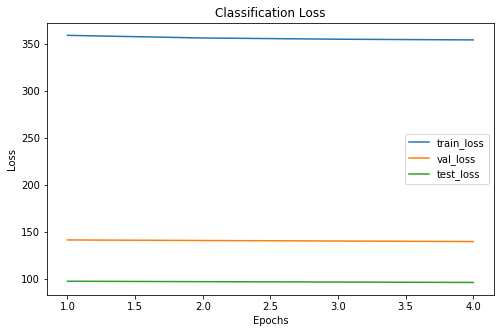

Cofusion Matrix For Val Set: 
--  --  --
30  17   3
20  14  16
 7   5  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      128     57      35
 1      106     36      28
 2       93     37      25
xxxxxxxxxxxxxx epoch: 4 xxxxxxxxxxxxxx


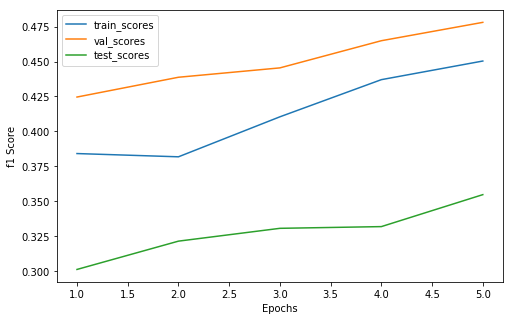

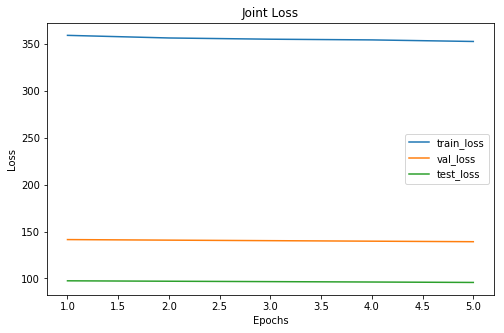

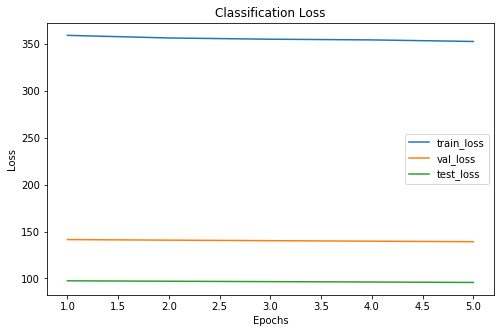

Cofusion Matrix For Val Set: 
--  --  --
32  15   3
20  14  16
 7   5  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      131     59      36
 1      107     34      28
 2       89     37      24
xxxxxxxxxxxxxx epoch: 5 xxxxxxxxxxxxxx


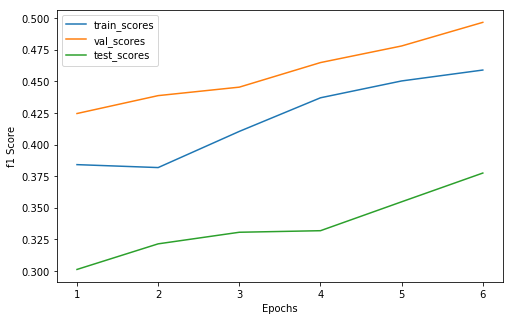

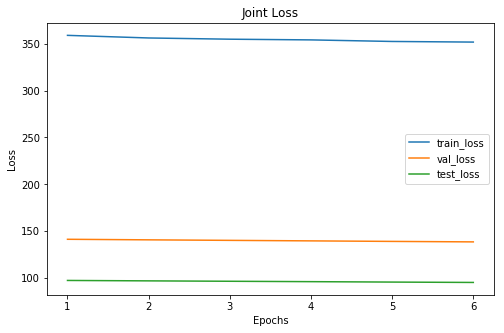

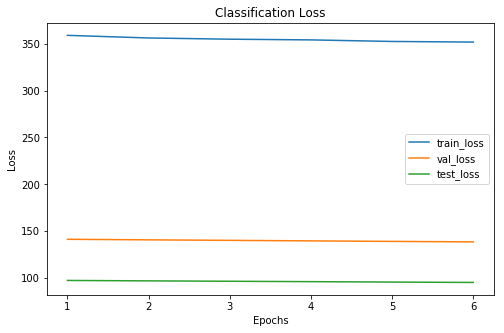

Cofusion Matrix For Val Set: 
--  --  --
33  14   3
19  16  15
 7   6  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      134     59      37
 1      112     36      28
 2       81     35      23
xxxxxxxxxxxxxx epoch: 6 xxxxxxxxxxxxxx


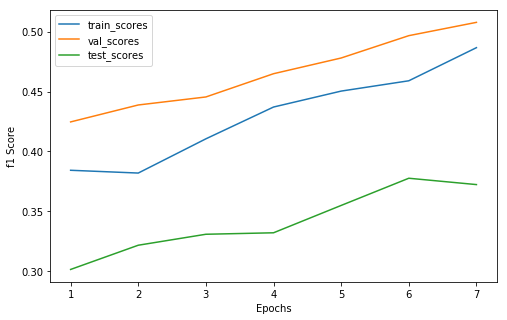

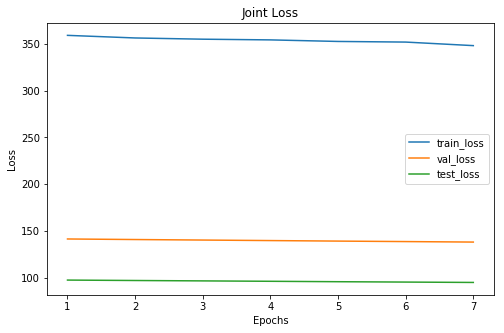

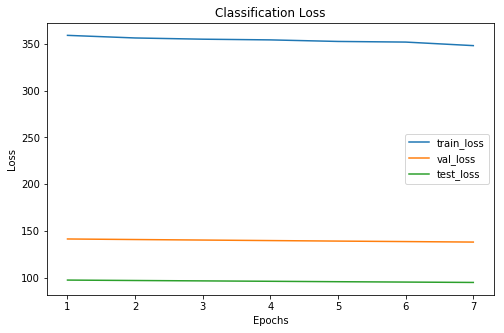

Cofusion Matrix For Val Set: 
--  --  --
33  14   3
18  18  14
 7   7  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      135     58      36
 1      112     39      30
 2       80     33      22
xxxxxxxxxxxxxx epoch: 7 xxxxxxxxxxxxxx


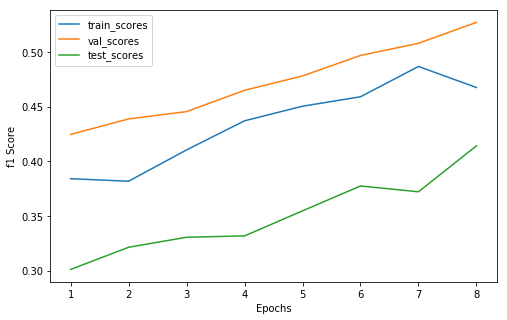

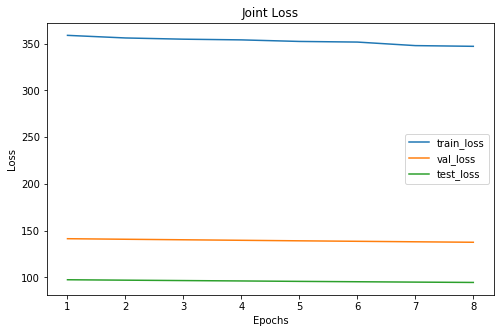

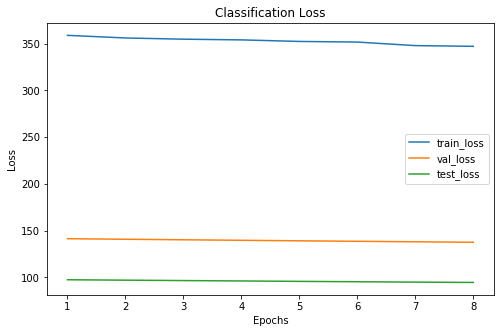

Cofusion Matrix For Val Set: 
--  --  --
32  15   3
17  21  12
 7   7  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      141     56      36
 1      114     43      31
 2       72     31      21
xxxxxxxxxxxxxx epoch: 8 xxxxxxxxxxxxxx


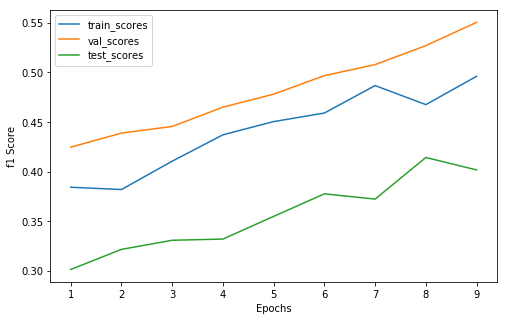

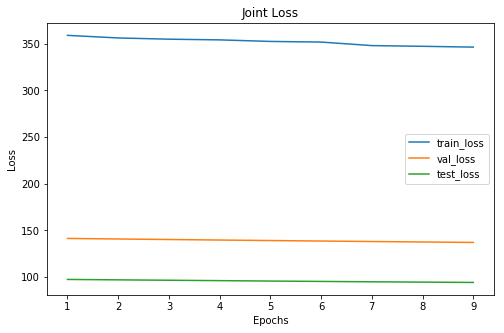

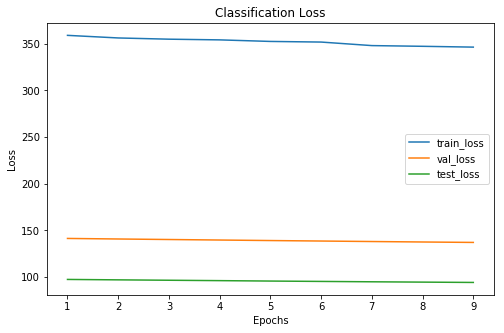

Cofusion Matrix For Val Set: 
--  --  --
33  14   3
17  23  10
 8   6  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      131     58      37
 1      115     43      31
 2       81     29      20
xxxxxxxxxxxxxx epoch: 9 xxxxxxxxxxxxxx


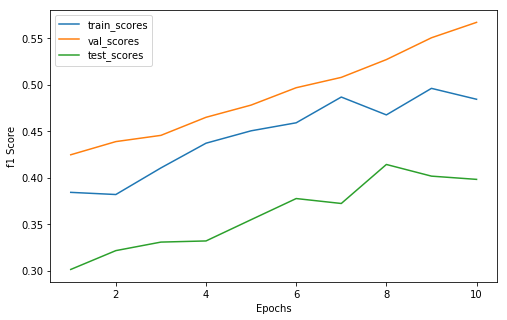

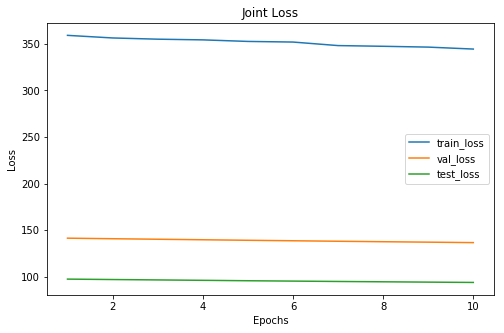

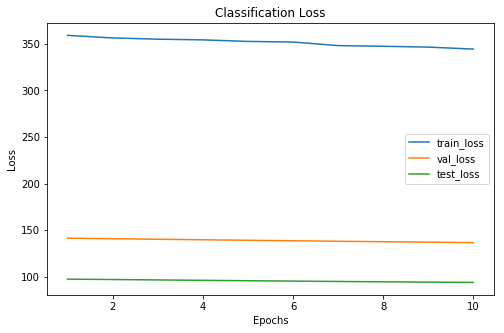

Cofusion Matrix For Val Set: 
--  --  --
33  14   3
17  25   8
 9   5  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     59      38
 1      124     44      31
 2       73     27      19
xxxxxxxxxxxxxx epoch: 10 xxxxxxxxxxxxxx


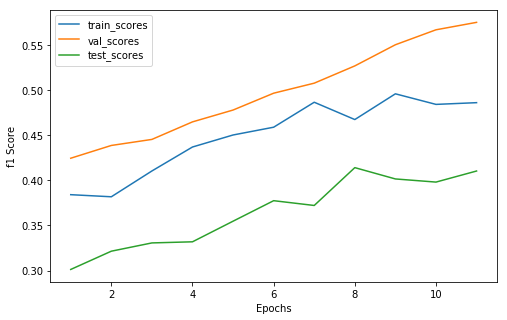

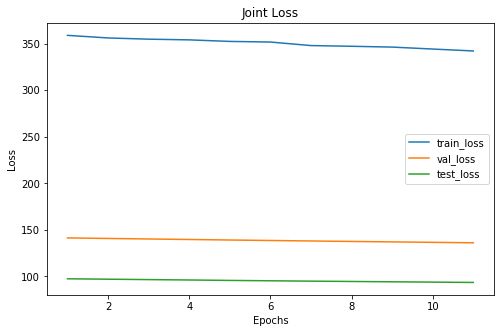

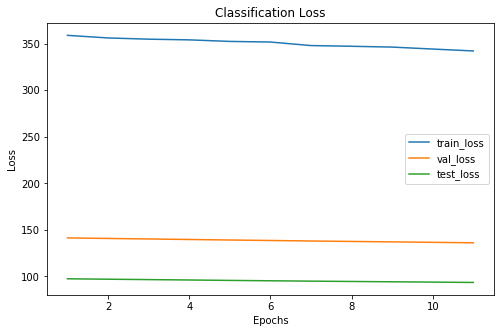

Cofusion Matrix For Val Set: 
--  --  --
33  14   3
17  26   7
 9   5  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      133     59      38
 1      127     45      32
 2       67     26      18
xxxxxxxxxxxxxx epoch: 11 xxxxxxxxxxxxxx


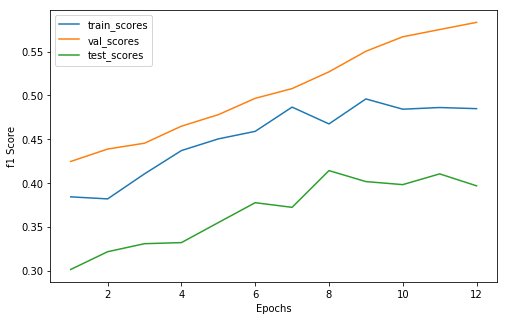

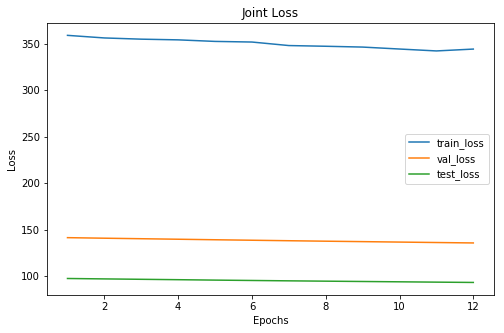

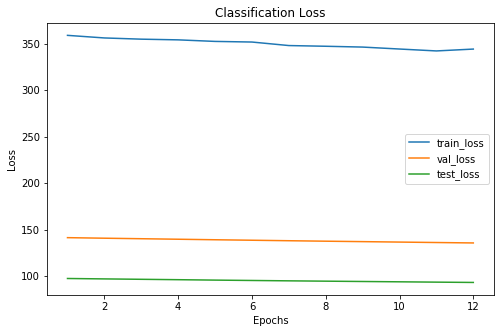

Cofusion Matrix For Val Set: 
--  --  --
33  14   3
17  27   6
 9   5  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      140     59      39
 1      119     46      32
 2       68     25      17
xxxxxxxxxxxxxx epoch: 12 xxxxxxxxxxxxxx


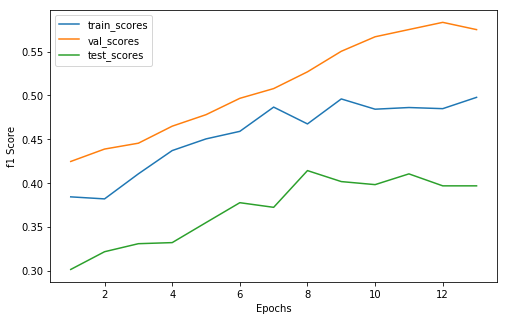

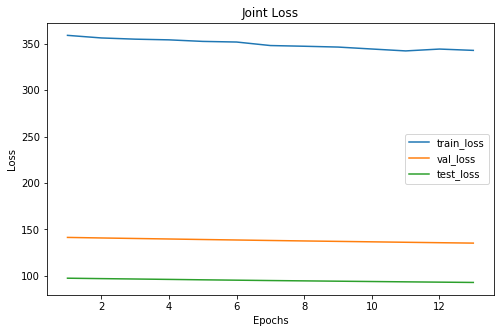

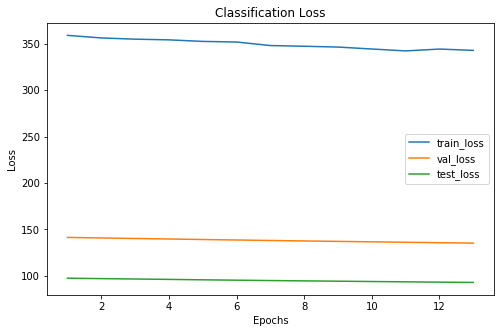

Cofusion Matrix For Val Set: 
--  --  --
33  14   3
17  27   6
 9   6  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      141     59      39
 1      113     47      32
 2       73     24      17
xxxxxxxxxxxxxx epoch: 13 xxxxxxxxxxxxxx


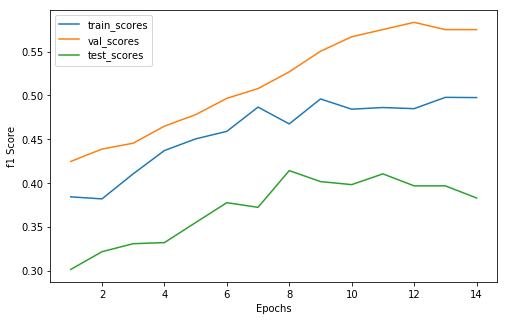

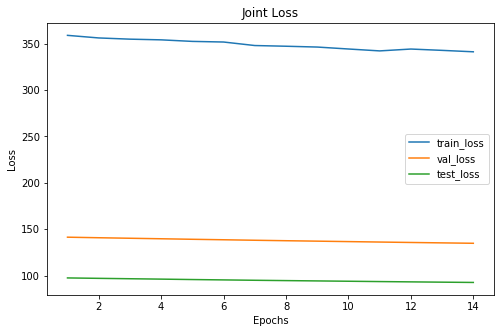

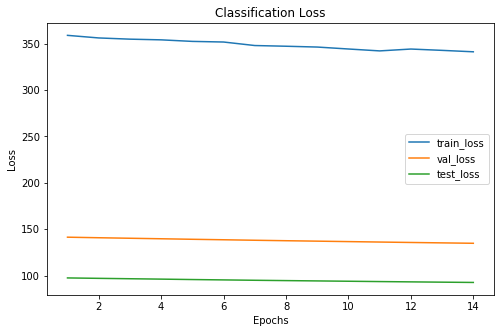

Cofusion Matrix For Val Set: 
--  --  --
33  14   3
17  27   6
 9   6  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      139     59      39
 1      119     47      33
 2       69     24      16
xxxxxxxxxxxxxx epoch: 14 xxxxxxxxxxxxxx


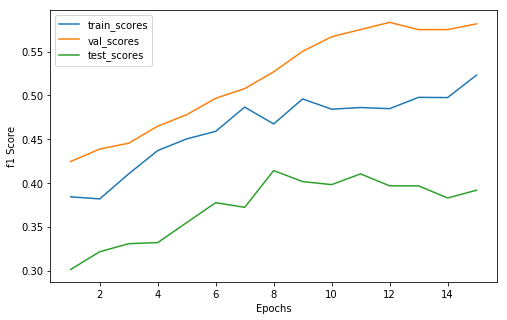

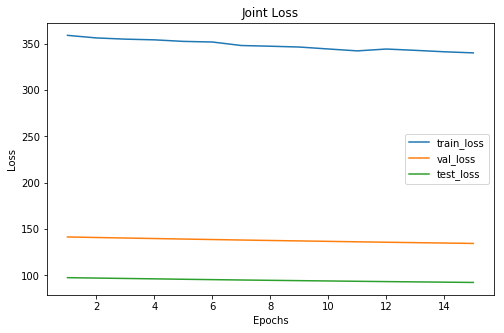

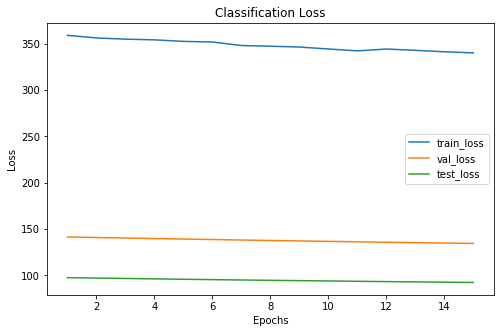

Cofusion Matrix For Val Set: 
--  --  --
34  13   3
17  28   5
 9   7  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      137     60      40
 1      131     48      32
 2       59     22      16
xxxxxxxxxxxxxx epoch: 15 xxxxxxxxxxxxxx


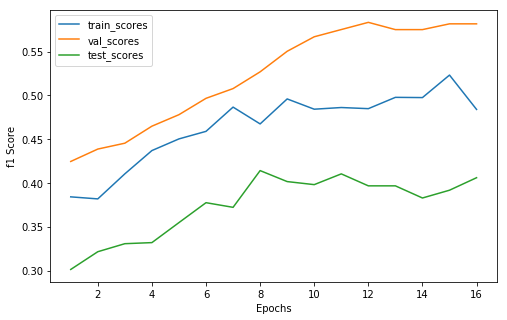

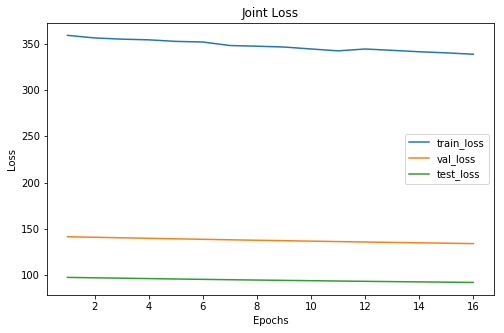

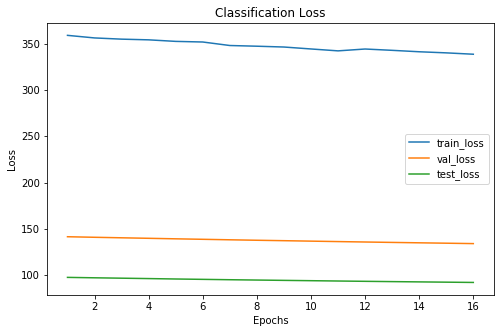

Cofusion Matrix For Val Set: 
--  --  --
34  13   3
17  28   5
 9   7  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      134     60      39
 1      121     48      32
 2       72     22      17
xxxxxxxxxxxxxx epoch: 16 xxxxxxxxxxxxxx


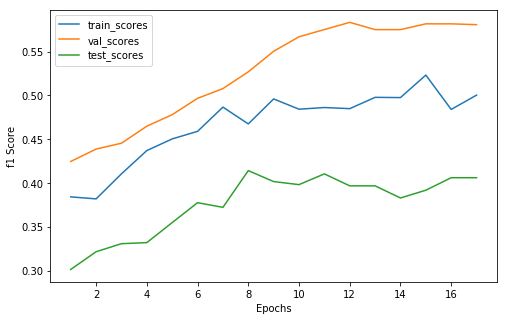

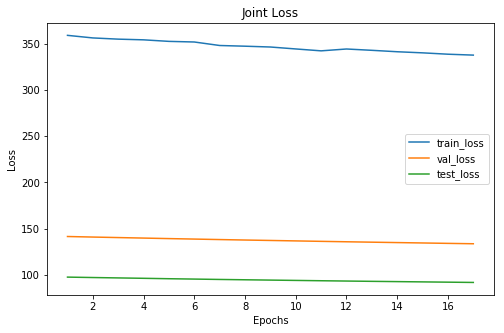

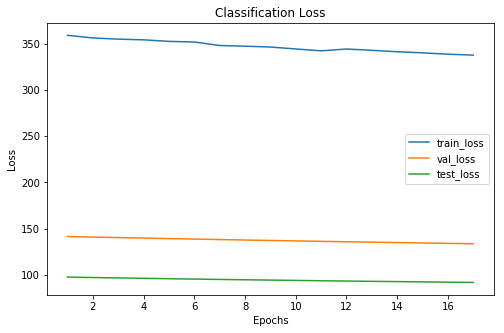

Cofusion Matrix For Val Set: 
--  --  --
34  13   3
17  29   4
 9   8  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      147     60      39
 1      122     50      32
 2       58     20      17
xxxxxxxxxxxxxx epoch: 17 xxxxxxxxxxxxxx


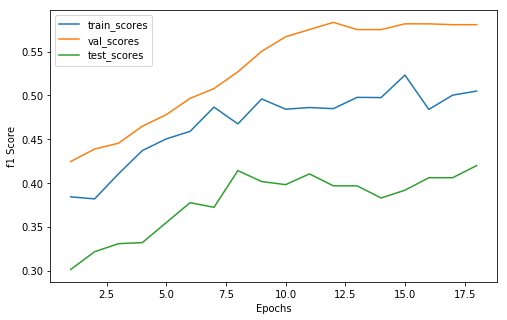

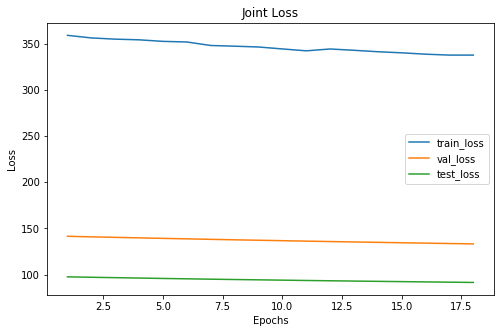

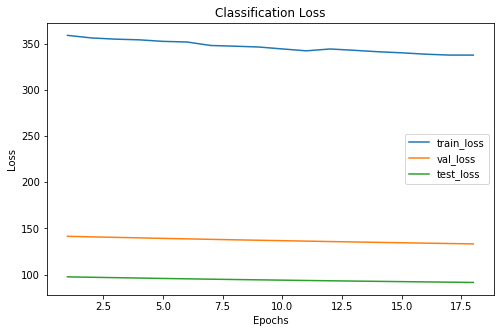

Cofusion Matrix For Val Set: 
--  --  --
34  13   3
17  29   4
 9   8  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      146     60      38
 1      119     50      32
 2       62     20      18
xxxxxxxxxxxxxx epoch: 18 xxxxxxxxxxxxxx


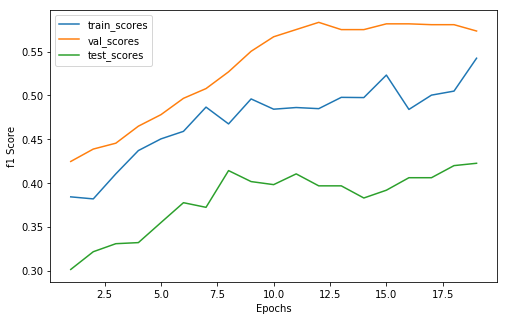

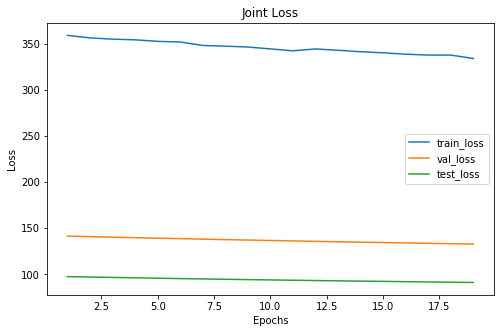

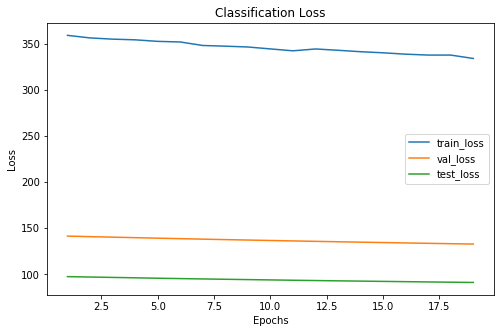

Cofusion Matrix For Val Set: 
--  --  --
33  12   5
17  29   4
 9   8  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      144     59      37
 1      121     49      33
 2       62     22      18
xxxxxxxxxxxxxx epoch: 19 xxxxxxxxxxxxxx


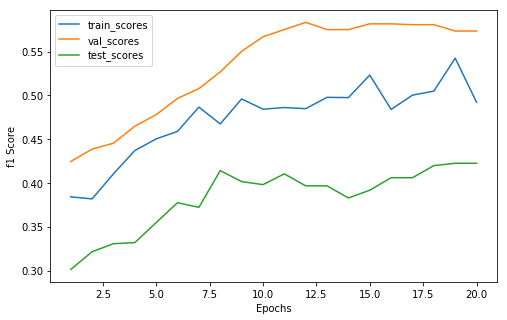

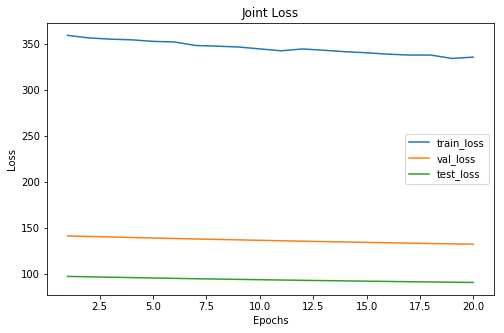

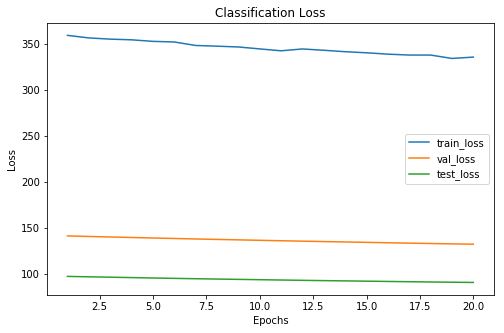

Cofusion Matrix For Val Set: 
--  --  --
33  12   5
17  29   4
 9   8  13
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      138     59      37
 1      127     49      33
 2       62     22      18
xxxxxxxxxxxxxx epoch: 20 xxxxxxxxxxxxxx


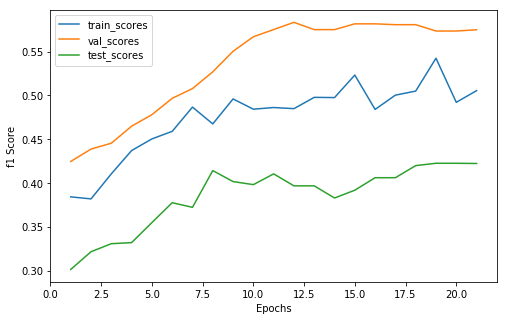

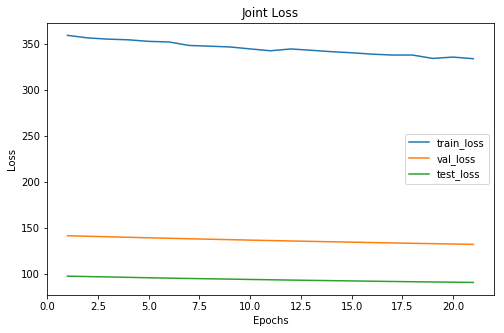

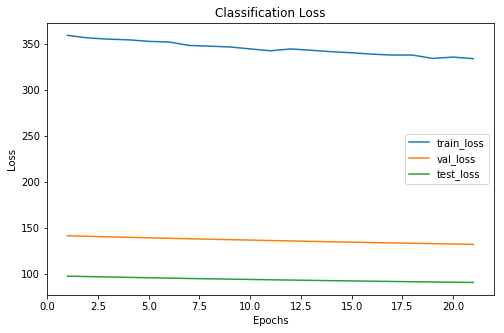

Cofusion Matrix For Val Set: 
--  --  --
32  12   6
16  29   5
 8   8  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      140     56      38
 1      126     49      32
 2       61     25      18
xxxxxxxxxxxxxx epoch: 21 xxxxxxxxxxxxxx


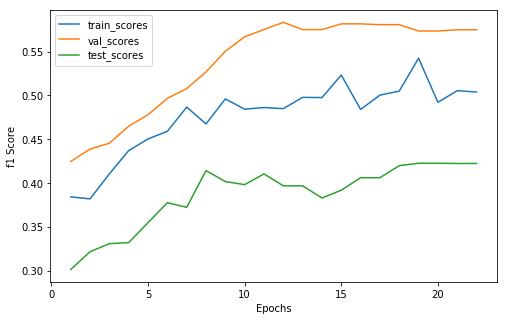

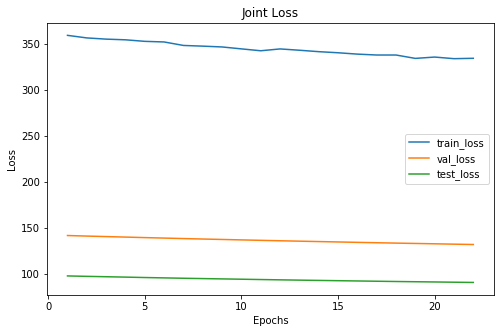

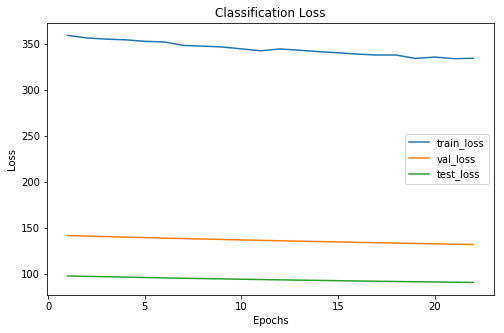

Cofusion Matrix For Val Set: 
--  --  --
32  12   6
16  29   5
 8   8  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      133     56      38
 1      128     49      32
 2       66     25      18
xxxxxxxxxxxxxx epoch: 22 xxxxxxxxxxxxxx


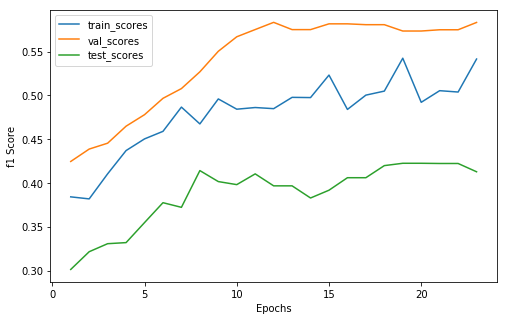

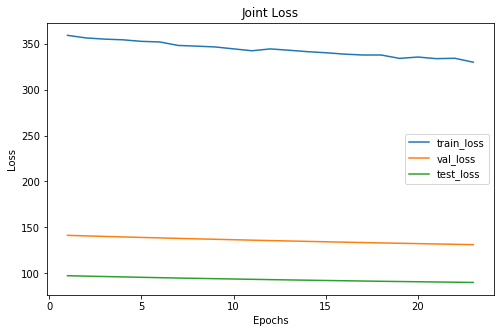

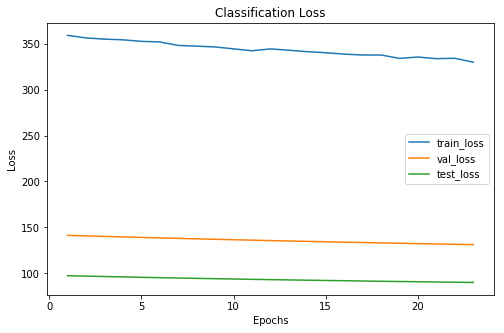

Cofusion Matrix For Val Set: 
--  --  --
32  12   6
16  29   5
 7   8  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      133     55      37
 1      129     49      32
 2       65     26      19
xxxxxxxxxxxxxx epoch: 23 xxxxxxxxxxxxxx


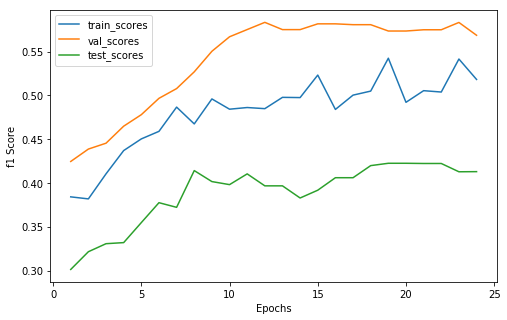

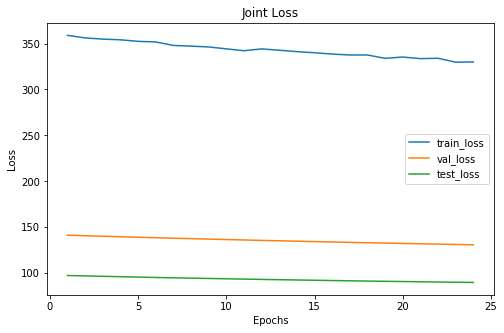

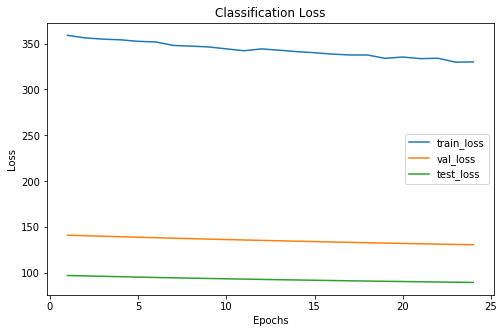

Cofusion Matrix For Val Set: 
--  --  --
30  12   8
16  29   5
 7   8  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      132     53      36
 1      135     49      32
 2       60     28      20
xxxxxxxxxxxxxx epoch: 24 xxxxxxxxxxxxxx


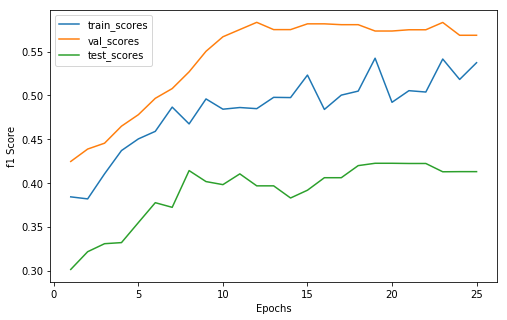

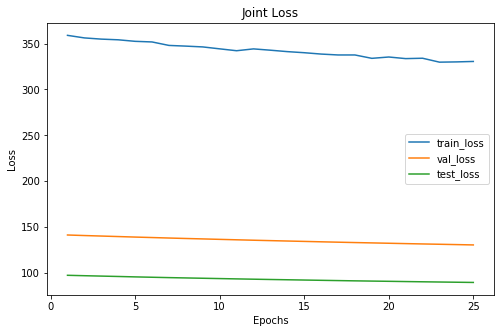

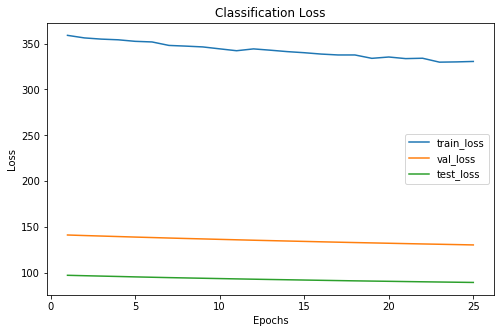

Cofusion Matrix For Val Set: 
--  --  --
30  12   8
16  29   5
 7   8  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      121     53      36
 1      132     49      32
 2       74     28      20
xxxxxxxxxxxxxx epoch: 25 xxxxxxxxxxxxxx


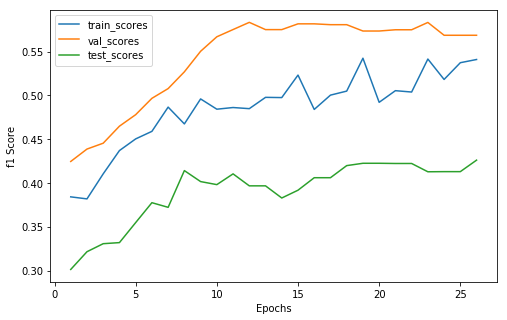

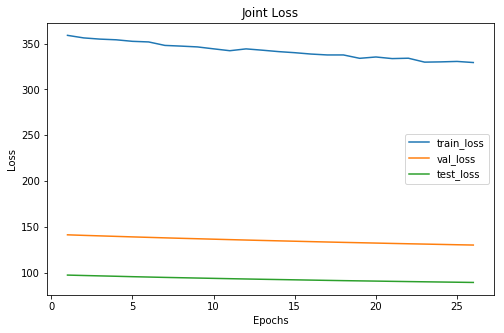

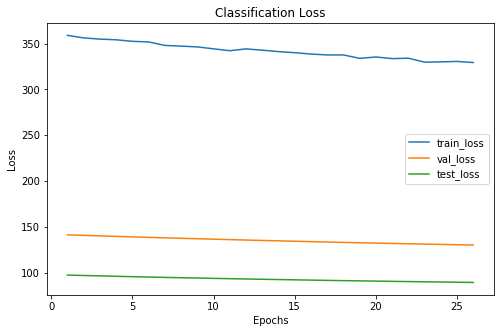

Cofusion Matrix For Val Set: 
--  --  --
30  12   8
16  29   5
 7   8  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      131     53      34
 1      136     49      32
 2       60     28      22
xxxxxxxxxxxxxx epoch: 26 xxxxxxxxxxxxxx


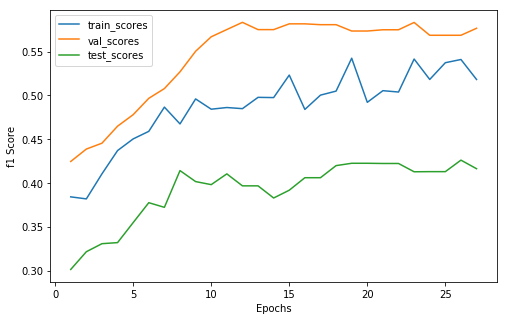

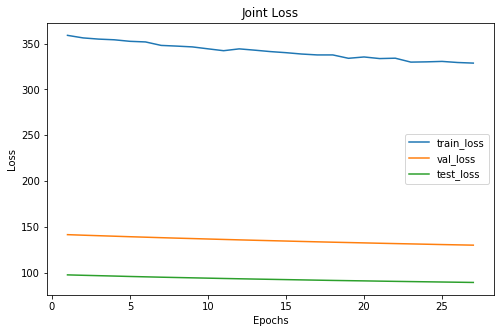

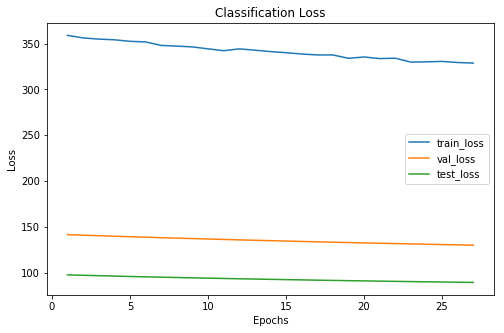

Cofusion Matrix For Val Set: 
--  --  --
30  12   8
16  29   5
 6   8  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      129     52      33
 1      135     49      32
 2       63     29      23
xxxxxxxxxxxxxx epoch: 27 xxxxxxxxxxxxxx


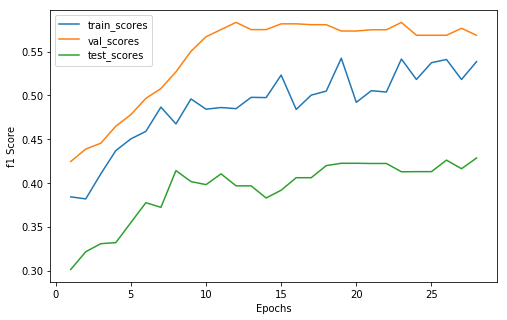

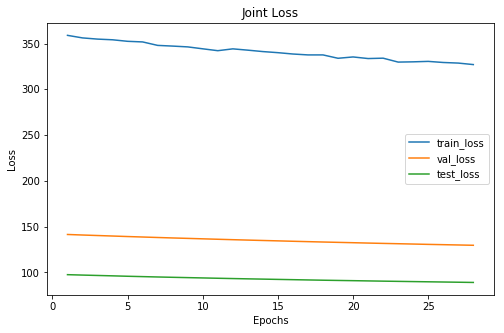

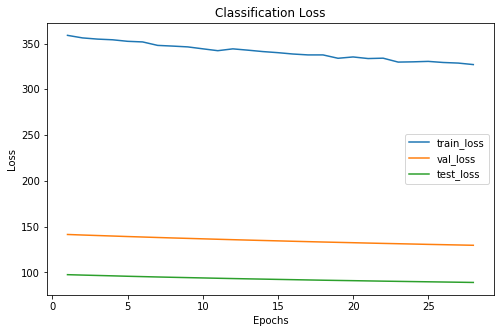

Cofusion Matrix For Val Set: 
--  --  --
30  12   8
16  29   5
 6   9  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      128     52      32
 1      140     50      32
 2       59     28      24
xxxxxxxxxxxxxx epoch: 28 xxxxxxxxxxxxxx


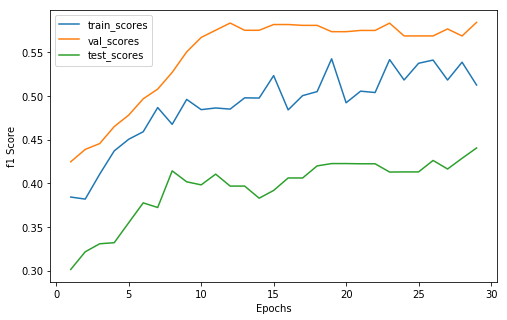

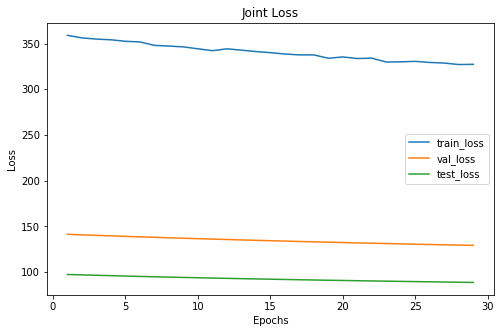

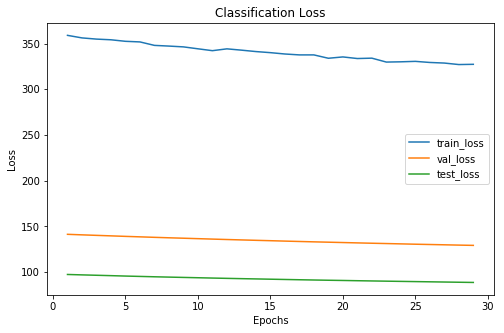

Cofusion Matrix For Val Set: 
--  --  --
30  12   8
16  30   4
 5   9  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      127     51      32
 1      134     51      33
 2       66     28      23
xxxxxxxxxxxxxx epoch: 29 xxxxxxxxxxxxxx


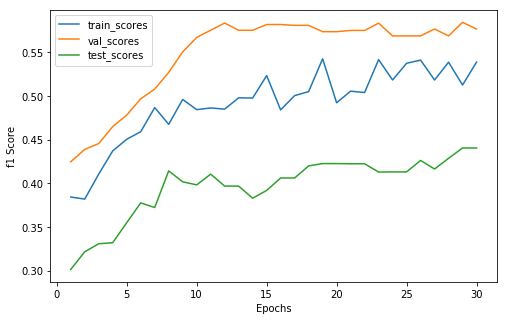

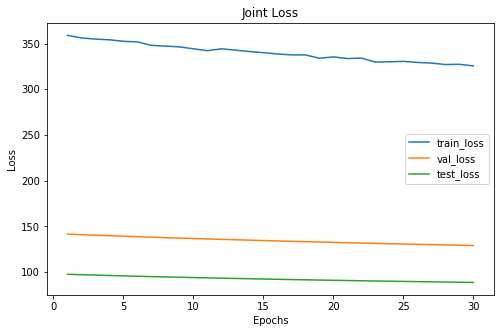

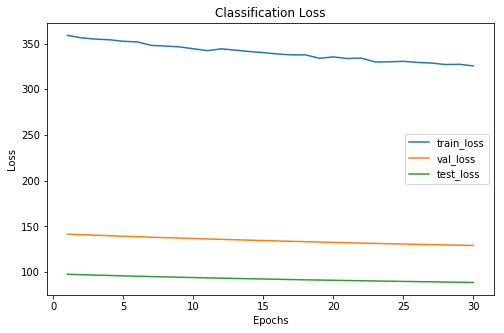

Cofusion Matrix For Val Set: 
--  --  --
30  12   8
17  29   4
 5   9  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      122     52      32
 1      134     50      33
 2       71     28      23
xxxxxxxxxxxxxx epoch: 30 xxxxxxxxxxxxxx


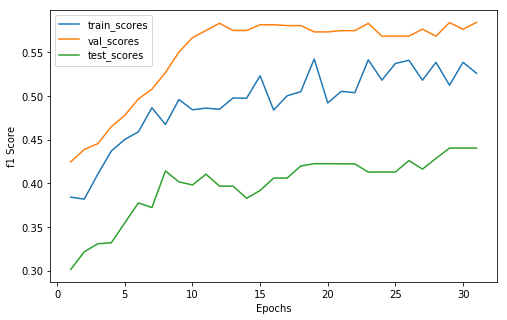

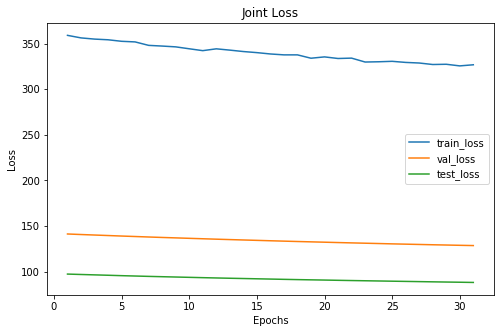

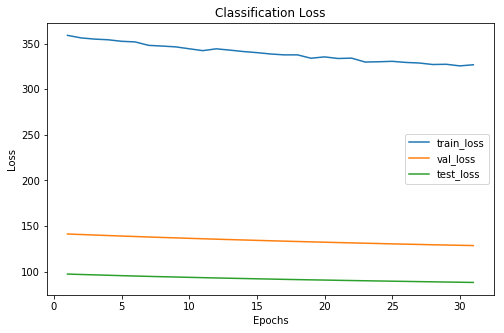

Cofusion Matrix For Val Set: 
--  --  --
30  12   8
17  29   4
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     51      32
 1      137     50      33
 2       64     29      23
xxxxxxxxxxxxxx epoch: 31 xxxxxxxxxxxxxx


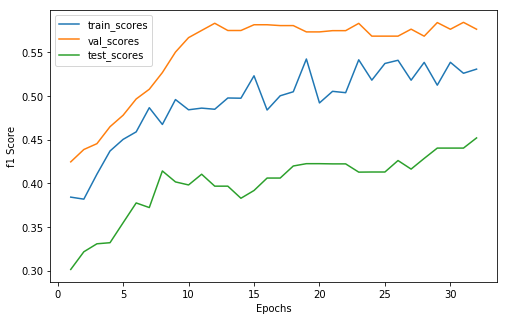

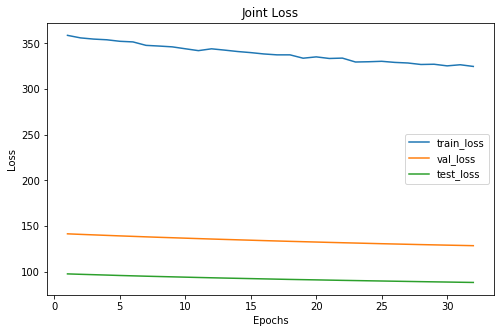

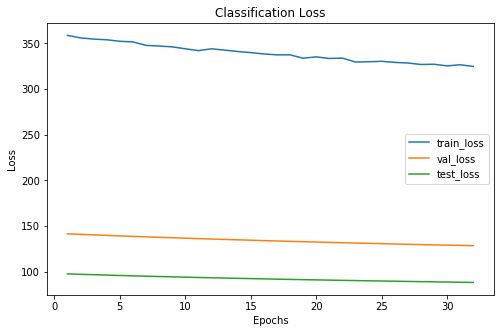

Cofusion Matrix For Val Set: 
--  --  --
30  12   8
17  29   4
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      130     51      32
 1      133     51      34
 2       64     28      22
xxxxxxxxxxxxxx epoch: 32 xxxxxxxxxxxxxx


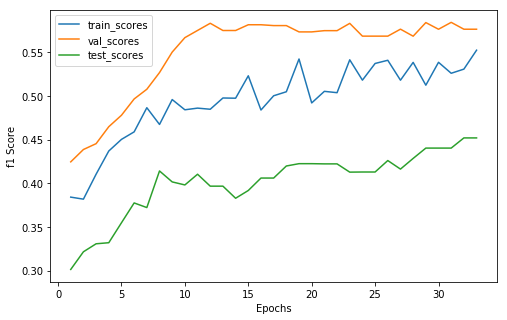

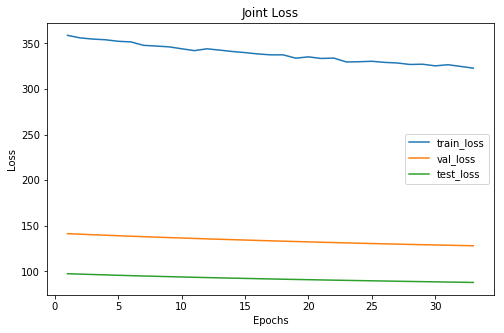

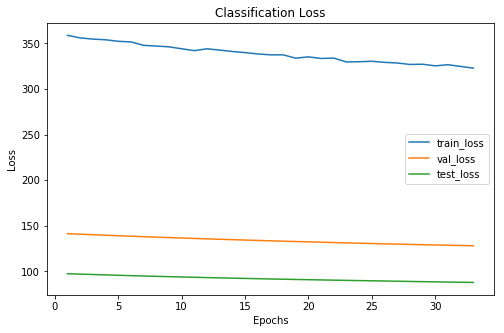

Cofusion Matrix For Val Set: 
--  --  --
30  12   8
17  29   4
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      128     51      32
 1      133     51      34
 2       66     28      22
xxxxxxxxxxxxxx epoch: 33 xxxxxxxxxxxxxx


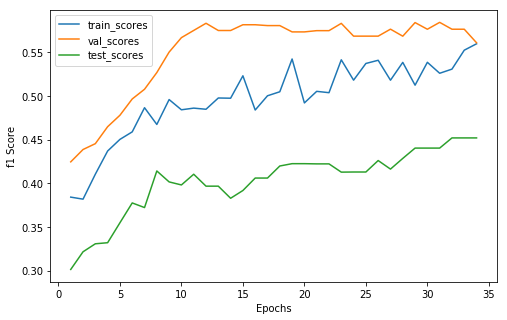

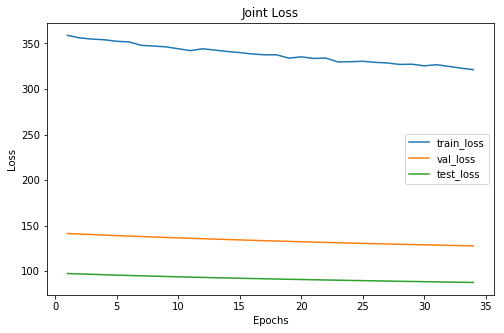

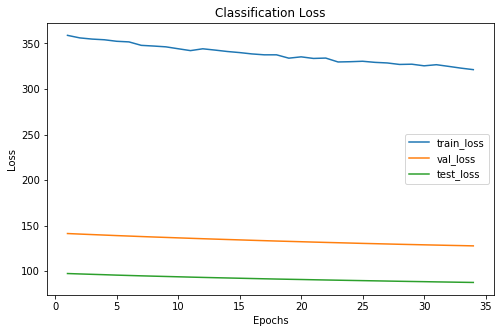

Cofusion Matrix For Val Set: 
--  --  --
29  12   9
17  29   4
 4  11  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      124     50      32
 1      137     52      34
 2       66     28      22
xxxxxxxxxxxxxx epoch: 34 xxxxxxxxxxxxxx


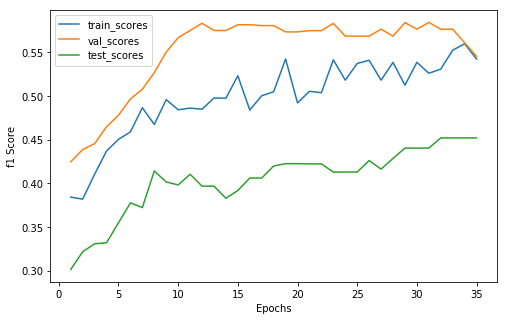

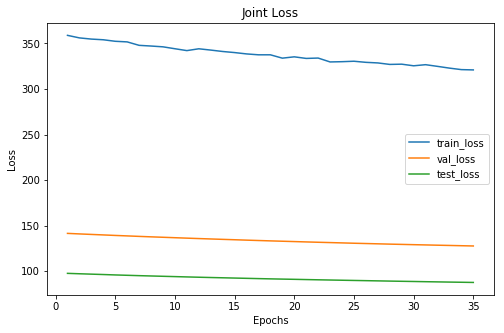

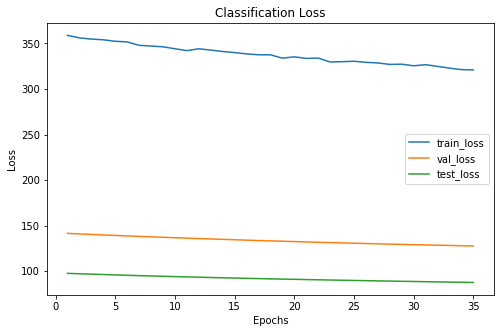

Cofusion Matrix For Val Set: 
--  --  --
28  12  10
17  29   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      116     49      32
 1      139     53      34
 2       72     28      22
xxxxxxxxxxxxxx epoch: 35 xxxxxxxxxxxxxx


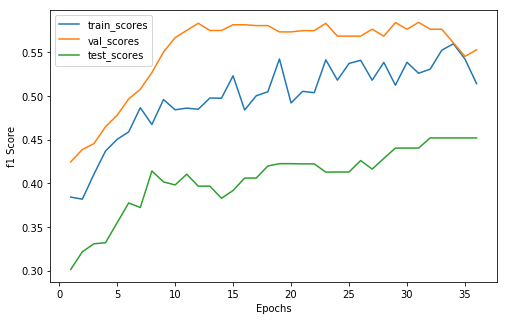

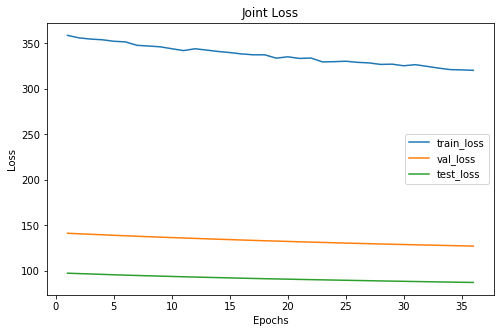

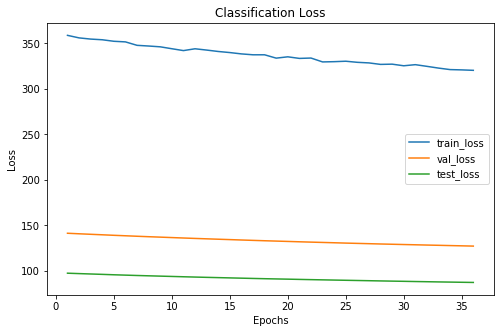

Cofusion Matrix For Val Set: 
--  --  --
28  12  10
16  30   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      126     48      32
 1      138     54      34
 2       63     28      22
xxxxxxxxxxxxxx epoch: 36 xxxxxxxxxxxxxx


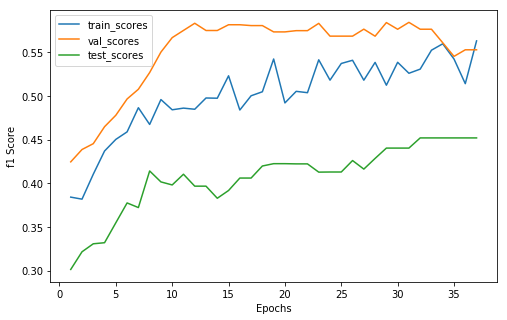

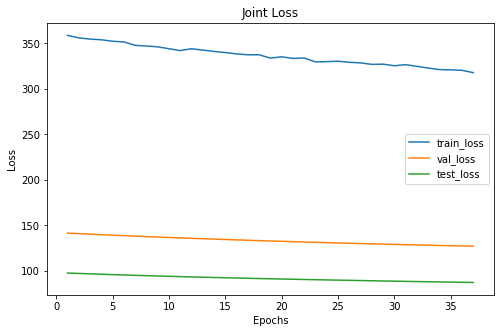

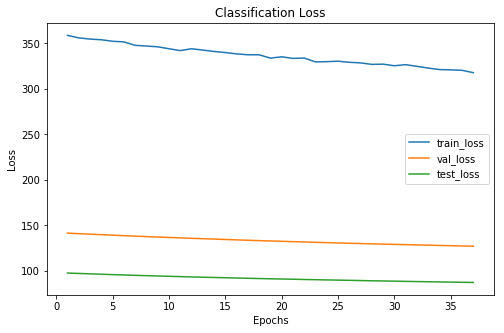

Cofusion Matrix For Val Set: 
--  --  --
28  12  10
16  30   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      114     48      32
 1      149     54      34
 2       64     28      22
xxxxxxxxxxxxxx epoch: 37 xxxxxxxxxxxxxx


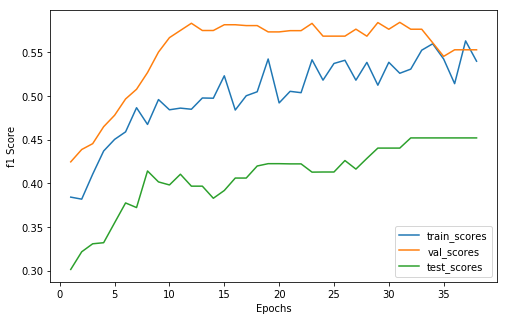

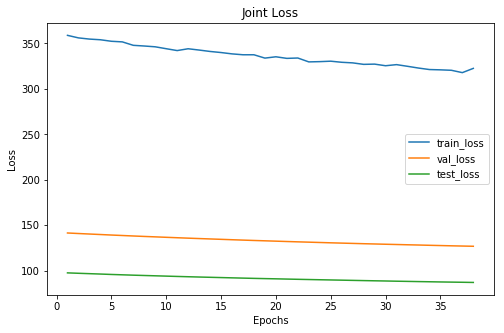

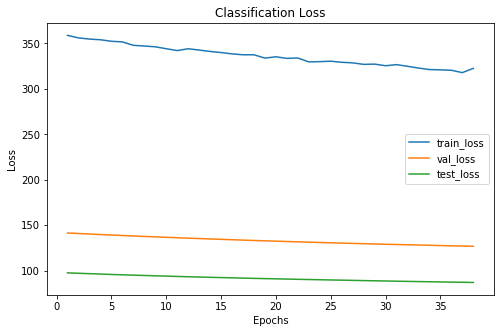

Cofusion Matrix For Val Set: 
--  --  --
28  12  10
16  30   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      109     48      32
 1      144     54      34
 2       74     28      22
xxxxxxxxxxxxxx epoch: 38 xxxxxxxxxxxxxx


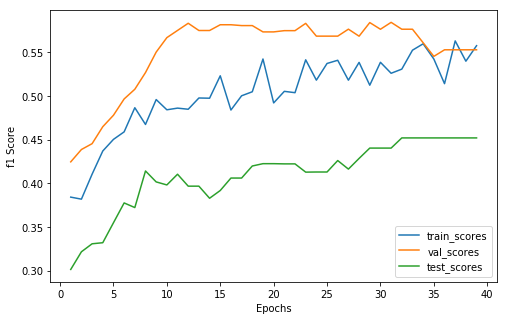

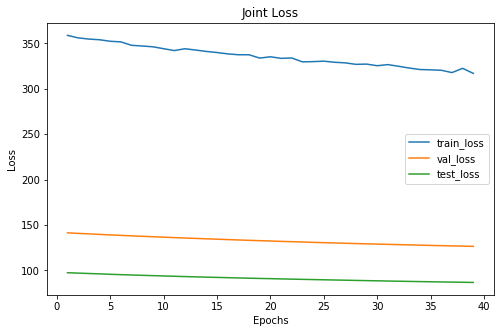

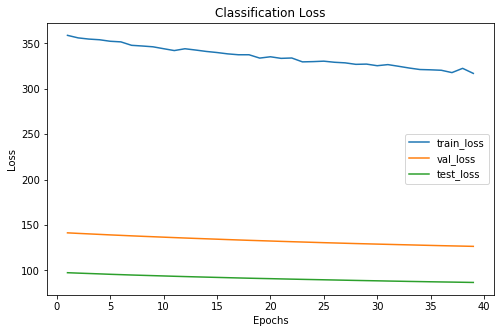

Cofusion Matrix For Val Set: 
--  --  --
28  12  10
16  30   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      105     48      32
 1      147     54      34
 2       75     28      22
xxxxxxxxxxxxxx epoch: 39 xxxxxxxxxxxxxx


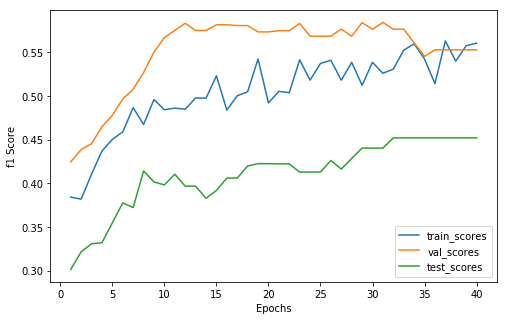

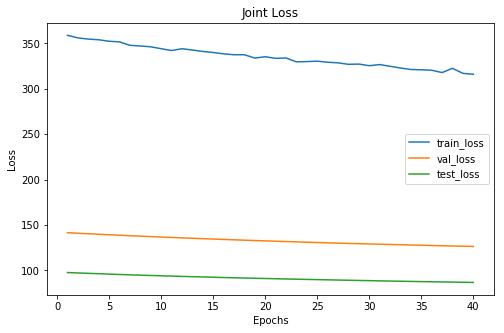

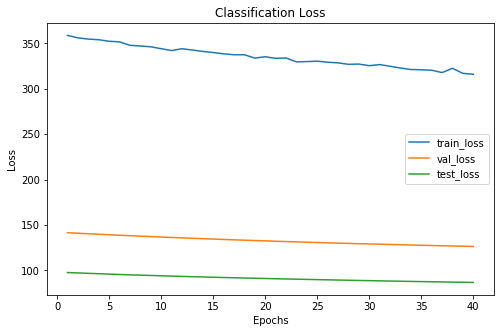

Cofusion Matrix For Val Set: 
--  --  --
28  12  10
16  30   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      114     48      32
 1      141     54      34
 2       72     28      22
xxxxxxxxxxxxxx epoch: 40 xxxxxxxxxxxxxx


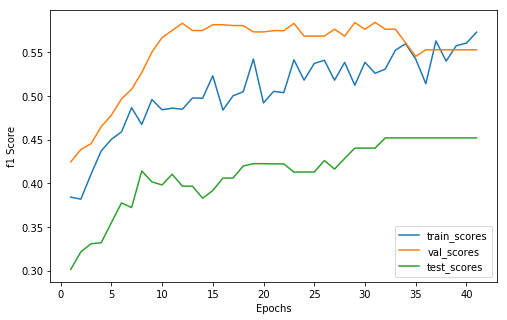

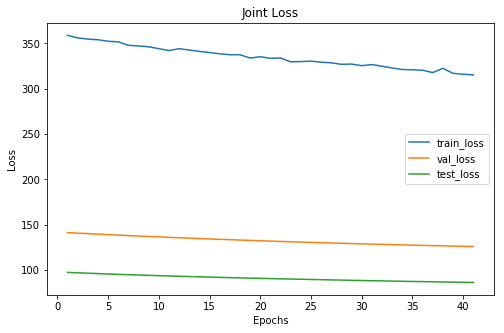

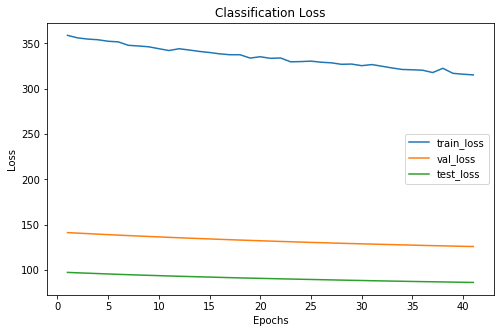

Cofusion Matrix For Val Set: 
--  --  --
28  12  10
16  30   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      115     48      32
 1      139     54      34
 2       73     28      22
xxxxxxxxxxxxxx epoch: 41 xxxxxxxxxxxxxx


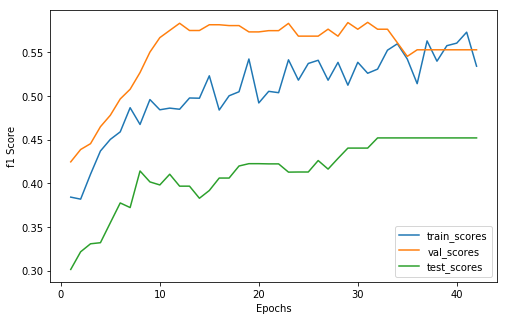

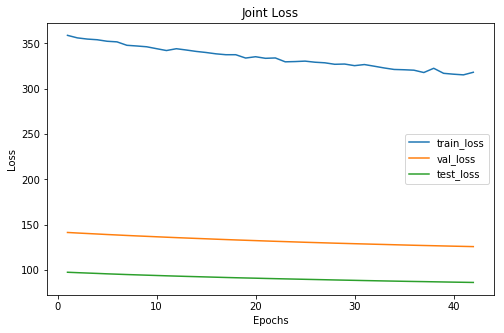

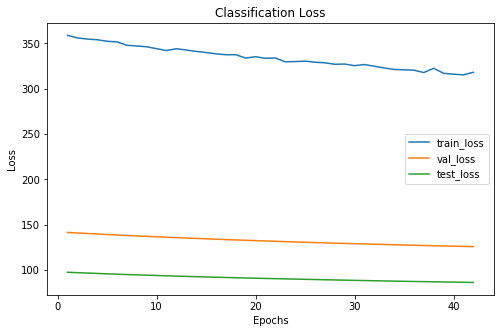

Cofusion Matrix For Val Set: 
--  --  --
28  12  10
16  30   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      109     48      32
 1      152     54      34
 2       66     28      22
xxxxxxxxxxxxxx epoch: 42 xxxxxxxxxxxxxx


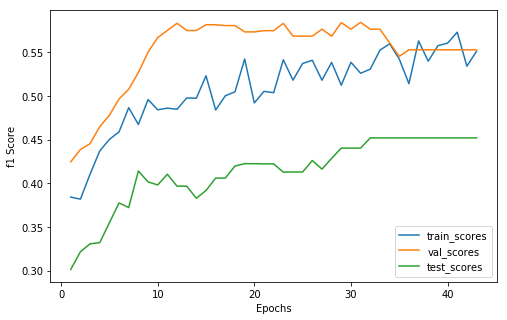

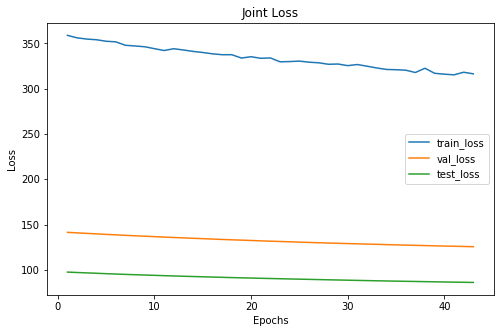

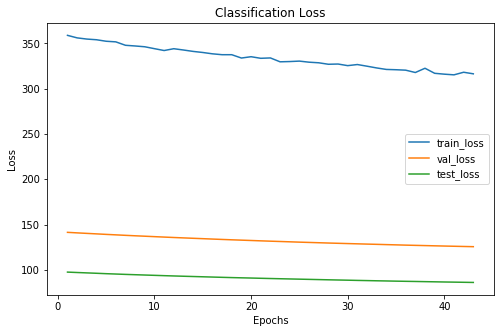

Cofusion Matrix For Val Set: 
--  --  --
28  12  10
16  30   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      111     48      32
 1      147     54      34
 2       69     28      22
xxxxxxxxxxxxxx epoch: 43 xxxxxxxxxxxxxx


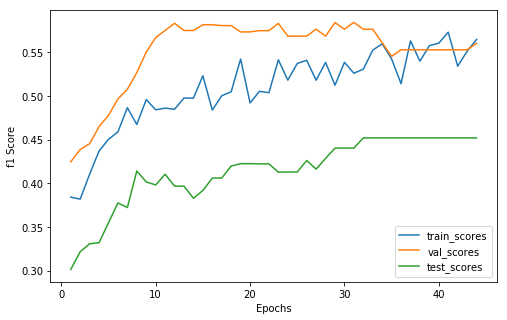

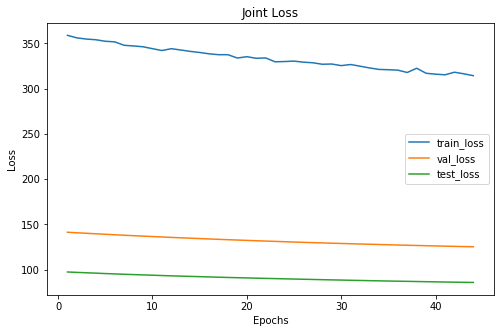

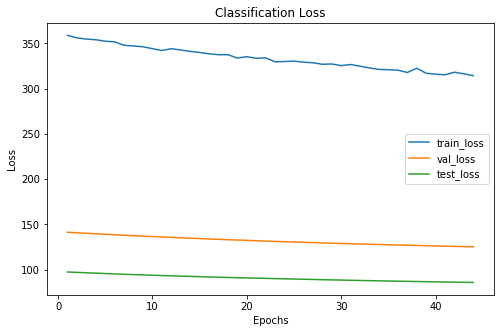

Cofusion Matrix For Val Set: 
--  --  --
28  12  10
15  31   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      103     47      32
 1      158     55      34
 2       66     28      22
xxxxxxxxxxxxxx epoch: 44 xxxxxxxxxxxxxx


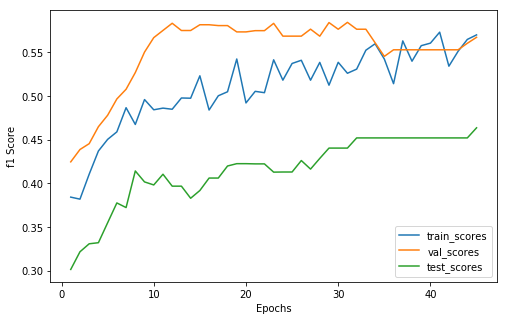

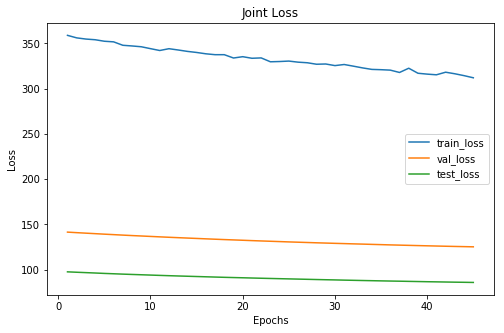

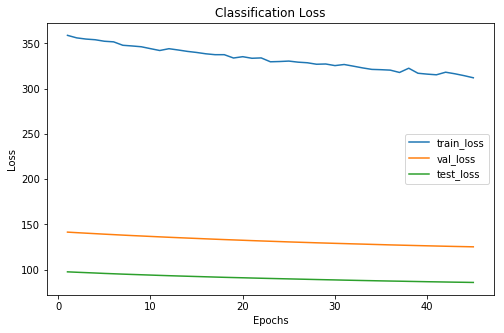

Cofusion Matrix For Val Set: 
--  --  --
27  13  10
13  33   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      103     44      31
 1      148     58      35
 2       76     28      22
xxxxxxxxxxxxxx epoch: 45 xxxxxxxxxxxxxx


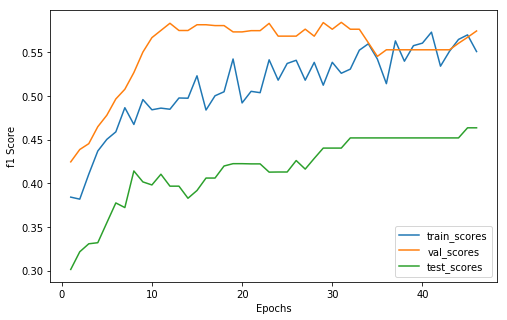

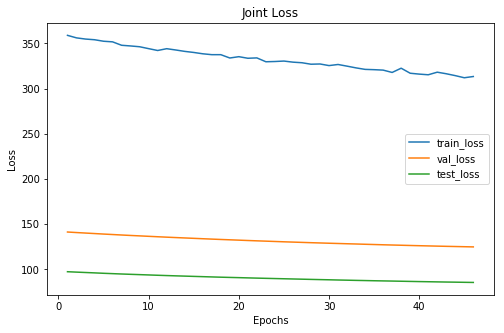

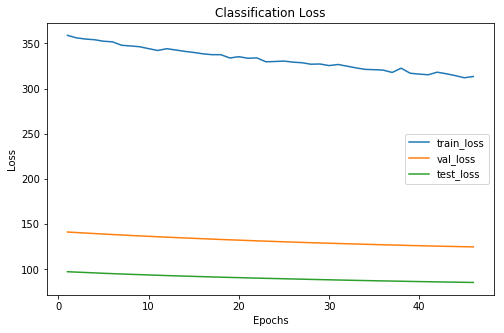

Cofusion Matrix For Val Set: 
--  --  --
27  13  10
12  34   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      105     43      31
 1      150     59      35
 2       72     28      22
xxxxxxxxxxxxxx epoch: 46 xxxxxxxxxxxxxx


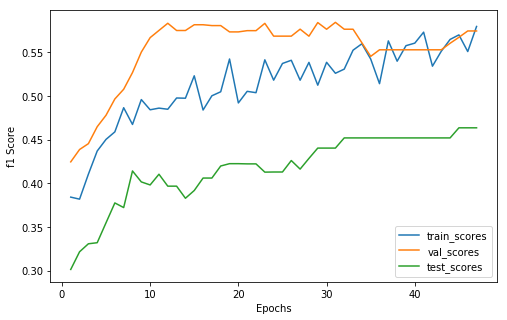

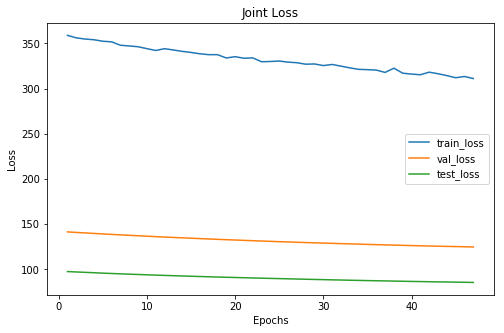

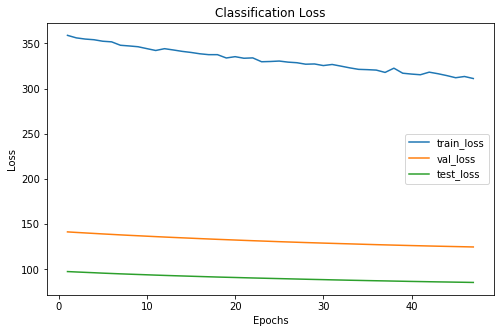

Cofusion Matrix For Val Set: 
--  --  --
27  13  10
12  34   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      104     43      31
 1      146     59      35
 2       77     28      22
xxxxxxxxxxxxxx epoch: 47 xxxxxxxxxxxxxx


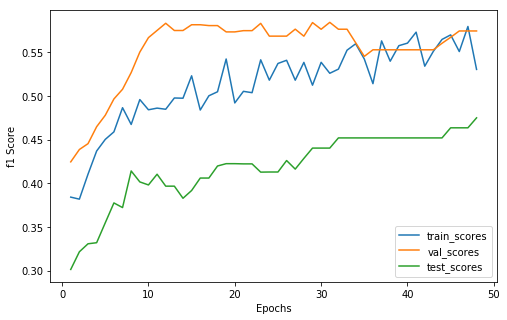

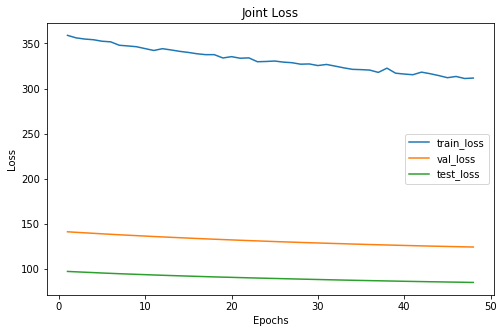

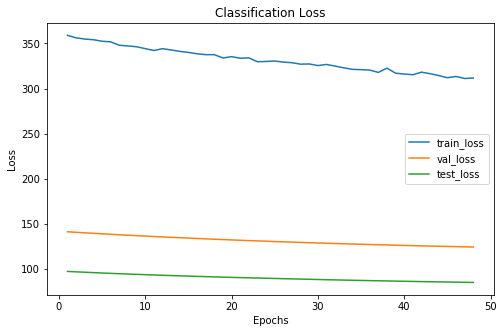

Cofusion Matrix For Val Set: 
--  --  --
27  13  10
12  34   4
 4  12  14
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       97     43      30
 1      151     59      36
 2       79     28      22
xxxxxxxxxxxxxx epoch: 48 xxxxxxxxxxxxxx


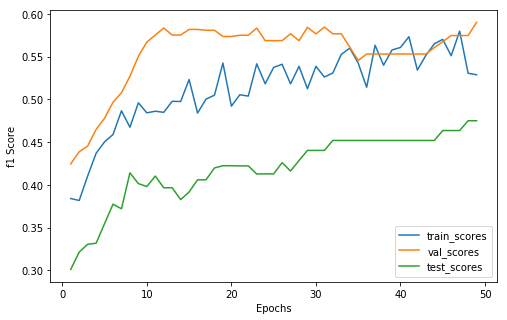

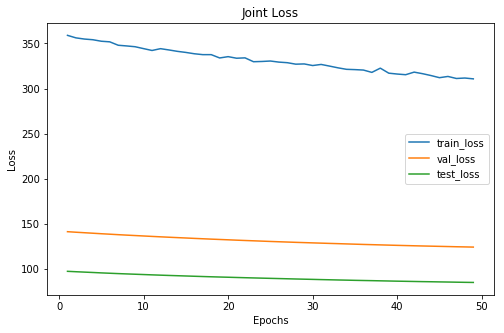

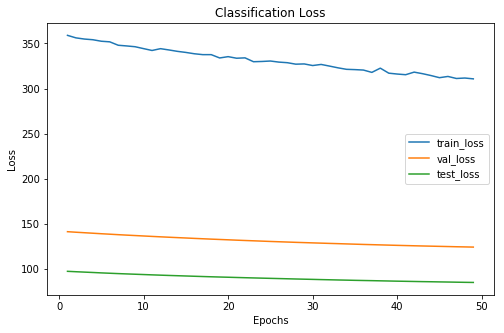

Cofusion Matrix For Val Set: 
--  --  --
27  13  10
11  35   4
 4  11  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      102     42      30
 1      156     59      36
 2       69     29      22
xxxxxxxxxxxxxx epoch: 49 xxxxxxxxxxxxxx


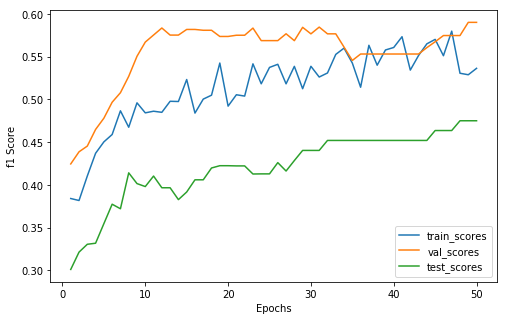

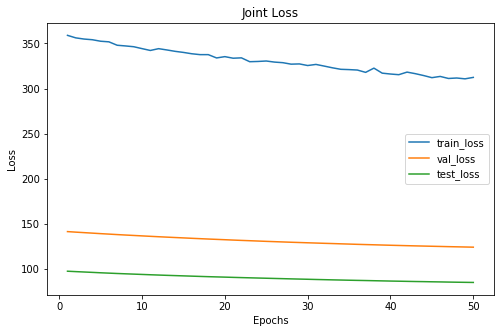

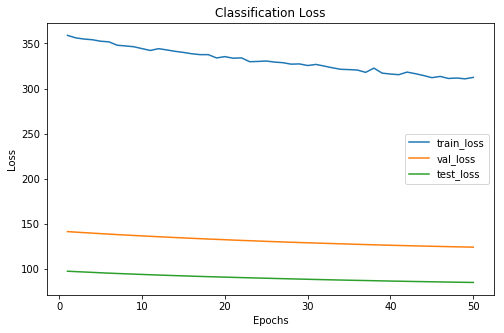

Cofusion Matrix For Val Set: 
--  --  --
27  13  10
11  35   4
 4  11  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       97     42      30
 1      156     59      36
 2       74     29      22
xxxxxxxxxxxxxx epoch: 50 xxxxxxxxxxxxxx


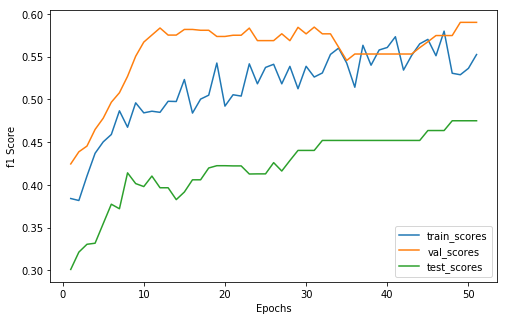

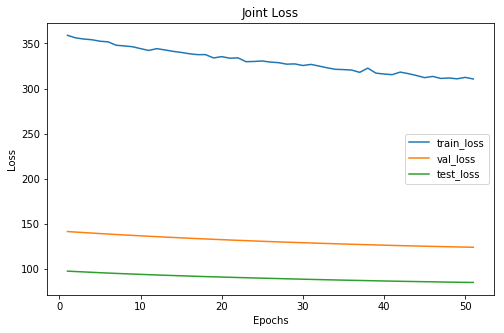

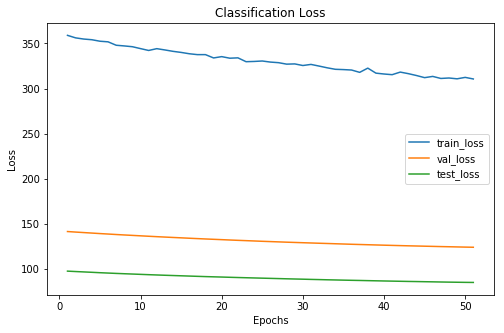

Cofusion Matrix For Val Set: 
--  --  --
27  13  10
11  35   4
 4  11  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      102     42      30
 1      149     59      36
 2       76     29      22
xxxxxxxxxxxxxx epoch: 51 xxxxxxxxxxxxxx


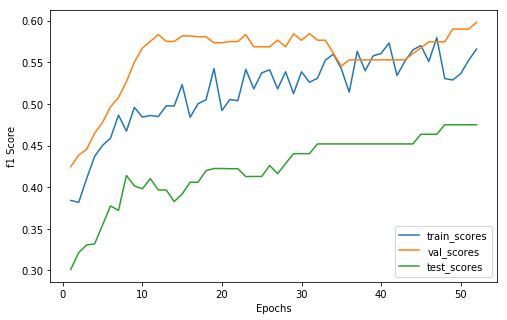

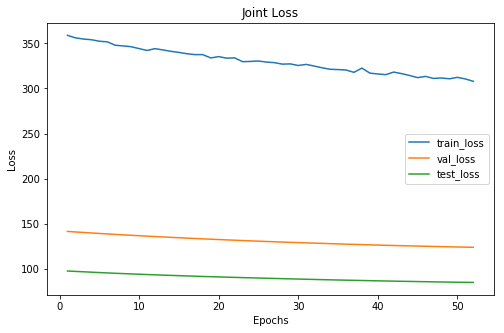

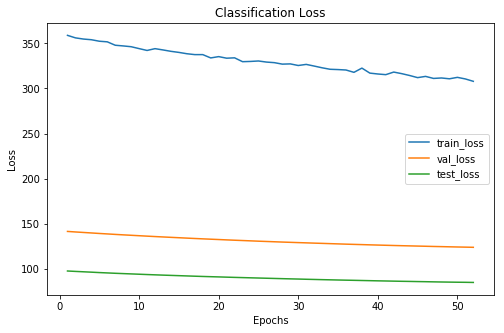

Cofusion Matrix For Val Set: 
--  --  --
27  13  10
11  35   4
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       89     42      30
 1      160     58      36
 2       78     30      22
xxxxxxxxxxxxxx epoch: 52 xxxxxxxxxxxxxx


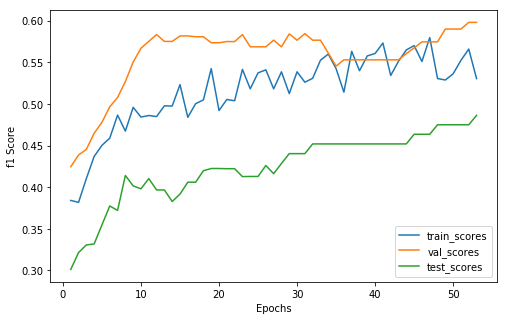

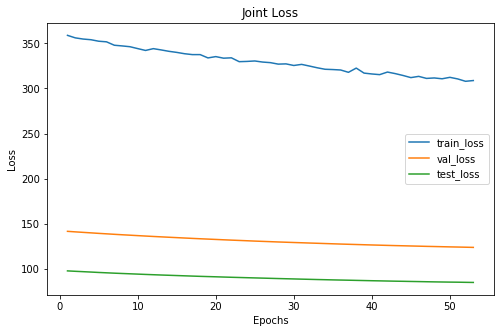

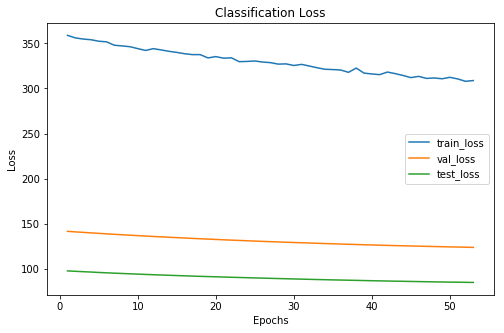

Cofusion Matrix For Val Set: 
--  --  --
27  13  10
11  35   4
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      100     42      29
 1      152     58      37
 2       75     30      22
xxxxxxxxxxxxxx epoch: 53 xxxxxxxxxxxxxx


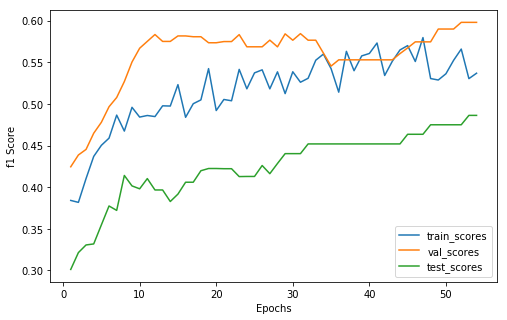

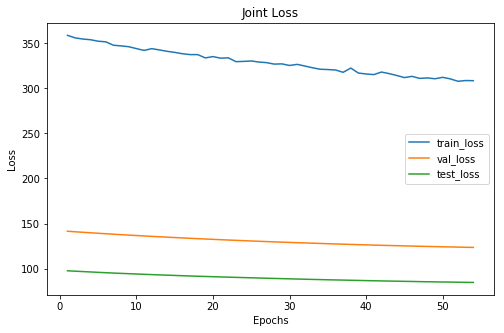

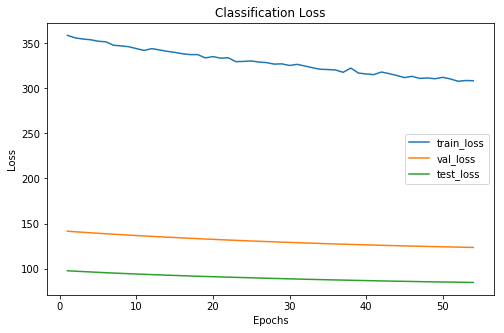

Cofusion Matrix For Val Set: 
--  --  --
27  13  10
11  35   4
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      101     42      29
 1      148     58      37
 2       78     30      22
xxxxxxxxxxxxxx epoch: 54 xxxxxxxxxxxxxx


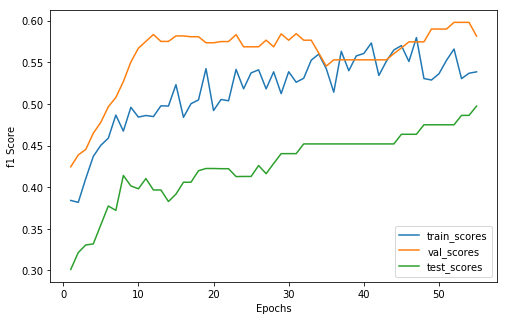

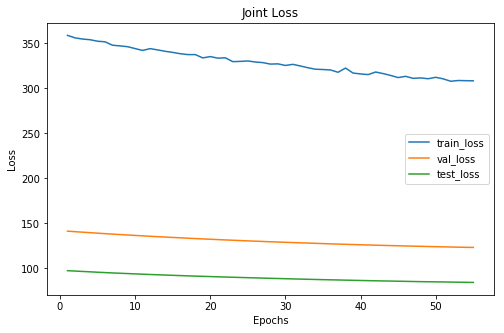

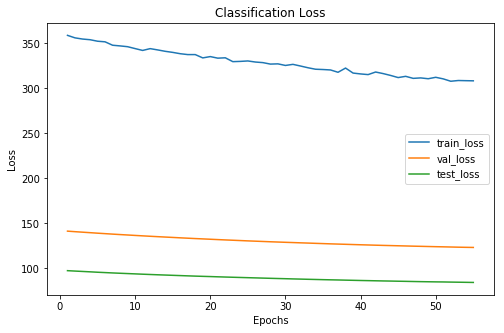

Cofusion Matrix For Val Set: 
--  --  --
25  15  10
11  35   4
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       99     40      28
 1      156     60      38
 2       72     30      22
xxxxxxxxxxxxxx epoch: 55 xxxxxxxxxxxxxx


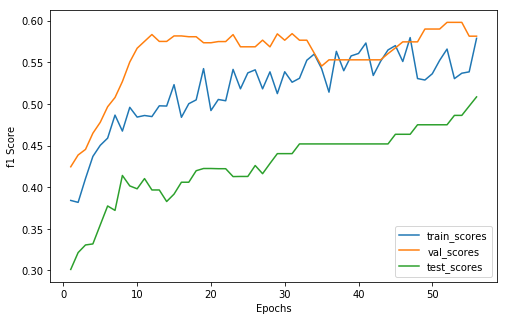

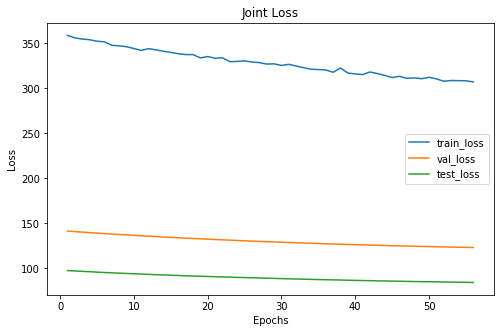

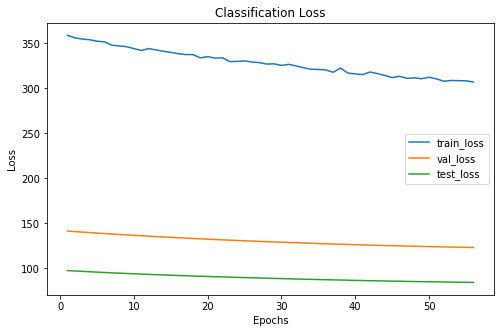

Cofusion Matrix For Val Set: 
--  --  --
25  15  10
11  35   4
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     40      27
 1      171     60      39
 2       69     30      22
xxxxxxxxxxxxxx epoch: 56 xxxxxxxxxxxxxx


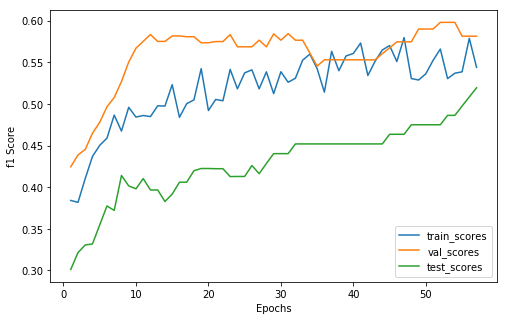

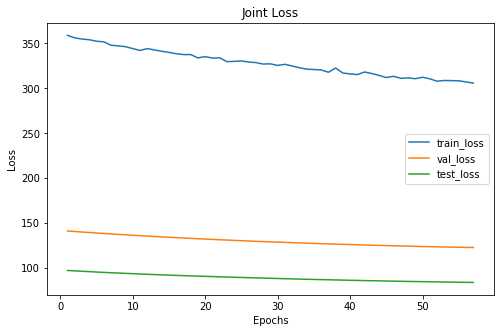

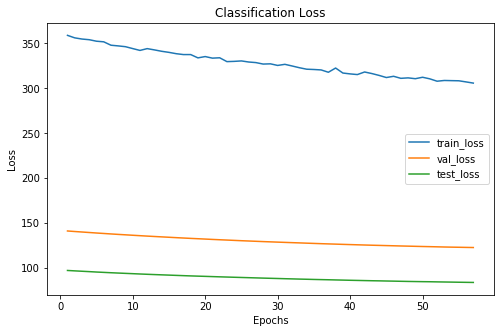

Cofusion Matrix For Val Set: 
--  --  --
25  15  10
11  35   4
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       95     40      26
 1      158     60      40
 2       74     30      22
xxxxxxxxxxxxxx epoch: 57 xxxxxxxxxxxxxx


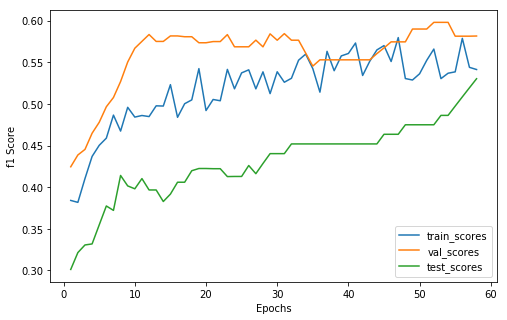

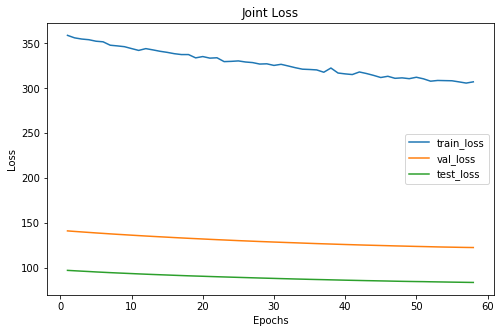

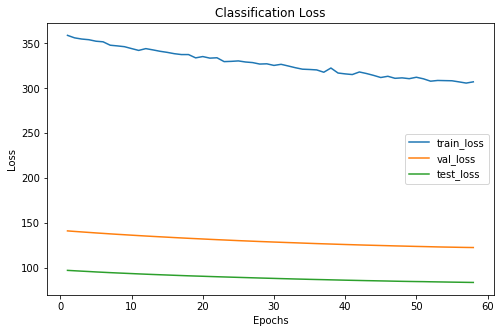

Cofusion Matrix For Val Set: 
--  --  --
25  15  10
11  35   4
 3  11  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       95     39      25
 1      160     61      41
 2       72     30      22
xxxxxxxxxxxxxx epoch: 58 xxxxxxxxxxxxxx


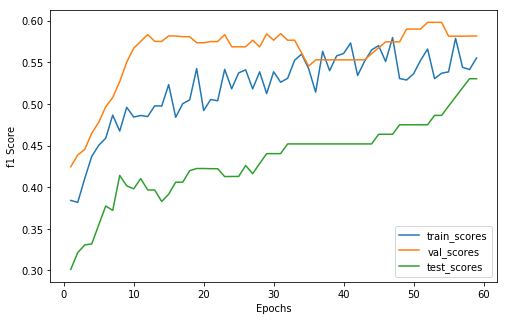

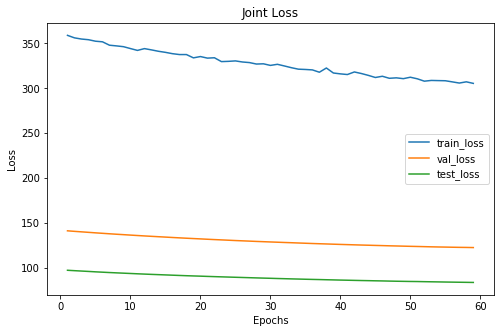

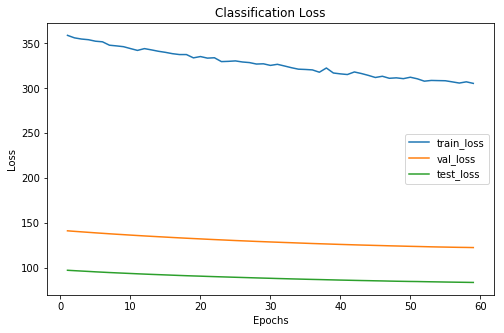

Cofusion Matrix For Val Set: 
--  --  --
25  15  10
11  35   4
 3  11  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       96     39      25
 1      152     61      41
 2       79     30      22
xxxxxxxxxxxxxx epoch: 59 xxxxxxxxxxxxxx


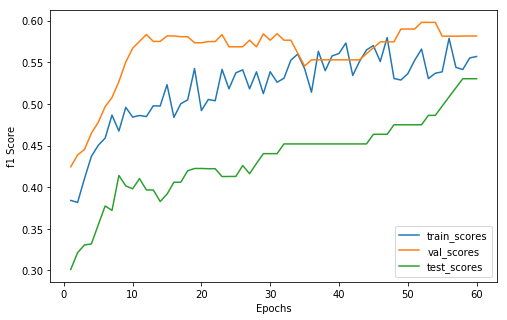

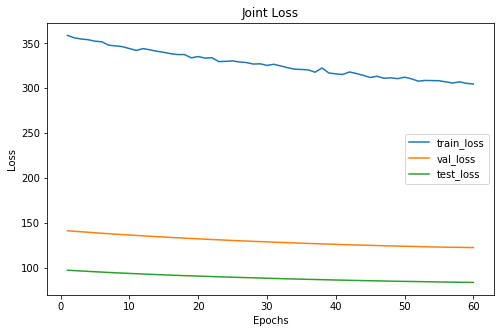

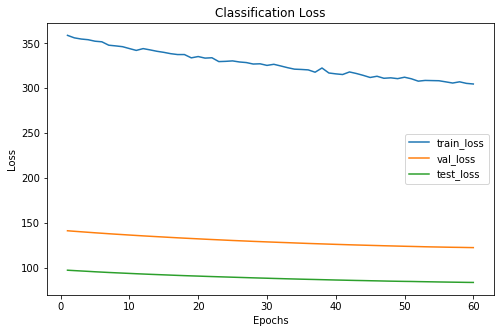

Cofusion Matrix For Val Set: 
--  --  --
25  15  10
11  35   4
 3  11  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     39      25
 1      159     61      41
 2       76     30      22
xxxxxxxxxxxxxx epoch: 60 xxxxxxxxxxxxxx


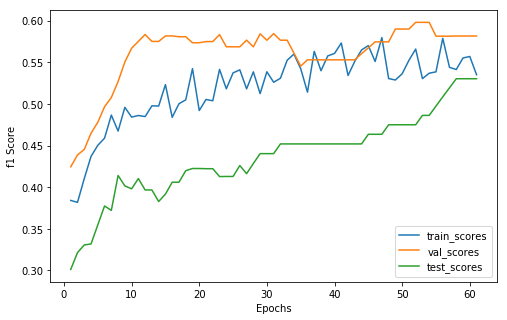

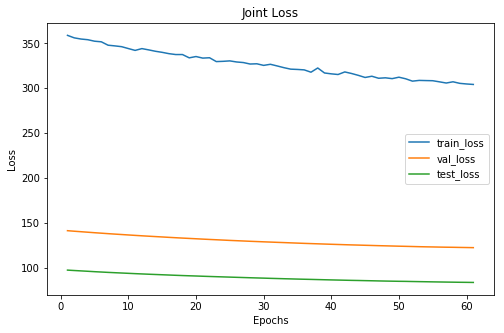

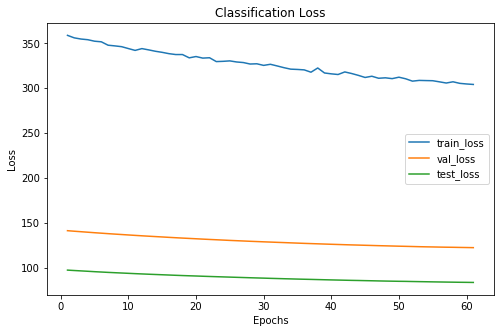

Cofusion Matrix For Val Set: 
--  --  --
25  15  10
11  35   4
 3  11  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     39      25
 1      161     61      41
 2       75     30      22
xxxxxxxxxxxxxx epoch: 61 xxxxxxxxxxxxxx


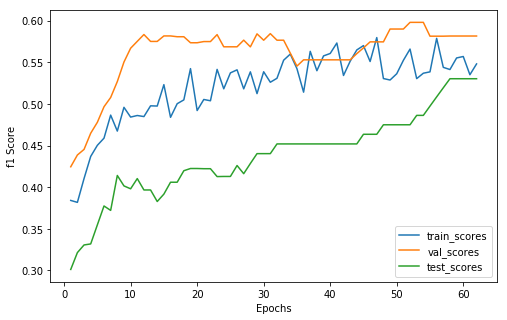

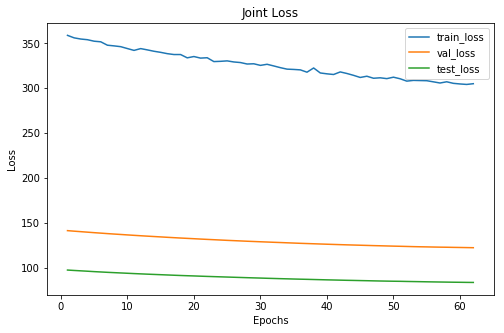

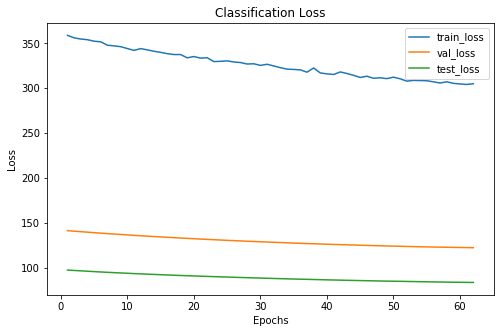

Cofusion Matrix For Val Set: 
--  --  --
25  15  10
11  35   4
 3  11  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       93     39      25
 1      160     61      41
 2       74     30      22
xxxxxxxxxxxxxx epoch: 62 xxxxxxxxxxxxxx


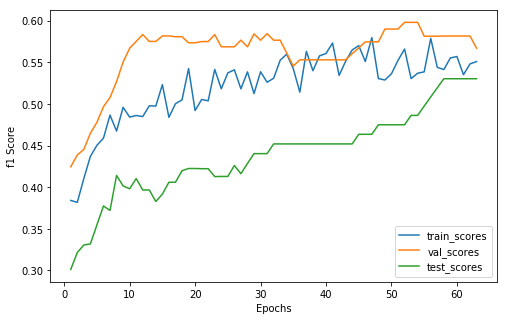

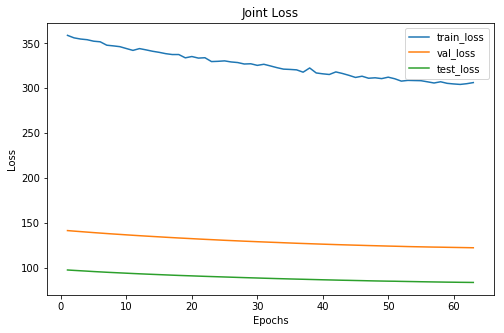

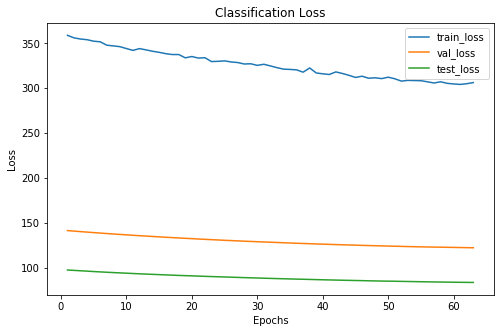

Cofusion Matrix For Val Set: 
--  --  --
25  15  10
11  34   5
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       93     39      25
 1      159     61      41
 2       75     30      22
xxxxxxxxxxxxxx epoch: 63 xxxxxxxxxxxxxx


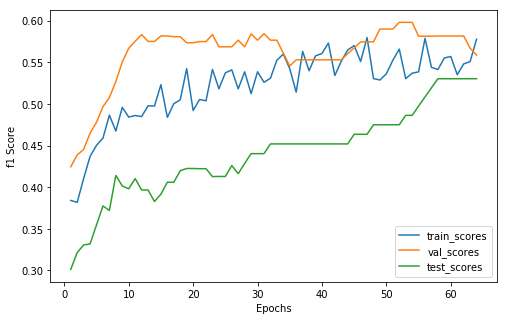

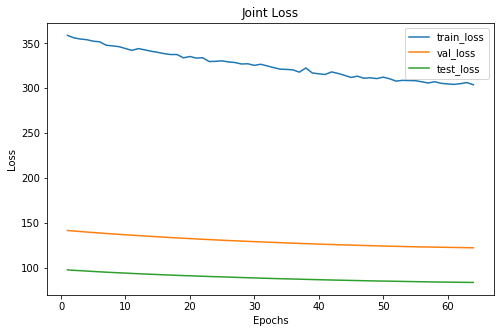

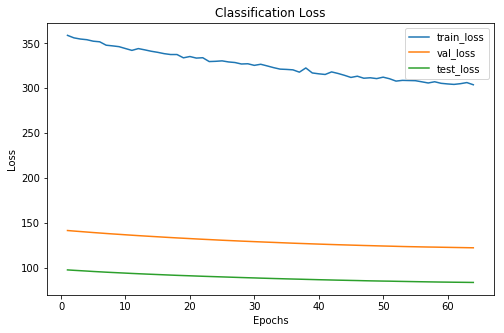

Cofusion Matrix For Val Set: 
--  --  --
24  16  10
11  34   5
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       94     38      25
 1      161     62      41
 2       72     30      22
xxxxxxxxxxxxxx epoch: 64 xxxxxxxxxxxxxx


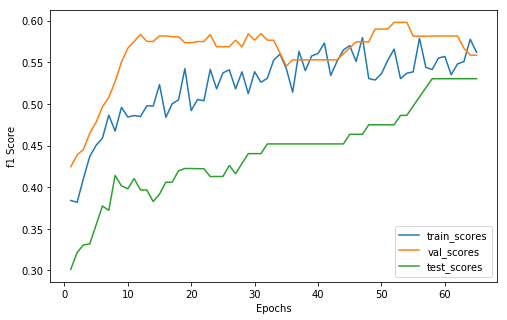

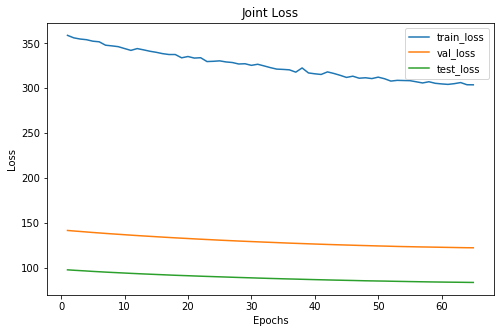

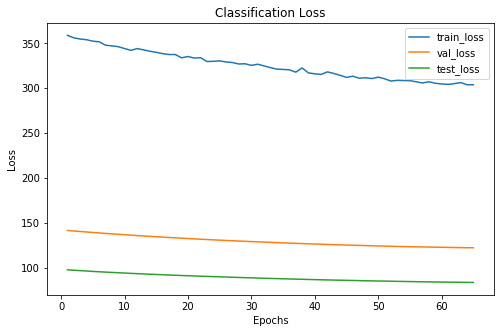

Cofusion Matrix For Val Set: 
--  --  --
24  16  10
11  34   5
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     38      25
 1      165     62      41
 2       71     30      22
xxxxxxxxxxxxxx epoch: 65 xxxxxxxxxxxxxx


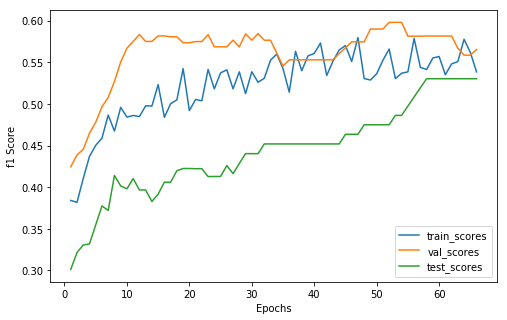

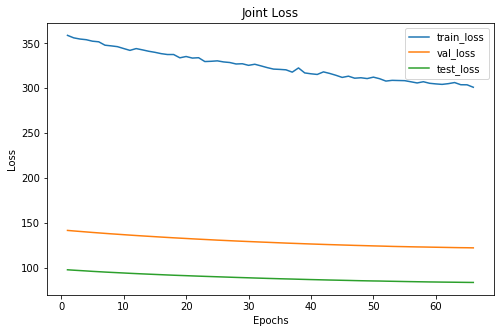

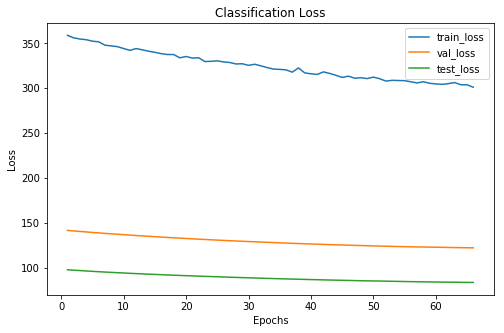

Cofusion Matrix For Val Set: 
--  --  --
24  16  10
11  35   4
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     38      25
 1      161     63      41
 2       79     29      22
xxxxxxxxxxxxxx epoch: 66 xxxxxxxxxxxxxx


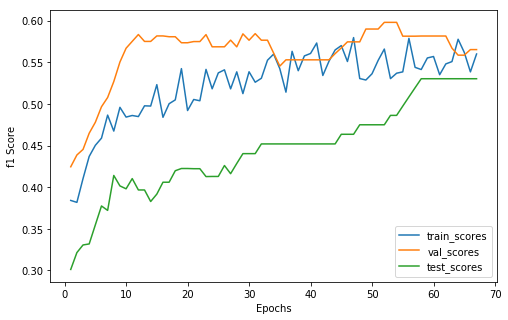

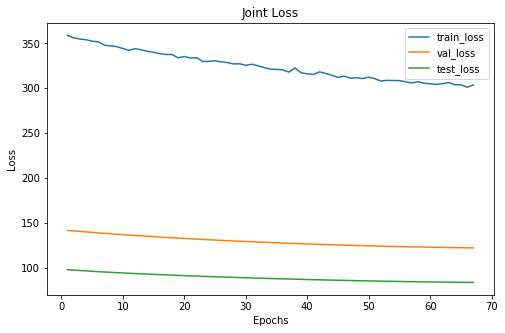

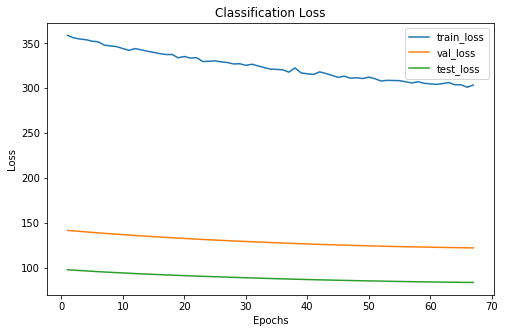

Cofusion Matrix For Val Set: 
--  --  --
24  16  10
11  35   4
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       95     38      25
 1      156     63      41
 2       76     29      22
xxxxxxxxxxxxxx epoch: 67 xxxxxxxxxxxxxx


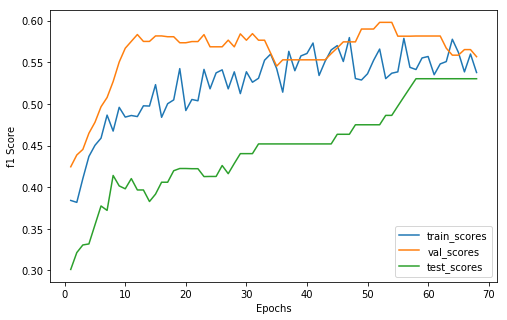

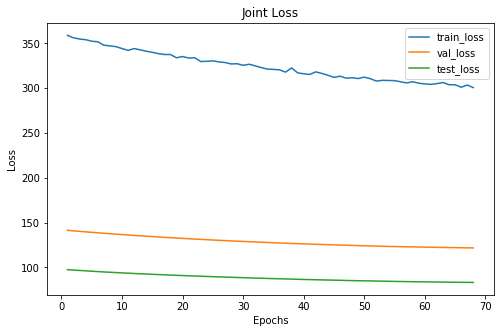

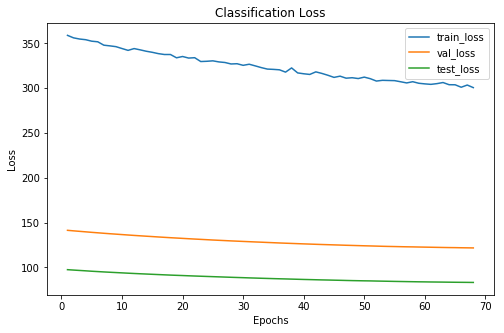

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
11  35   4
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     37      25
 1      162     64      41
 2       73     29      22
xxxxxxxxxxxxxx epoch: 68 xxxxxxxxxxxxxx


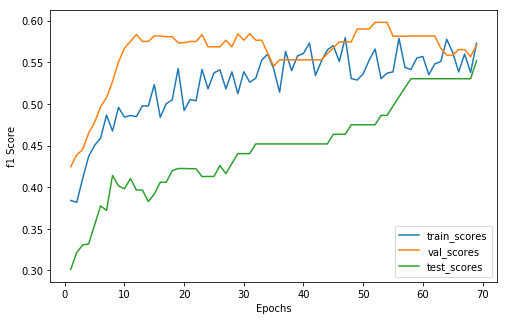

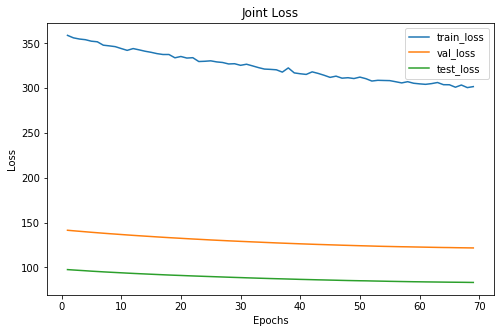

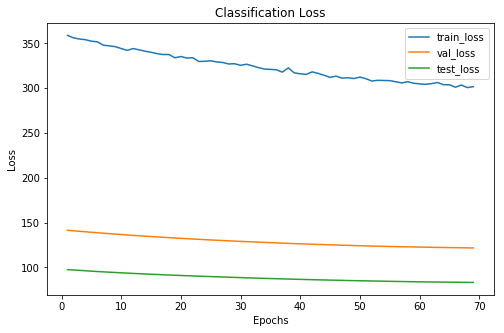

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  37   4
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      100     35      23
 1      153     66      43
 2       74     29      22
xxxxxxxxxxxxxx epoch: 69 xxxxxxxxxxxxxx


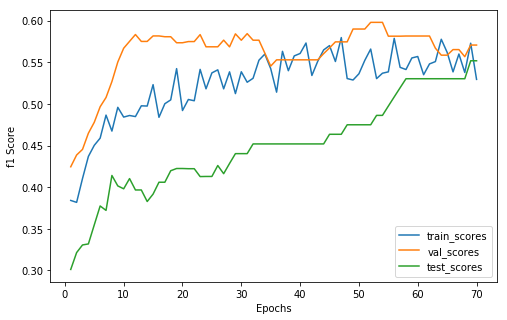

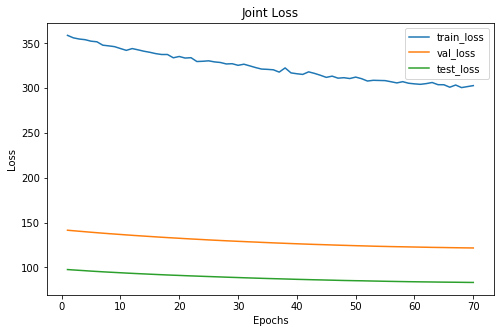

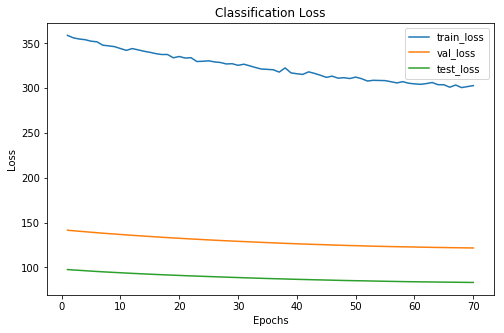

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  37   4
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       96     35      23
 1      157     66      43
 2       74     29      22
xxxxxxxxxxxxxx epoch: 70 xxxxxxxxxxxxxx


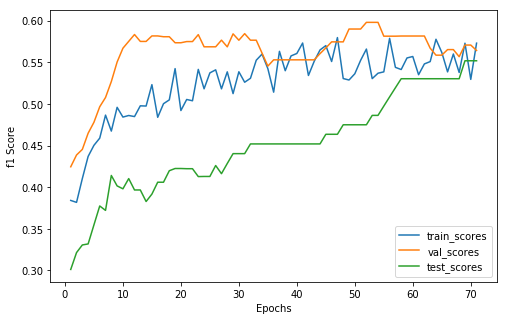

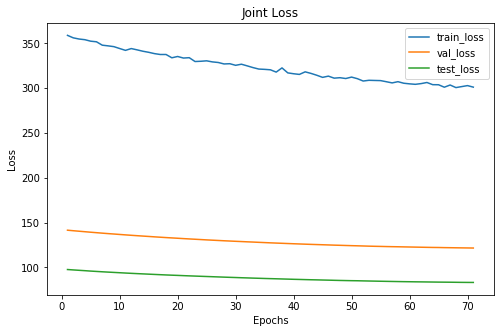

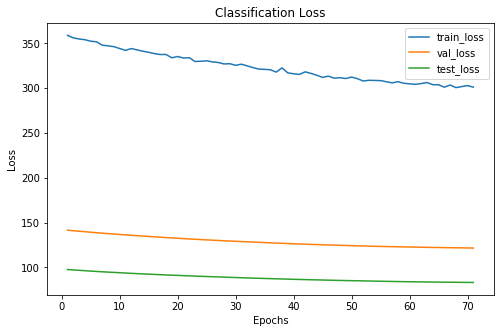

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  36   5
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       99     35      23
 1      155     65      43
 2       73     30      22
xxxxxxxxxxxxxx epoch: 71 xxxxxxxxxxxxxx


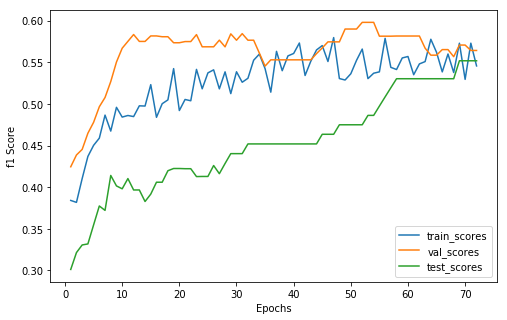

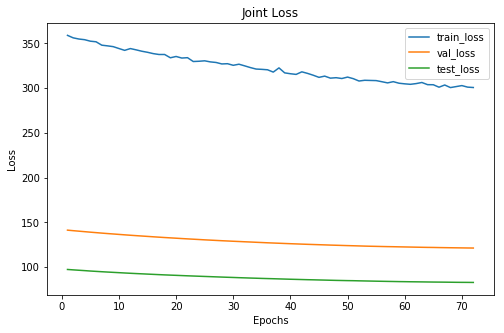

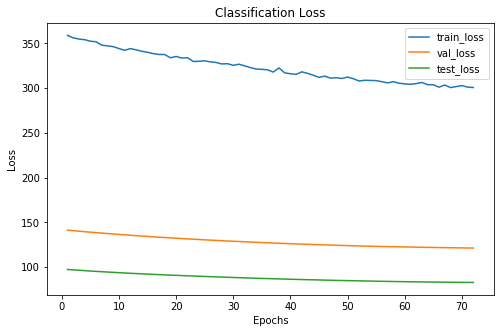

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  36   5
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       95     35      23
 1      157     65      43
 2       75     30      22
xxxxxxxxxxxxxx epoch: 72 xxxxxxxxxxxxxx


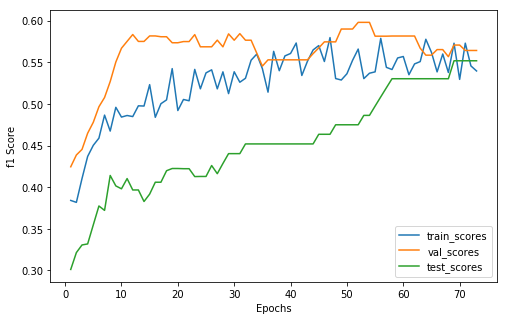

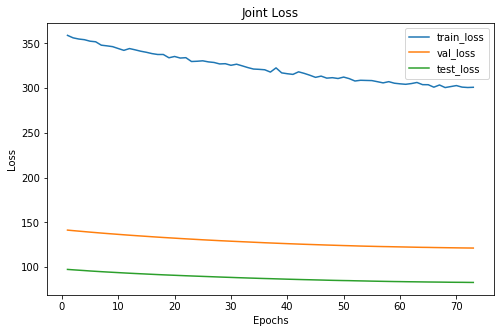

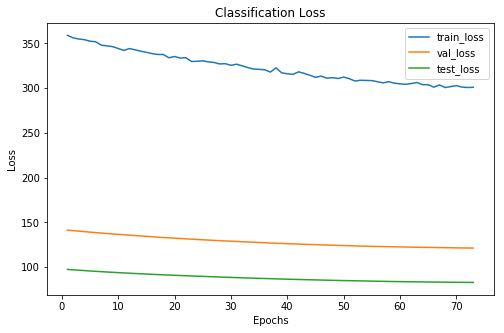

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  36   5
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       94     35      23
 1      156     65      43
 2       77     30      22
xxxxxxxxxxxxxx epoch: 73 xxxxxxxxxxxxxx


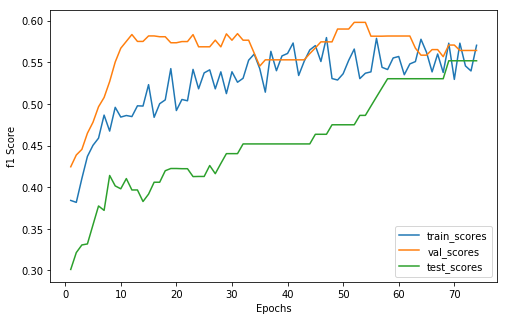

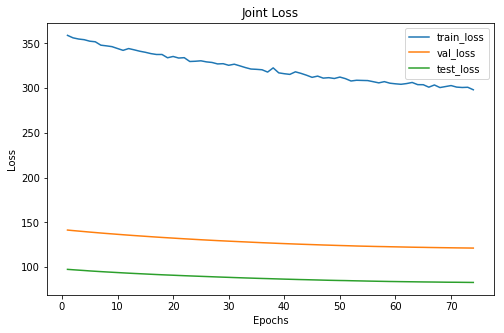

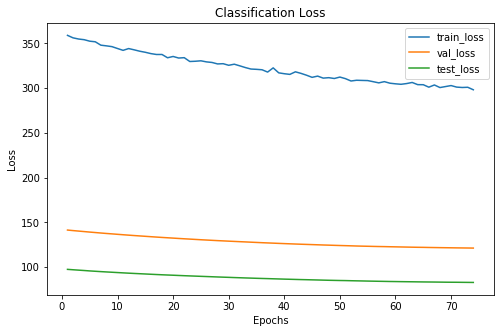

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  36   5
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       97     35      23
 1      150     65      43
 2       80     30      22
xxxxxxxxxxxxxx epoch: 74 xxxxxxxxxxxxxx


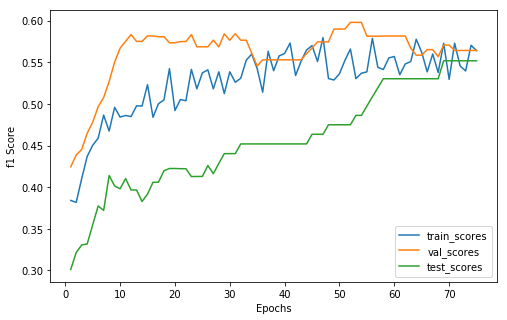

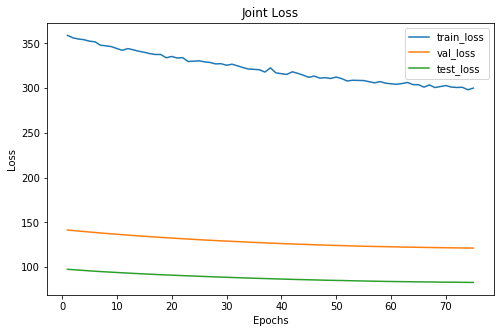

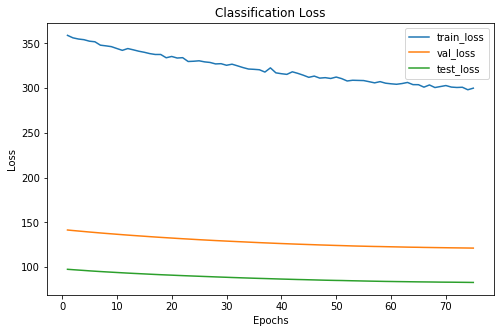

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  36   5
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       97     35      23
 1      151     65      43
 2       79     30      22
xxxxxxxxxxxxxx epoch: 75 xxxxxxxxxxxxxx


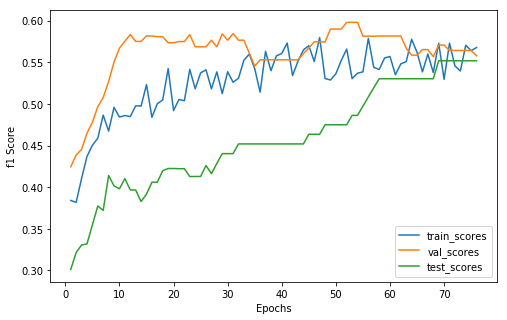

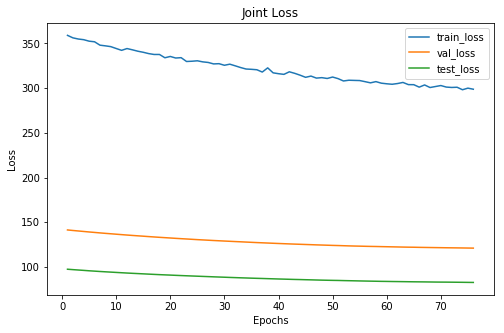

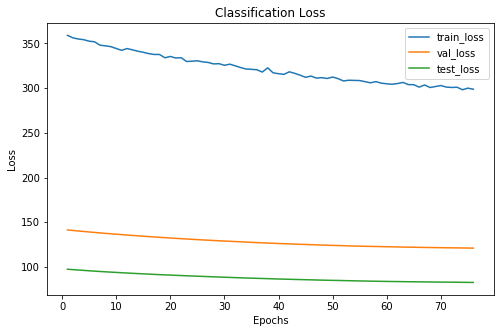

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       88     35      23
 1      165     64      43
 2       74     31      22
xxxxxxxxxxxxxx epoch: 76 xxxxxxxxxxxxxx


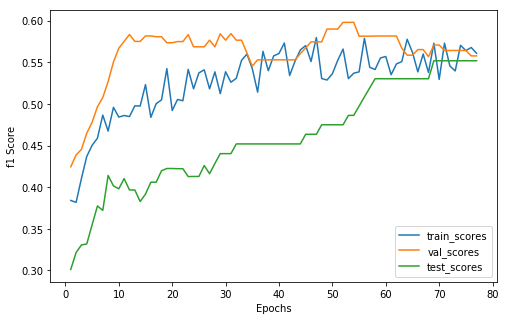

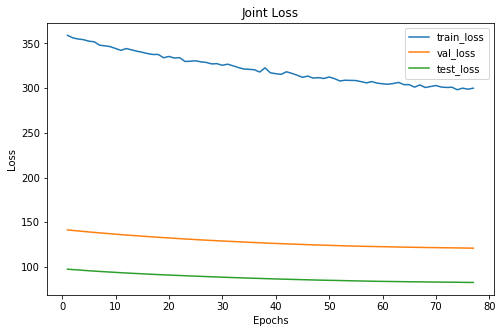

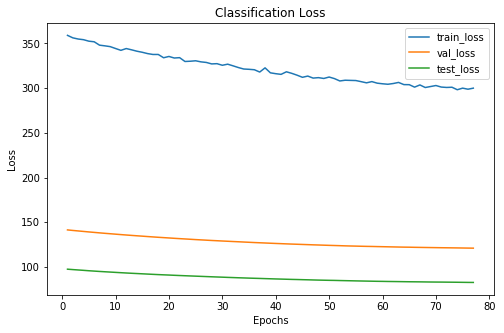

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       96     35      23
 1      153     64      43
 2       78     31      22
xxxxxxxxxxxxxx epoch: 77 xxxxxxxxxxxxxx


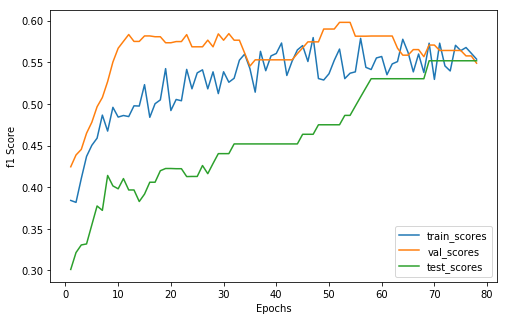

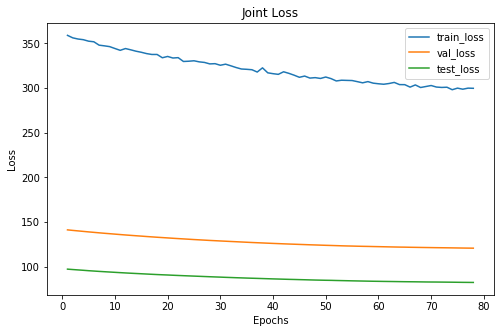

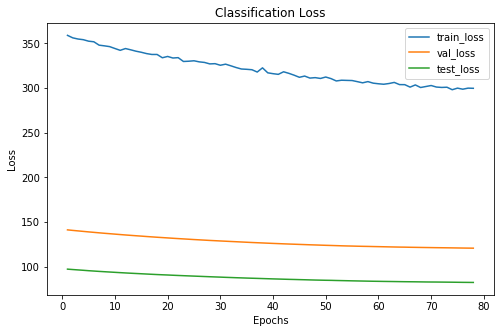

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       84     34      23
 1      161     65      43
 2       82     31      22
xxxxxxxxxxxxxx epoch: 78 xxxxxxxxxxxxxx


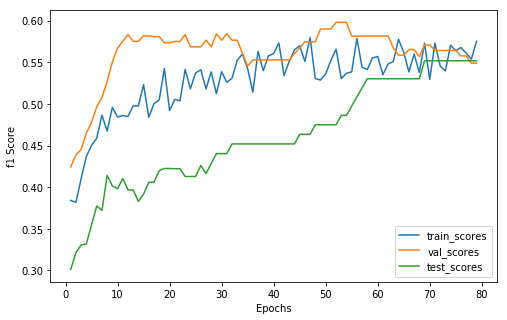

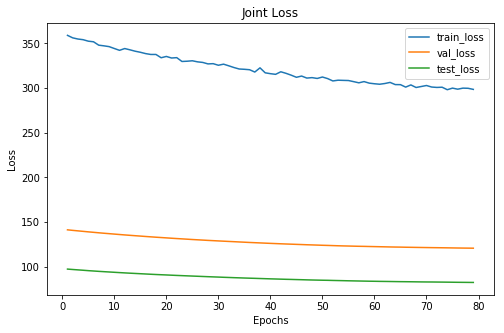

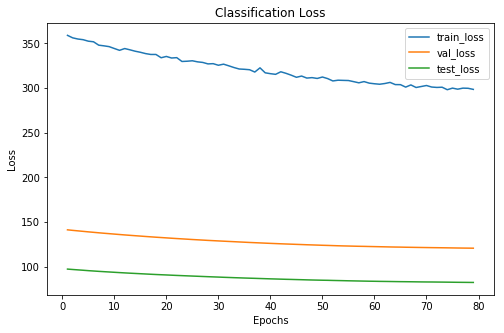

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       97     34      23
 1      153     65      43
 2       77     31      22
xxxxxxxxxxxxxx epoch: 79 xxxxxxxxxxxxxx


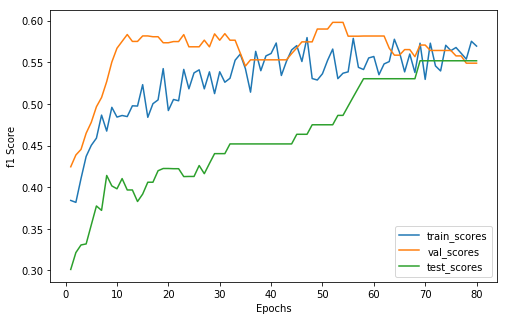

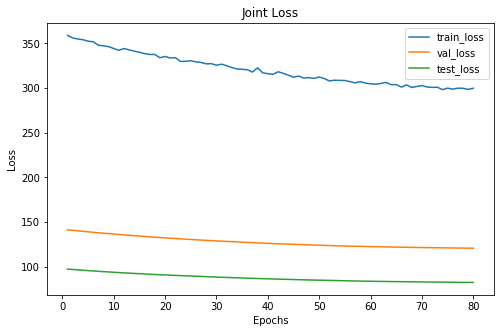

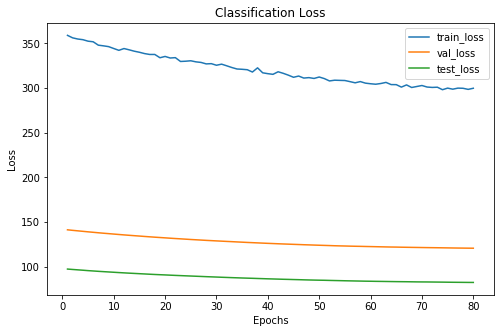

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       83     34      23
 1      162     65      43
 2       82     31      22
xxxxxxxxxxxxxx epoch: 80 xxxxxxxxxxxxxx


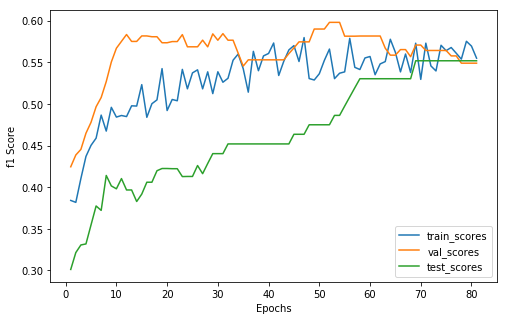

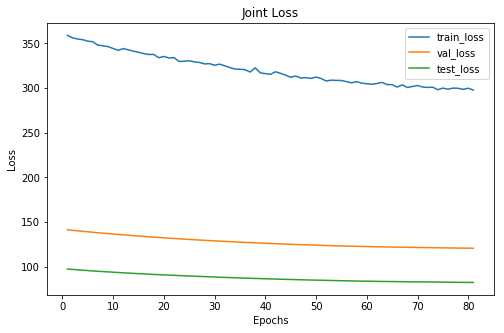

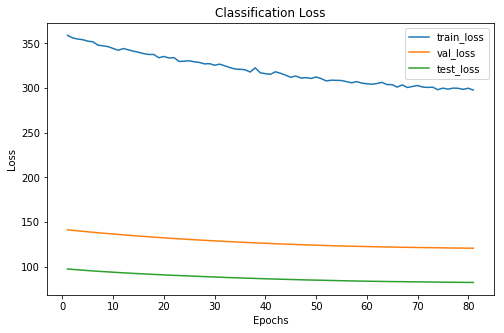

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     34      23
 1      161     65      43
 2       75     31      22
xxxxxxxxxxxxxx epoch: 81 xxxxxxxxxxxxxx


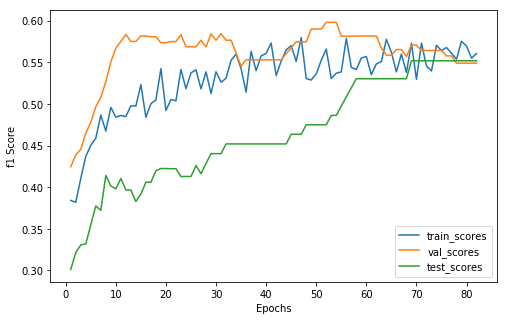

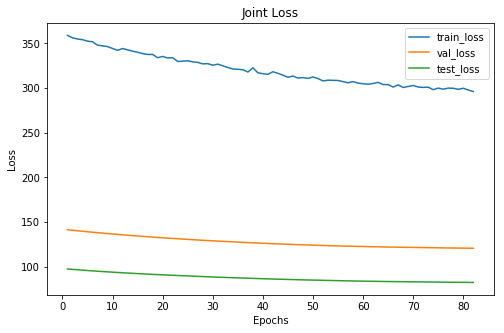

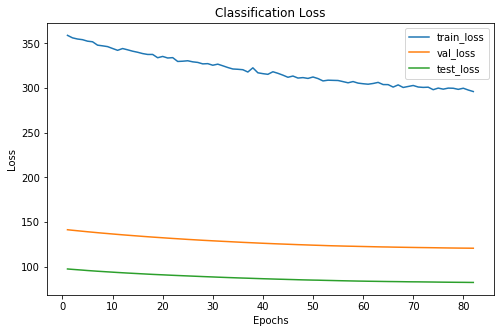

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       85     34      23
 1      160     65      43
 2       82     31      22
xxxxxxxxxxxxxx epoch: 82 xxxxxxxxxxxxxx


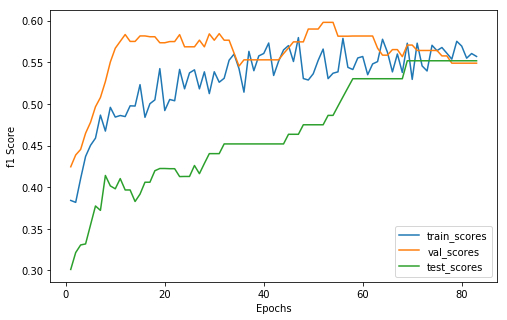

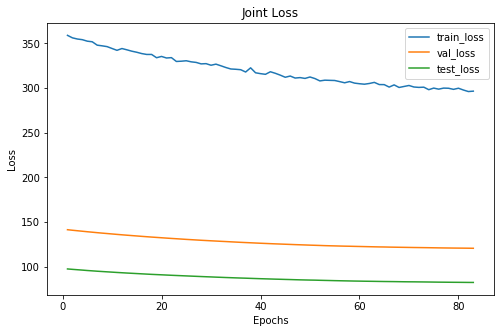

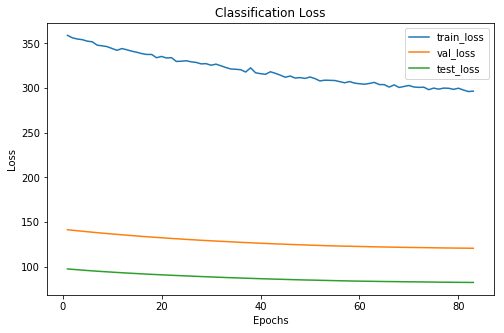

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       89     34      23
 1      159     65      43
 2       79     31      22
xxxxxxxxxxxxxx epoch: 83 xxxxxxxxxxxxxx


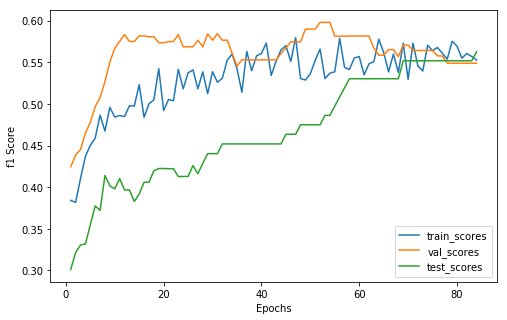

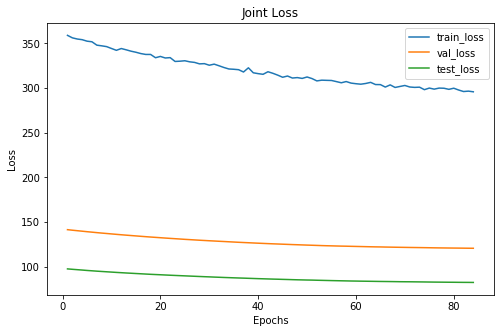

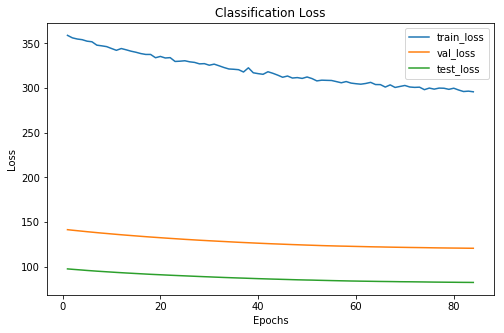

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     34      22
 1      176     65      44
 2       64     31      22
xxxxxxxxxxxxxx epoch: 84 xxxxxxxxxxxxxx


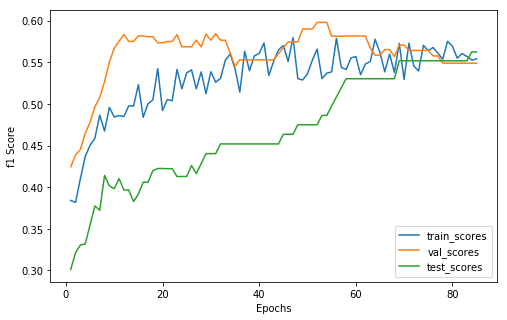

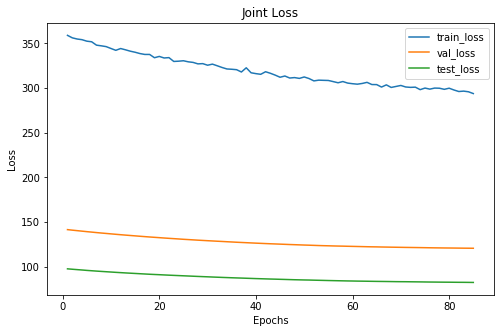

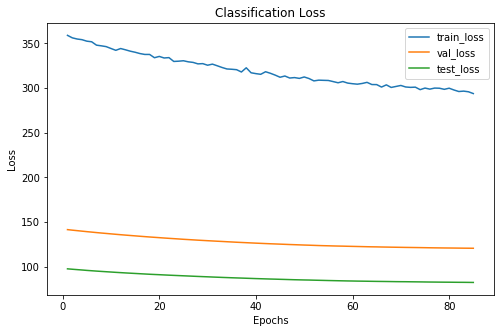

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       94     34      22
 1      158     65      44
 2       75     31      22
xxxxxxxxxxxxxx epoch: 85 xxxxxxxxxxxxxx


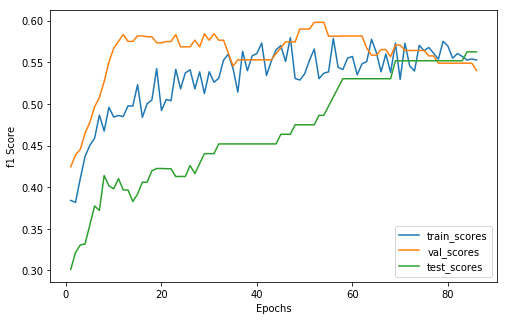

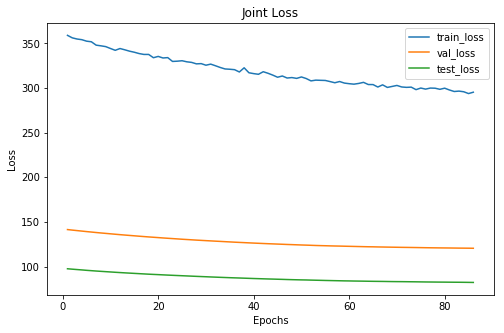

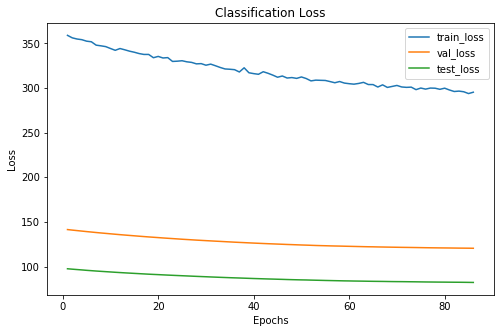

Cofusion Matrix For Val Set: 
--  --  --
21  19  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       86     33      22
 1      164     66      44
 2       77     31      22
xxxxxxxxxxxxxx epoch: 86 xxxxxxxxxxxxxx


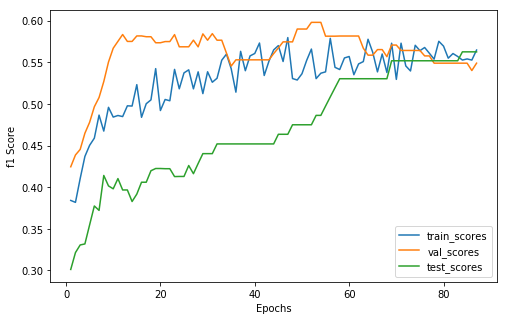

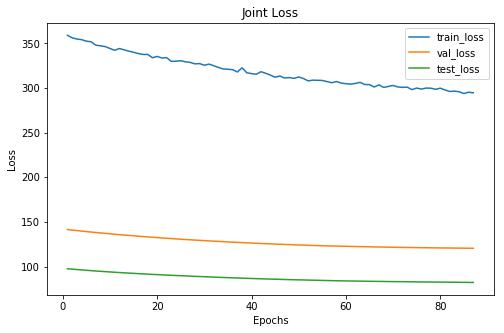

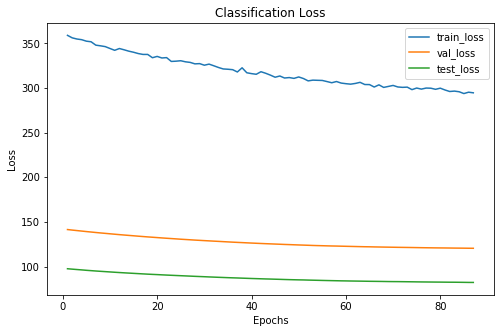

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       86     34      22
 1      167     65      44
 2       74     31      22
xxxxxxxxxxxxxx epoch: 87 xxxxxxxxxxxxxx


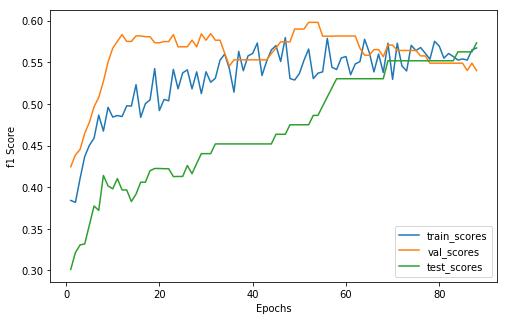

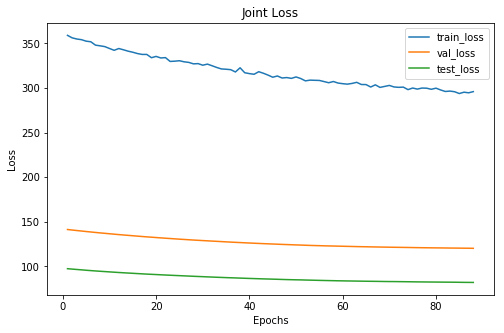

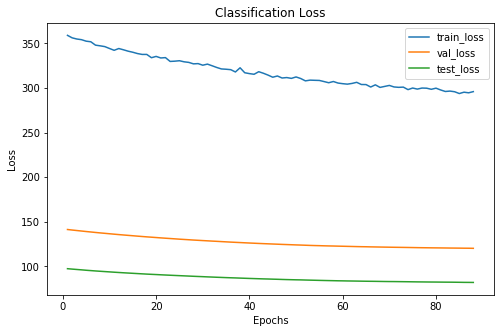

Cofusion Matrix For Val Set: 
--  --  --
21  19  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     33      21
 1      164     66      45
 2       76     31      22
xxxxxxxxxxxxxx epoch: 88 xxxxxxxxxxxxxx


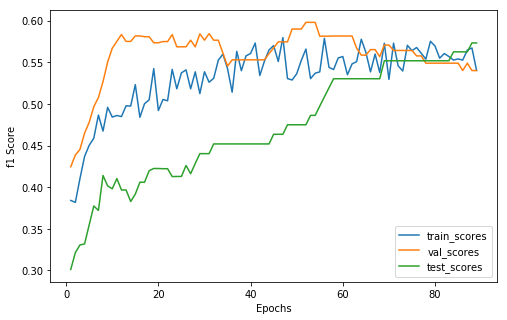

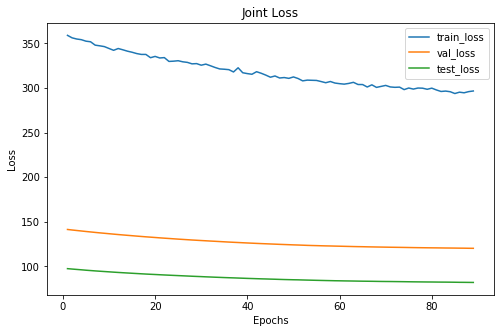

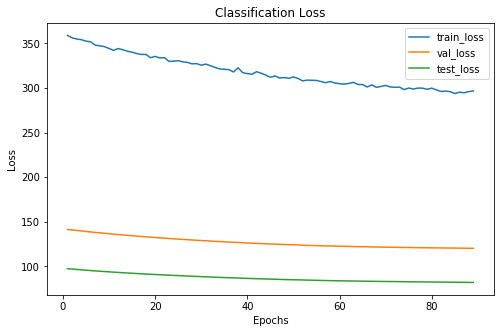

Cofusion Matrix For Val Set: 
--  --  --
21  19  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     33      21
 1      167     66      45
 2       73     31      22
xxxxxxxxxxxxxx epoch: 89 xxxxxxxxxxxxxx


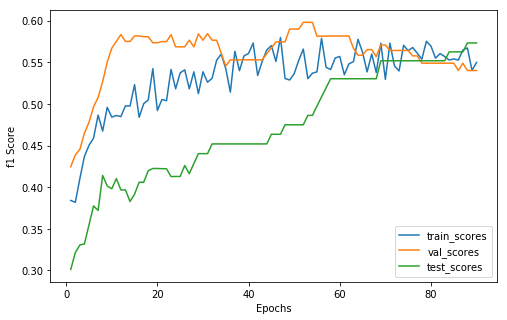

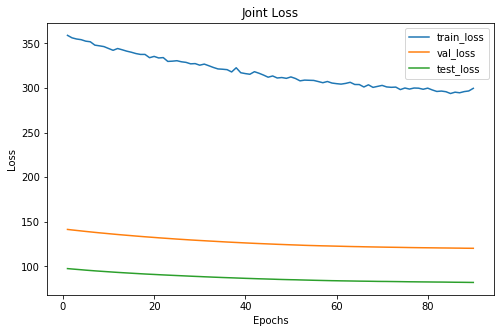

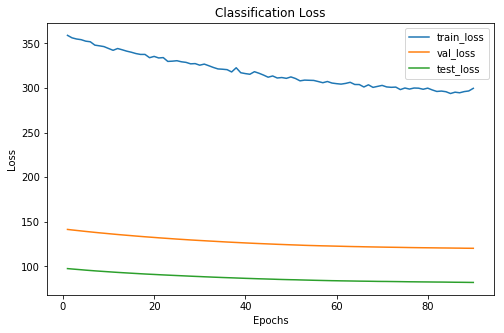

Cofusion Matrix For Val Set: 
--  --  --
21  19  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       85     33      21
 1      165     66      45
 2       77     31      22
xxxxxxxxxxxxxx epoch: 90 xxxxxxxxxxxxxx


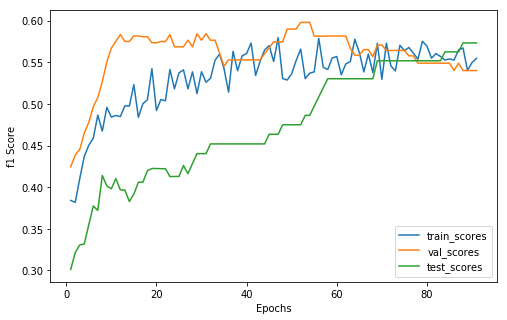

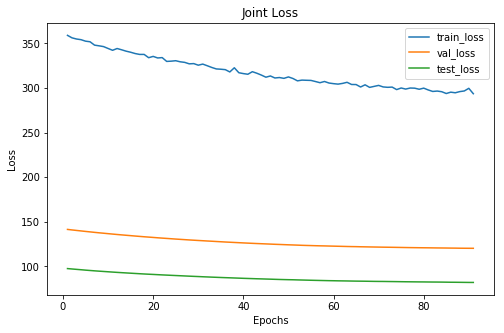

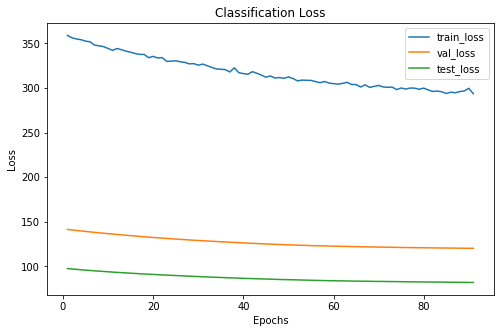

Cofusion Matrix For Val Set: 
--  --  --
21  19  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       82     33      21
 1      171     66      45
 2       74     31      22
xxxxxxxxxxxxxx epoch: 91 xxxxxxxxxxxxxx


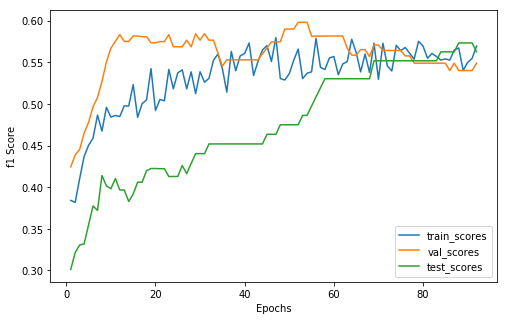

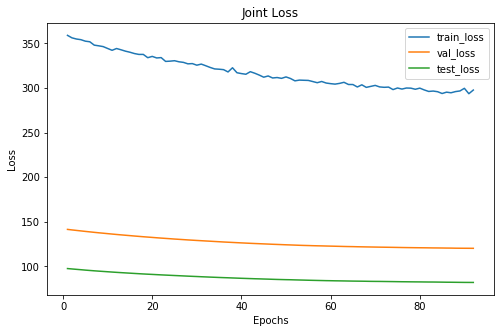

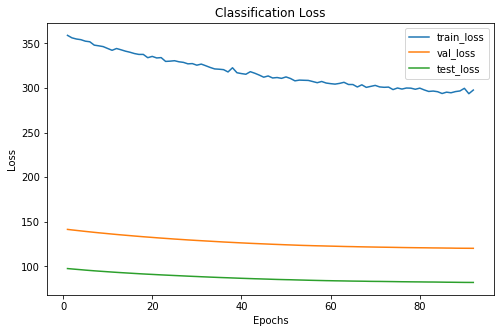

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       88     34      22
 1      162     65      44
 2       77     31      22
xxxxxxxxxxxxxx epoch: 92 xxxxxxxxxxxxxx


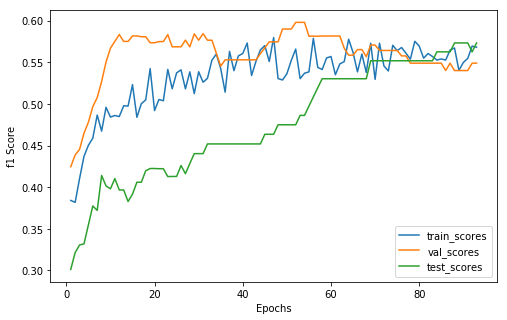

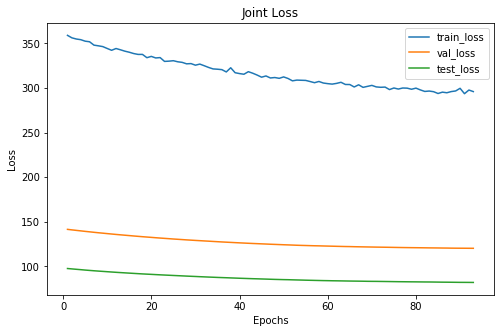

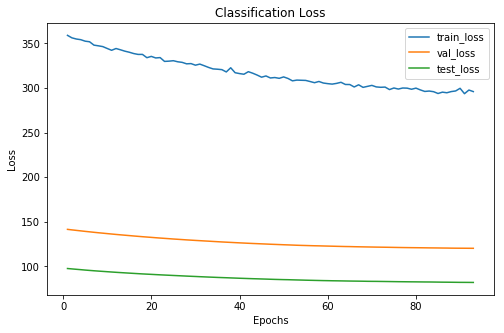

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     34      21
 1      163     65      45
 2       73     31      22
xxxxxxxxxxxxxx epoch: 93 xxxxxxxxxxxxxx


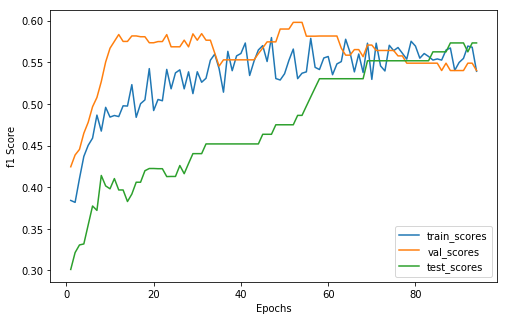

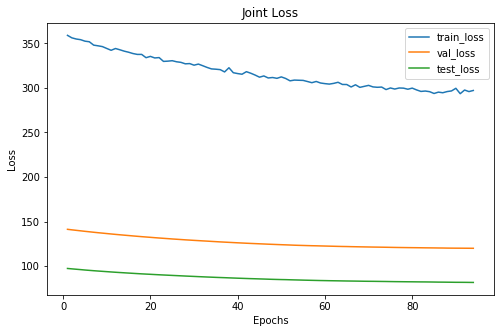

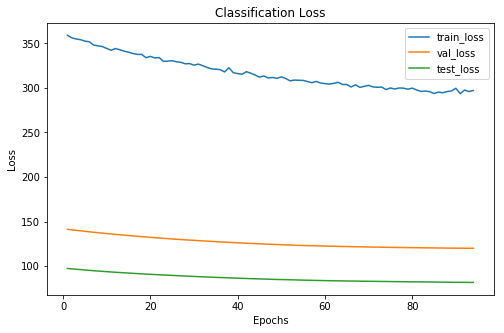

Cofusion Matrix For Val Set: 
--  --  --
21  19  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       84     33      21
 1      160     66      45
 2       83     31      22
xxxxxxxxxxxxxx epoch: 94 xxxxxxxxxxxxxx


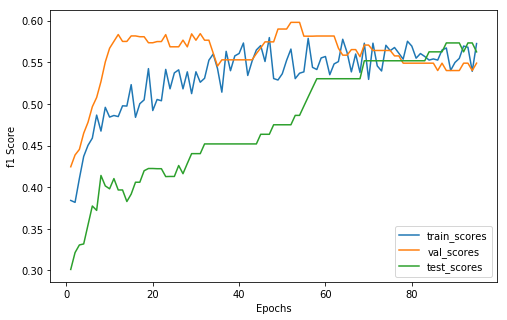

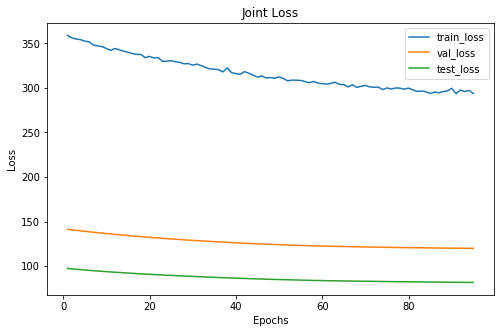

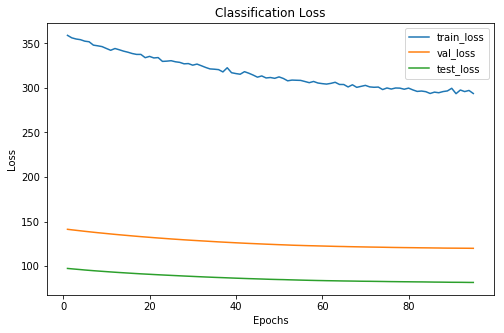

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     34      22
 1      162     65      44
 2       78     31      22
xxxxxxxxxxxxxx epoch: 95 xxxxxxxxxxxxxx


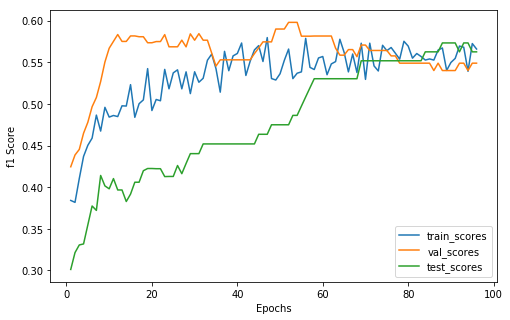

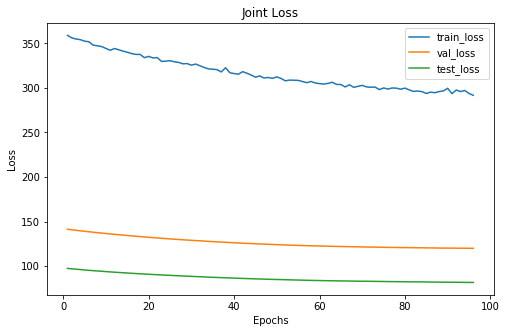

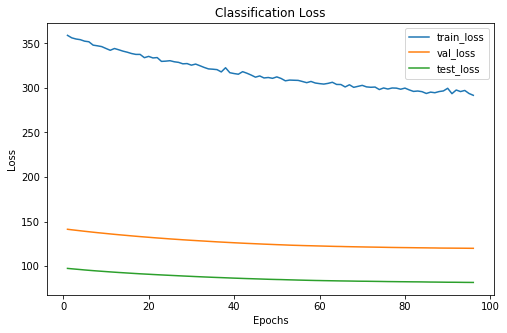

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       88     34      22
 1      158     65      44
 2       81     31      22
xxxxxxxxxxxxxx epoch: 96 xxxxxxxxxxxxxx


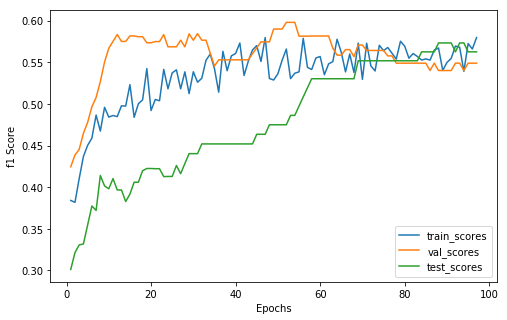

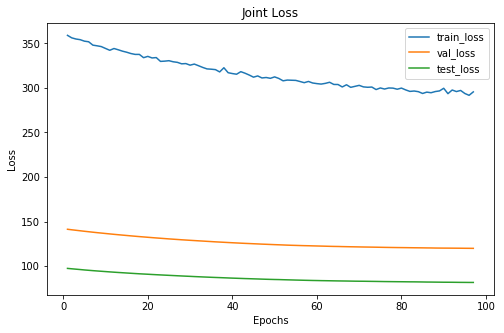

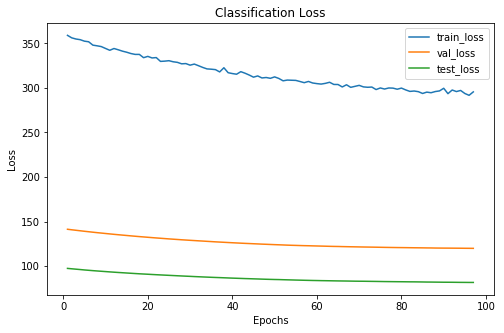

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       90     34      22
 1      153     65      44
 2       84     31      22
xxxxxxxxxxxxxx epoch: 97 xxxxxxxxxxxxxx


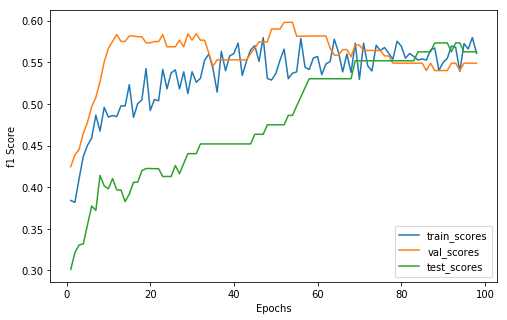

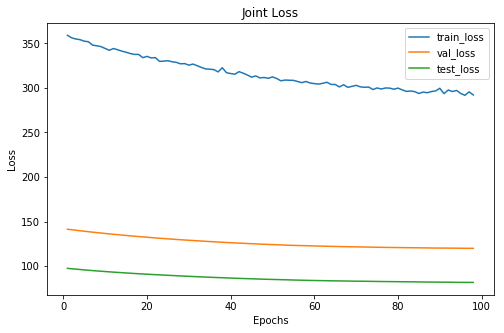

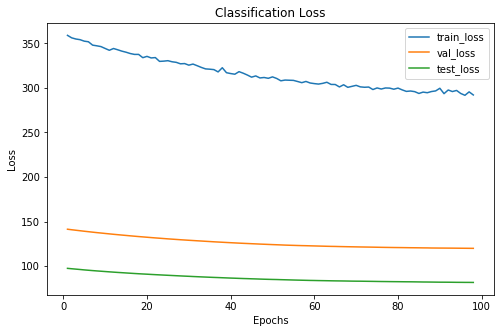

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       85     34      22
 1      170     65      44
 2       72     31      22
xxxxxxxxxxxxxx epoch: 98 xxxxxxxxxxxxxx


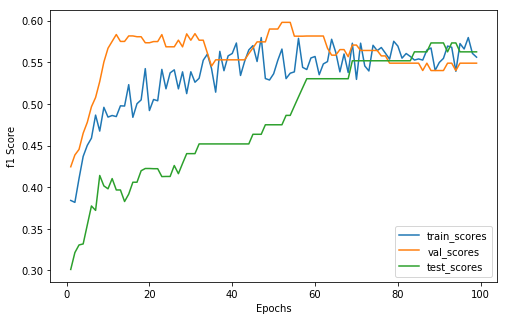

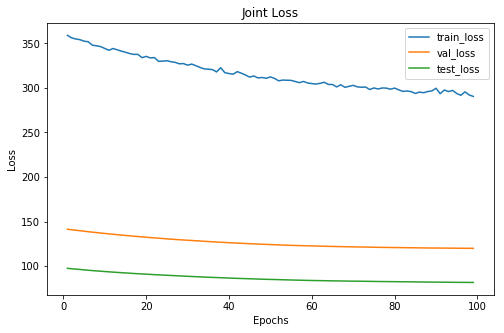

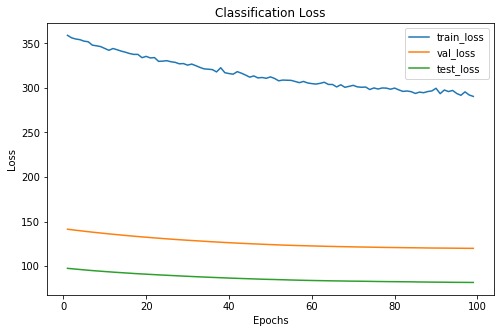

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     34      22
 1      164     65      44
 2       76     31      22
xxxxxxxxxxxxxx epoch: 99 xxxxxxxxxxxxxx


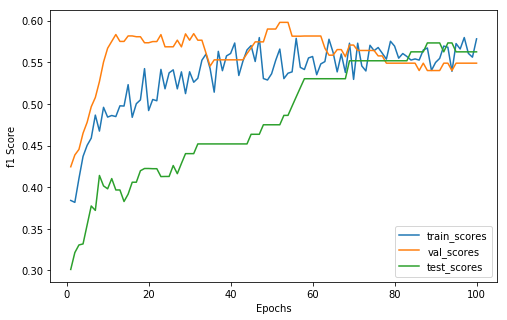

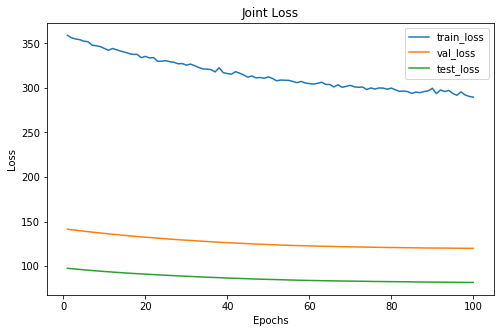

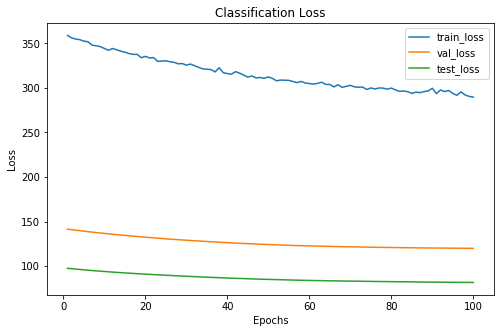

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       82     34      22
 1      161     65      44
 2       84     31      22
xxxxxxxxxxxxxx epoch: 100 xxxxxxxxxxxxxx


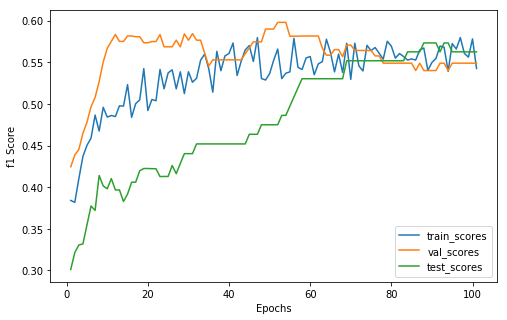

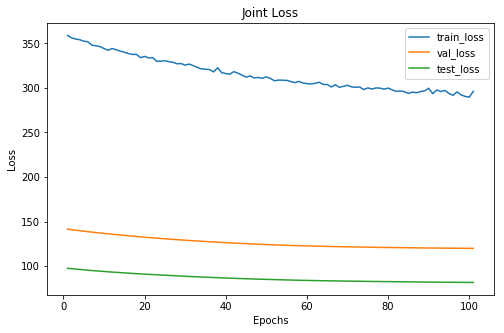

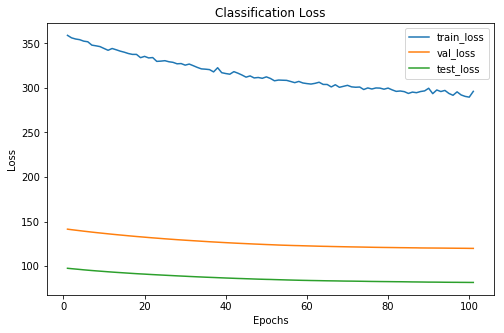

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     34      22
 1      158     65      44
 2       78     31      22
xxxxxxxxxxxxxx epoch: 101 xxxxxxxxxxxxxx


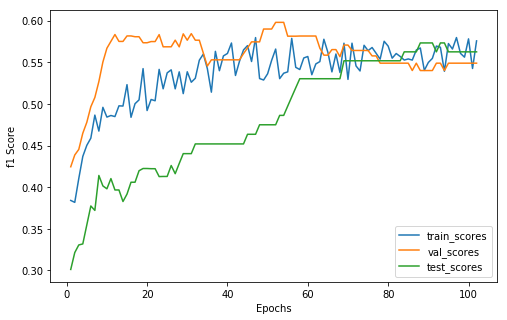

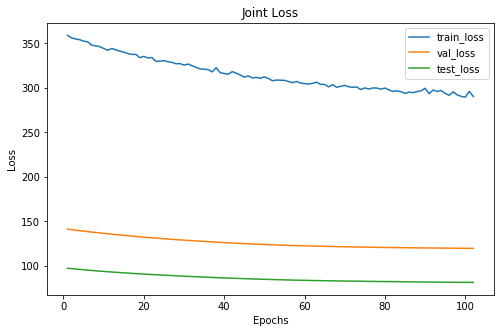

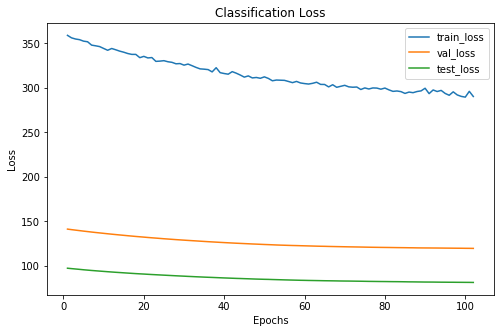

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     34      22
 1      157     65      44
 2       78     31      22
xxxxxxxxxxxxxx epoch: 102 xxxxxxxxxxxxxx


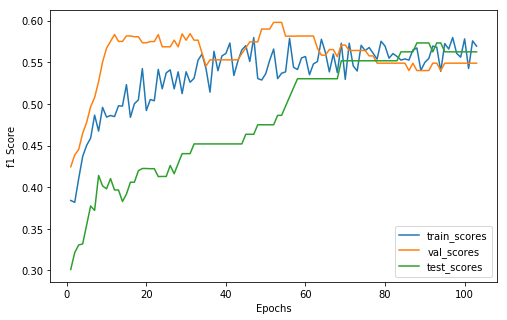

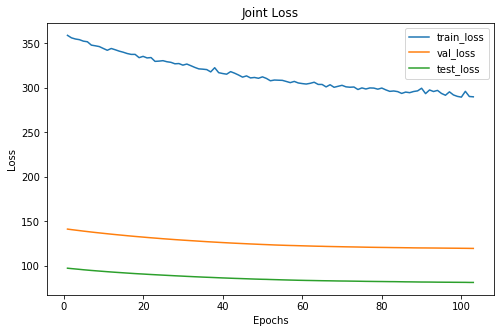

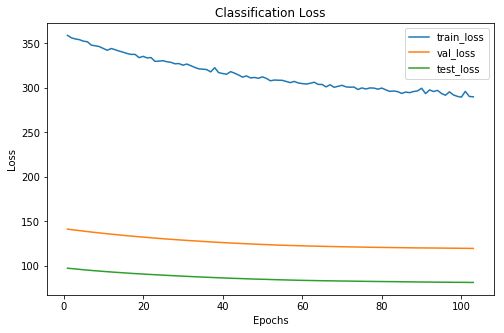

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       90     34      22
 1      161     65      44
 2       76     31      22
xxxxxxxxxxxxxx epoch: 103 xxxxxxxxxxxxxx


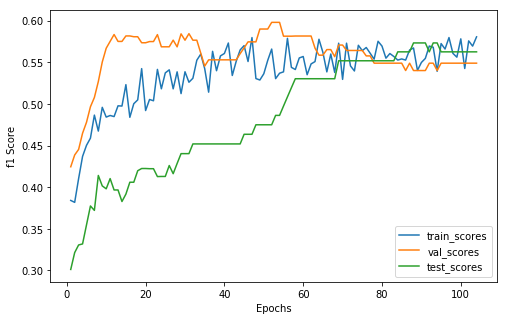

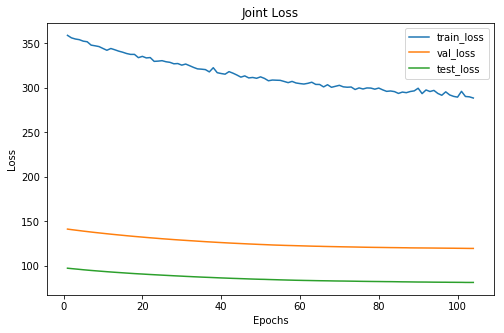

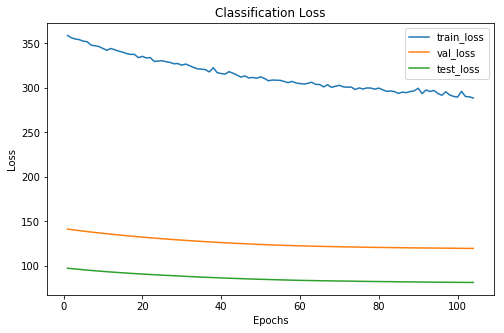

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       86     34      22
 1      165     65      44
 2       76     31      22
xxxxxxxxxxxxxx epoch: 104 xxxxxxxxxxxxxx


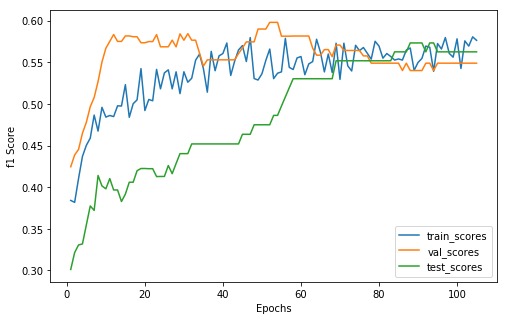

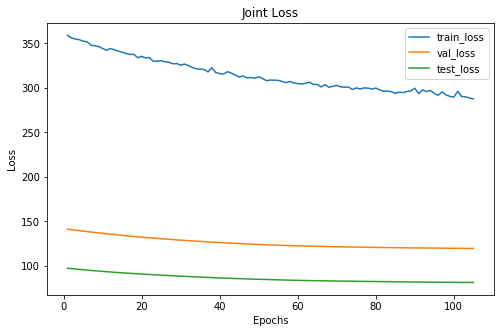

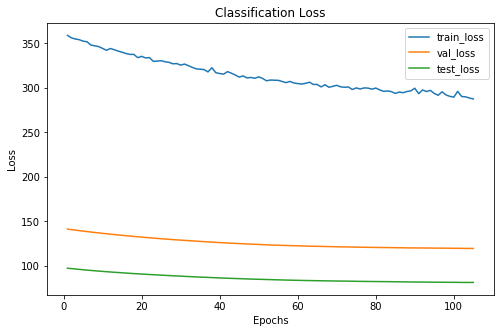

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     34      22
 1      156     65      44
 2       79     31      22
xxxxxxxxxxxxxx epoch: 105 xxxxxxxxxxxxxx


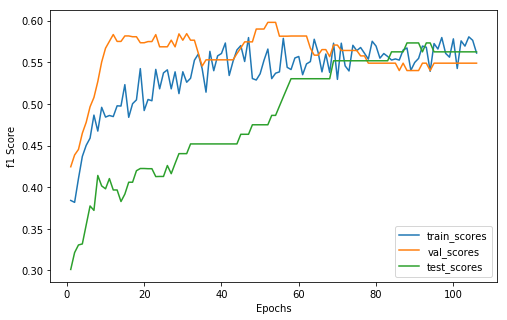

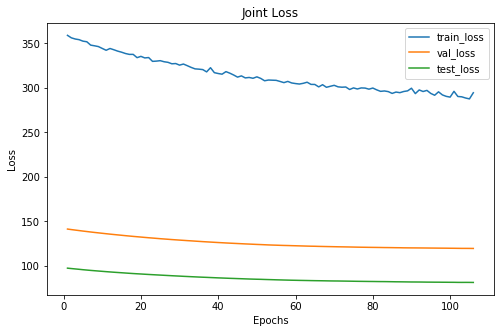

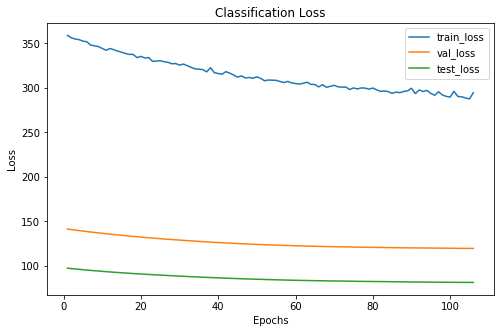

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     34      22
 1      156     65      44
 2       79     31      22
xxxxxxxxxxxxxx epoch: 106 xxxxxxxxxxxxxx


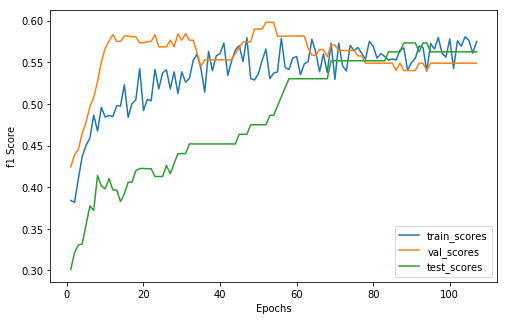

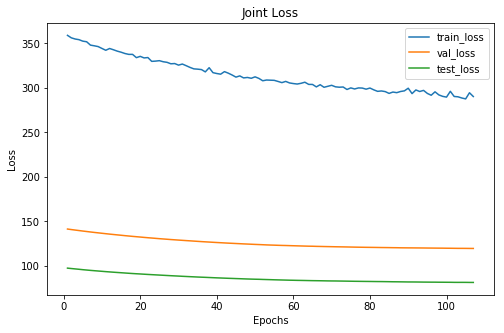

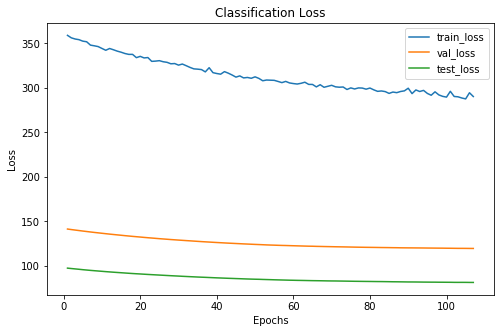

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       84     34      22
 1      165     65      44
 2       78     31      22
xxxxxxxxxxxxxx epoch: 107 xxxxxxxxxxxxxx


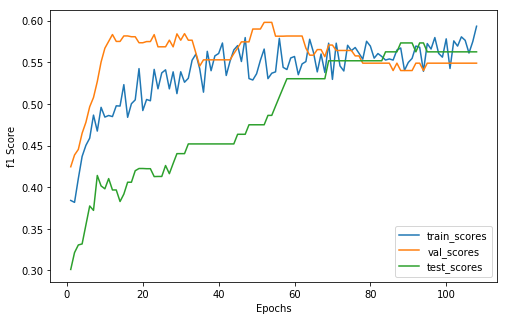

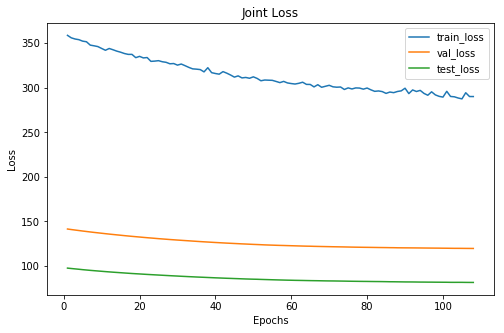

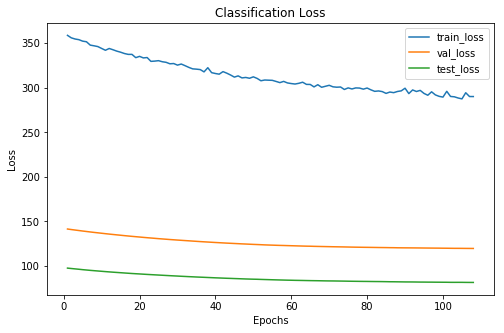

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     34      22
 1      160     65      44
 2       75     31      22
xxxxxxxxxxxxxx epoch: 108 xxxxxxxxxxxxxx


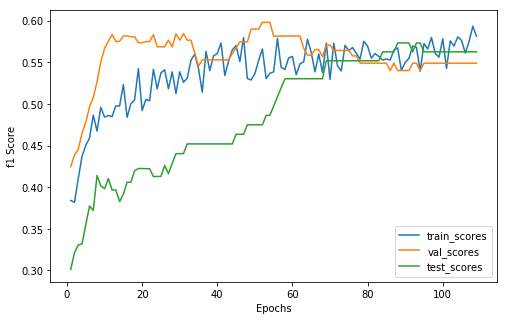

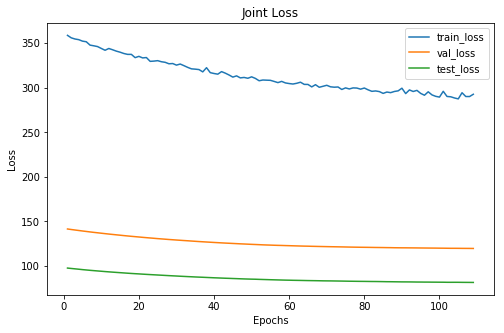

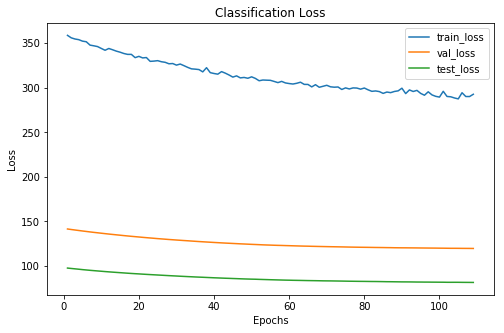

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       85     34      22
 1      165     65      44
 2       77     31      22
xxxxxxxxxxxxxx epoch: 109 xxxxxxxxxxxxxx


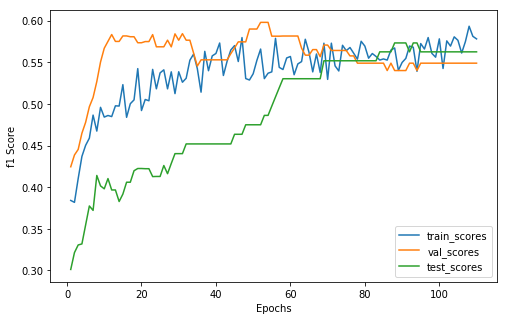

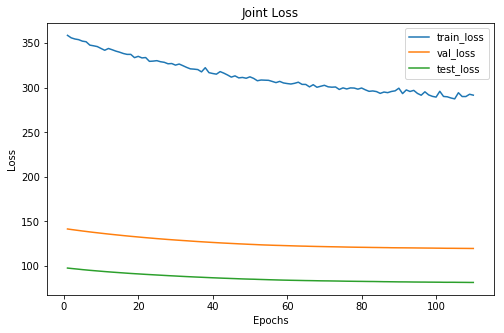

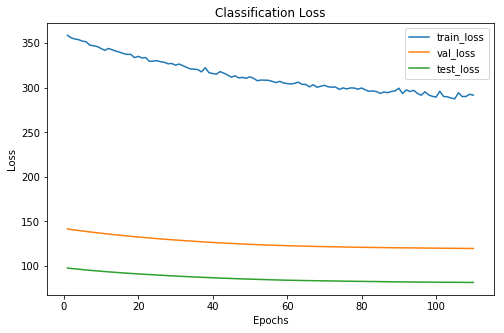

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       84     34      22
 1      166     65      44
 2       77     31      22
xxxxxxxxxxxxxx epoch: 110 xxxxxxxxxxxxxx


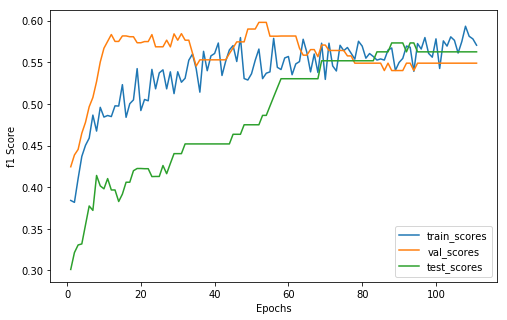

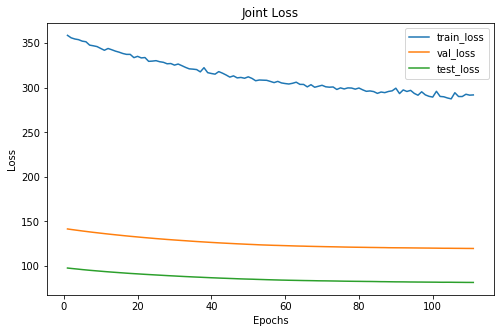

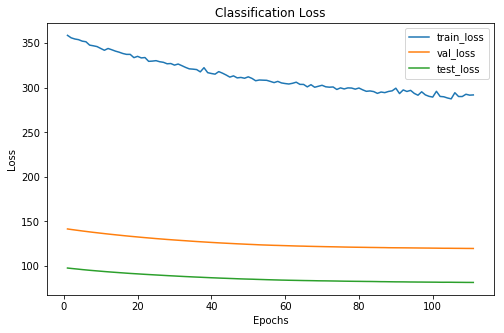

Cofusion Matrix For Val Set: 
--  --  --
22  18  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       97     34      22
 1      148     65      44
 2       82     31      22
xxxxxxxxxxxxxx epoch: 111 xxxxxxxxxxxxxx


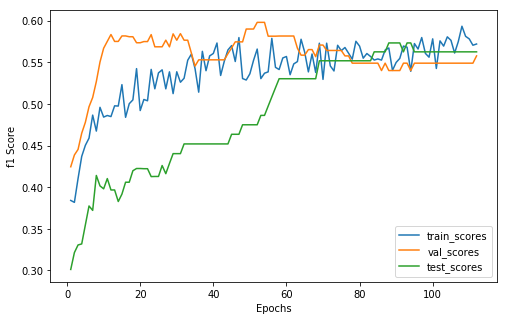

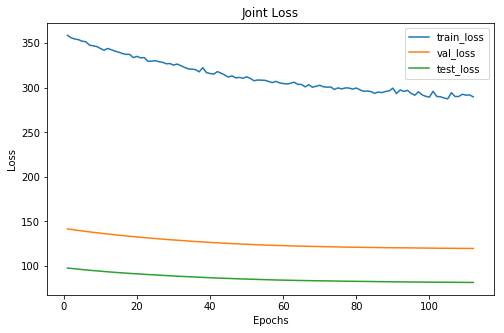

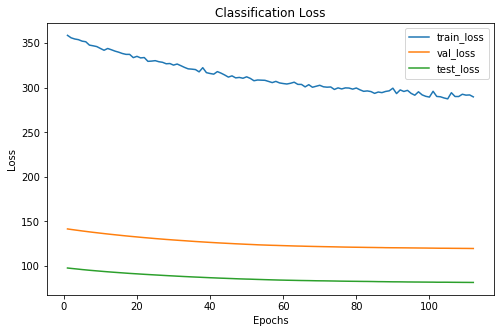

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       85     35      22
 1      161     64      44
 2       81     31      22
xxxxxxxxxxxxxx epoch: 112 xxxxxxxxxxxxxx


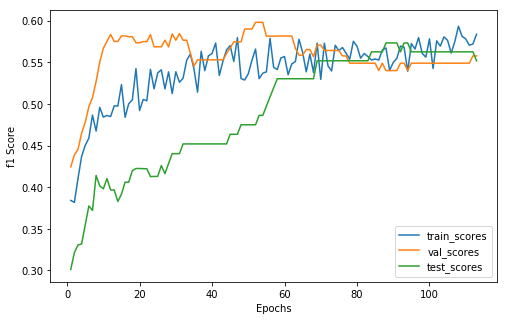

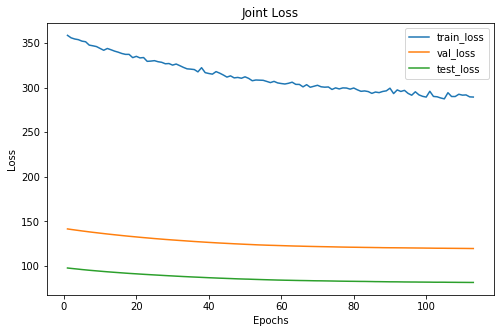

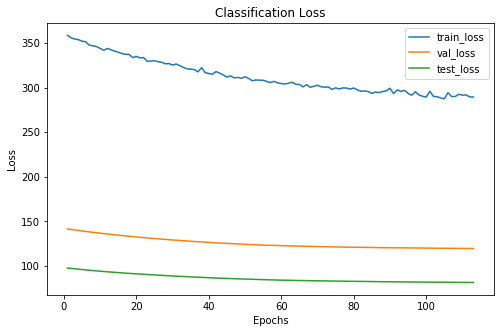

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       85     35      23
 1      163     64      43
 2       79     31      22
xxxxxxxxxxxxxx epoch: 113 xxxxxxxxxxxxxx


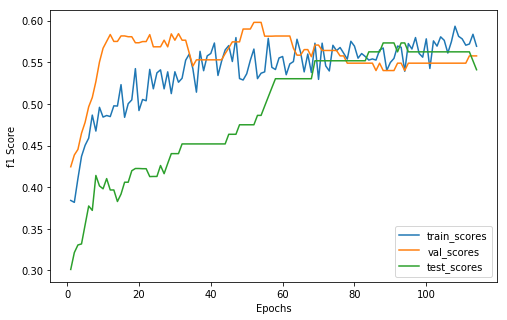

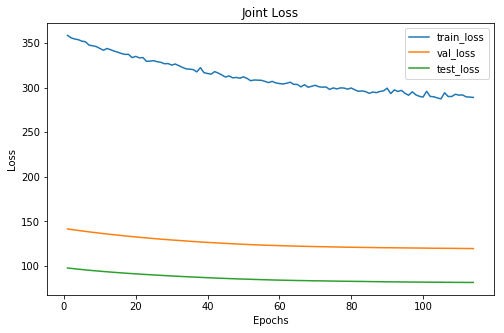

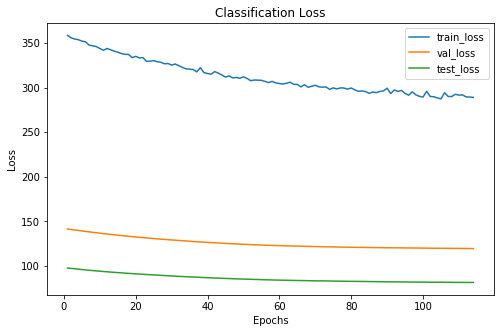

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     35      24
 1      161     64      42
 2       79     31      22
xxxxxxxxxxxxxx epoch: 114 xxxxxxxxxxxxxx


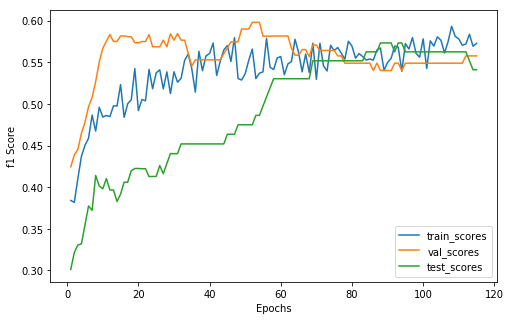

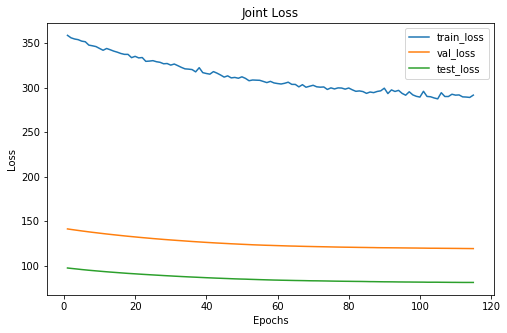

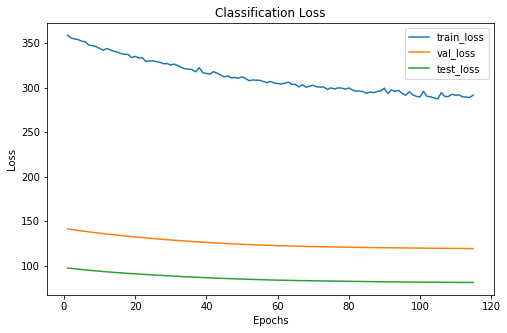

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       88     35      24
 1      160     64      42
 2       79     31      22
xxxxxxxxxxxxxx epoch: 115 xxxxxxxxxxxxxx


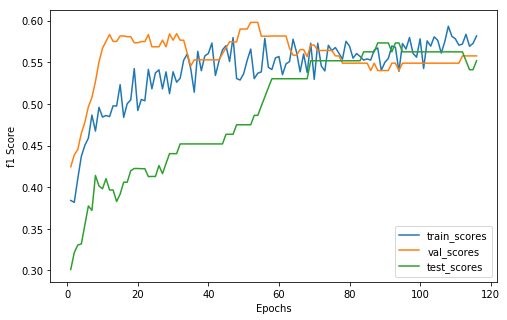

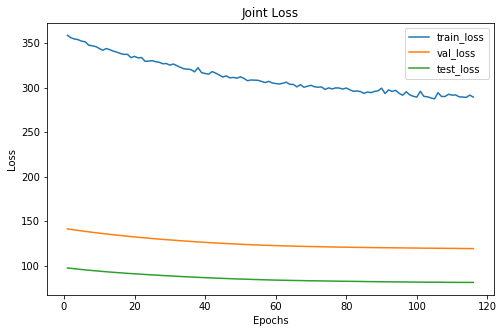

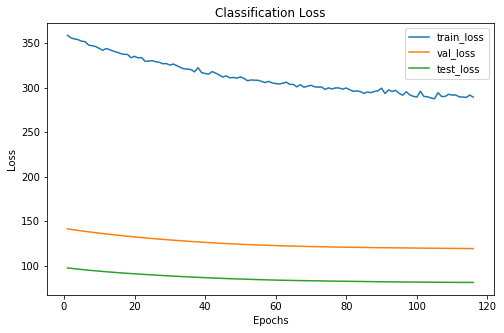

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       88     35      23
 1      161     64      43
 2       78     31      22
xxxxxxxxxxxxxx epoch: 116 xxxxxxxxxxxxxx


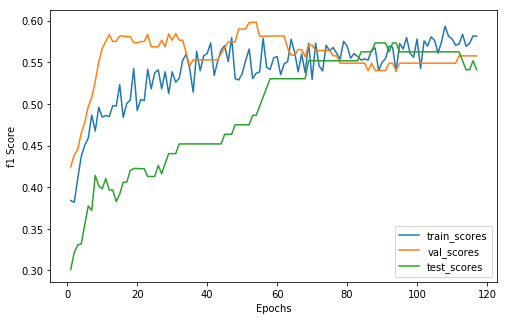

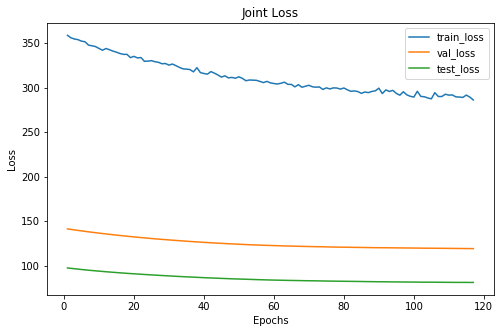

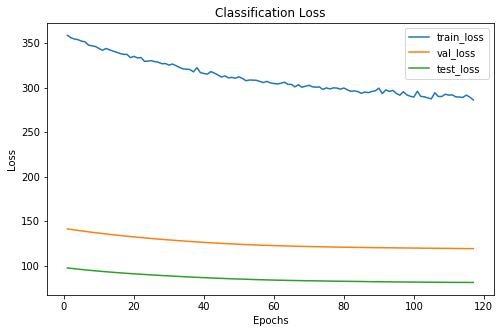

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       85     35      24
 1      162     64      42
 2       80     31      22
xxxxxxxxxxxxxx epoch: 117 xxxxxxxxxxxxxx


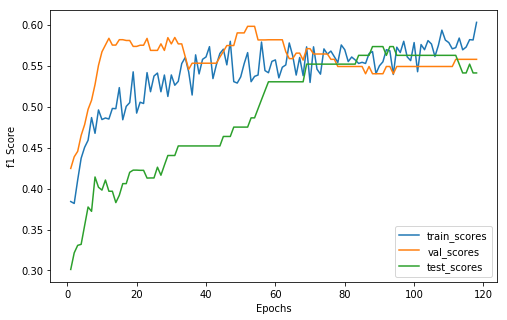

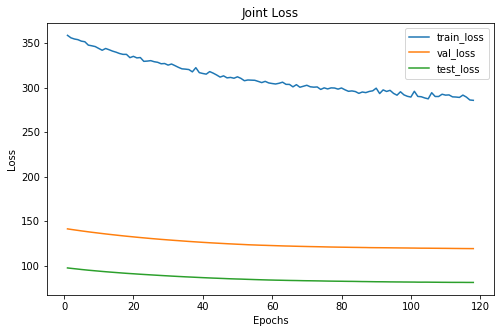

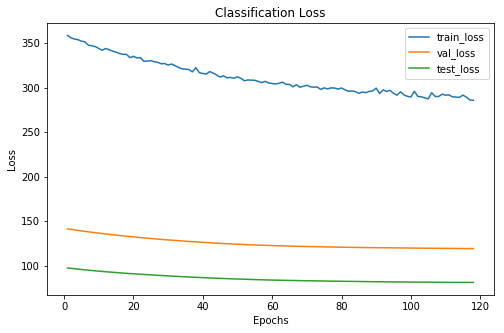

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       89     35      24
 1      161     64      42
 2       77     31      22
xxxxxxxxxxxxxx epoch: 118 xxxxxxxxxxxxxx


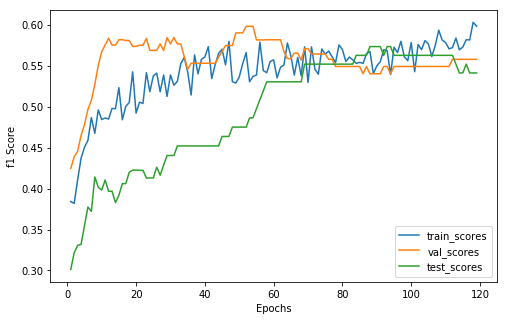

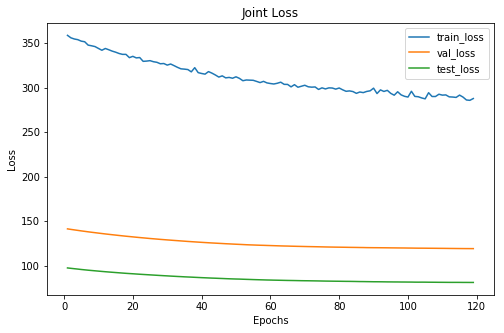

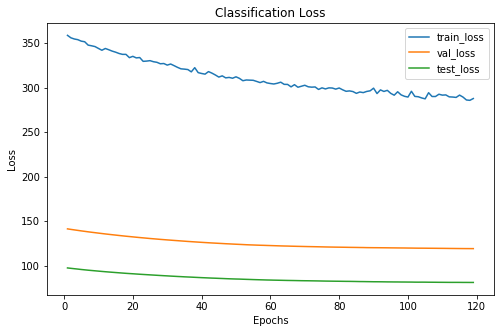

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       93     35      24
 1      151     64      42
 2       83     31      22
xxxxxxxxxxxxxx epoch: 119 xxxxxxxxxxxxxx


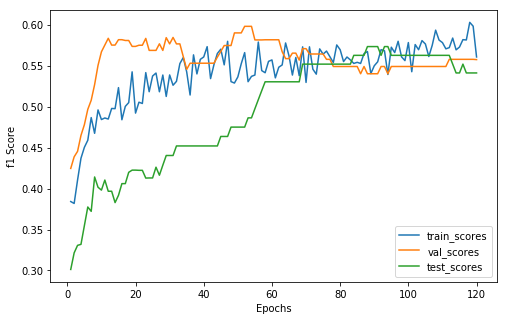

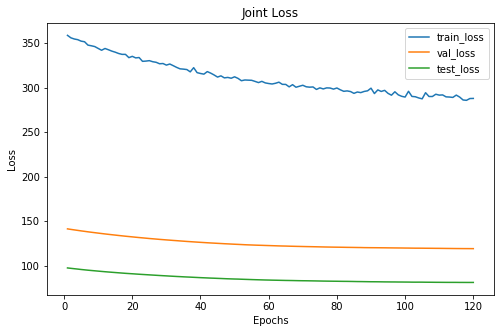

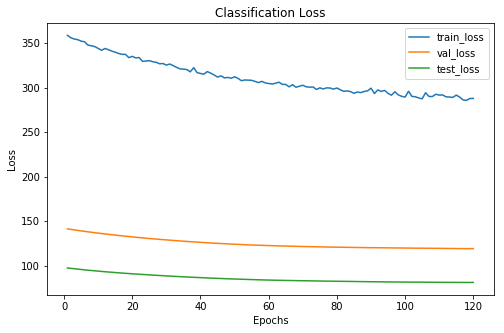

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  11  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     36      24
 1      170     63      42
 2       70     31      22
xxxxxxxxxxxxxx epoch: 120 xxxxxxxxxxxxxx


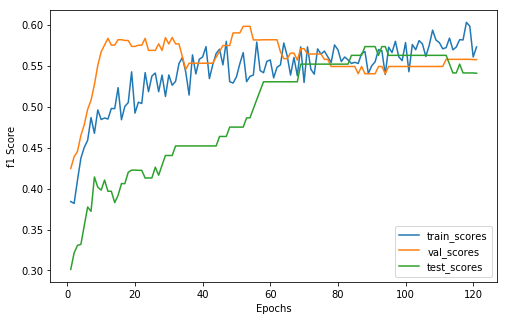

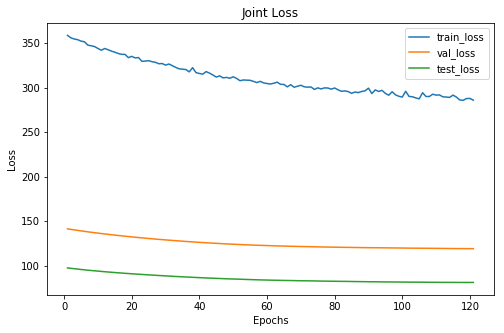

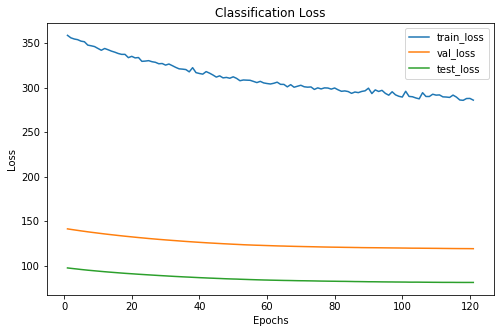

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  11  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       90     36      25
 1      158     63      41
 2       79     31      22
xxxxxxxxxxxxxx epoch: 121 xxxxxxxxxxxxxx


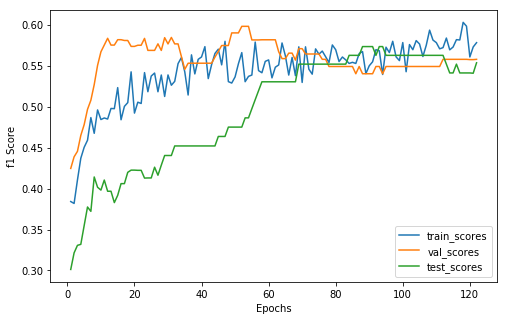

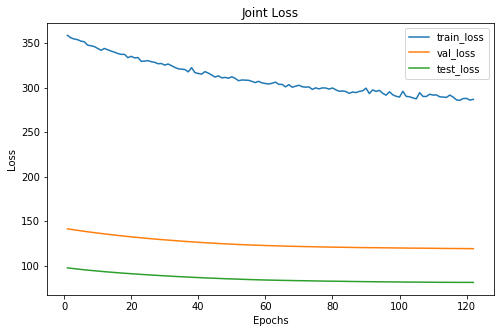

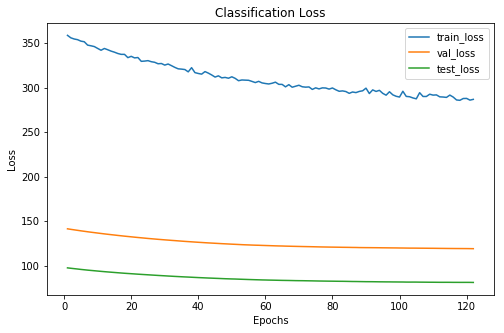

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  12  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       89     35      25
 1      161     64      40
 2       77     31      23
xxxxxxxxxxxxxx epoch: 122 xxxxxxxxxxxxxx


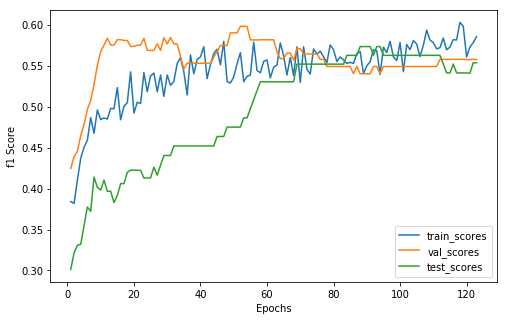

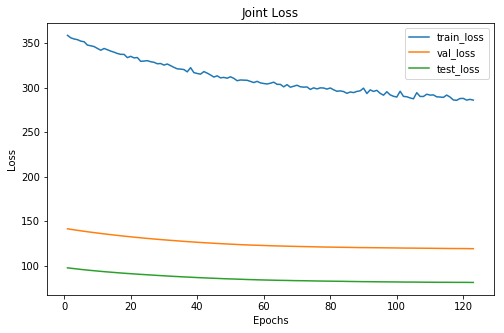

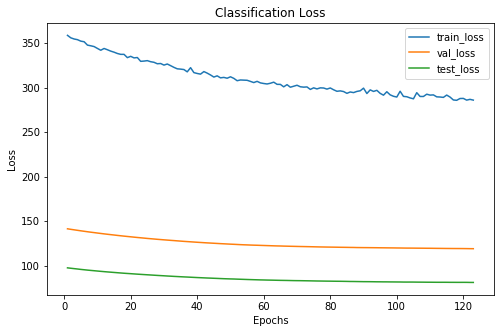

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  11  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       86     36      25
 1      156     63      40
 2       85     31      23
xxxxxxxxxxxxxx epoch: 123 xxxxxxxxxxxxxx


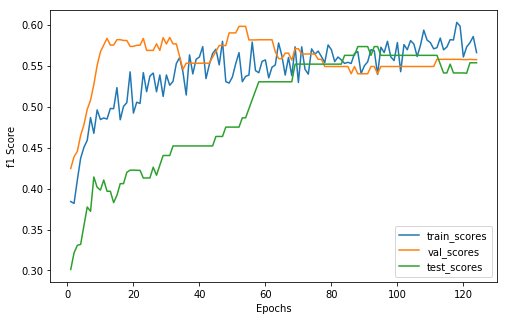

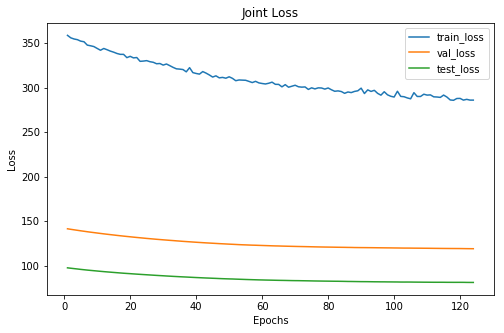

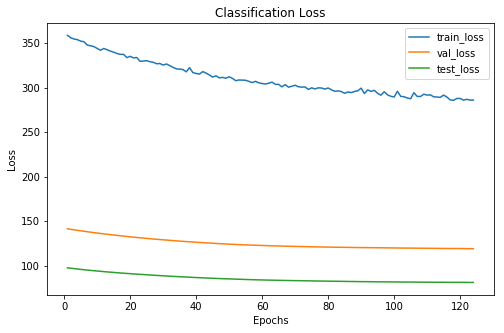

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  11  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       85     36      25
 1      166     63      40
 2       76     31      23
xxxxxxxxxxxxxx epoch: 124 xxxxxxxxxxxxxx


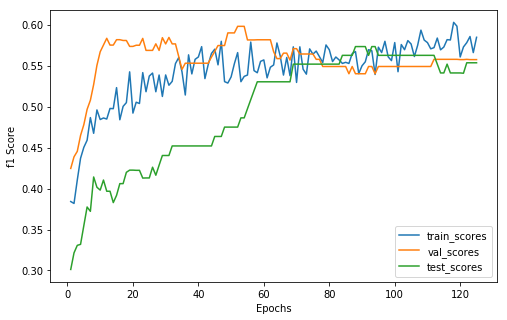

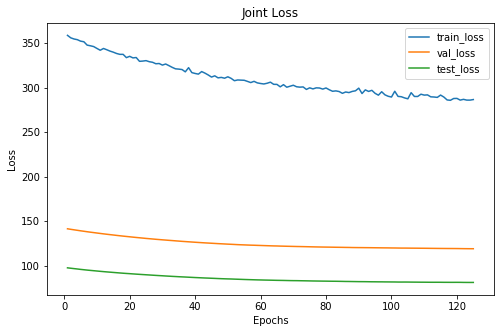

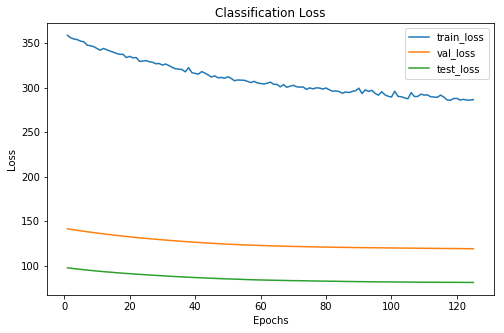

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  11  15
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       86     36      25
 1      159     63      40
 2       82     31      23
xxxxxxxxxxxxxx epoch: 125 xxxxxxxxxxxxxx


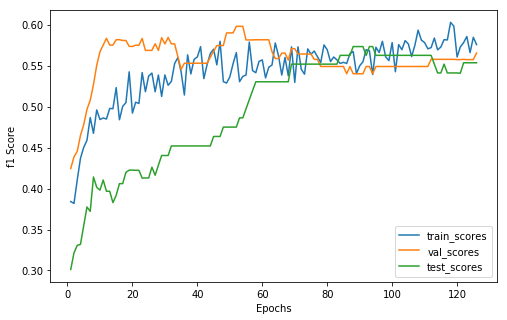

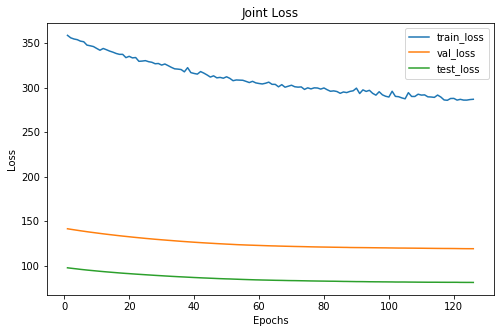

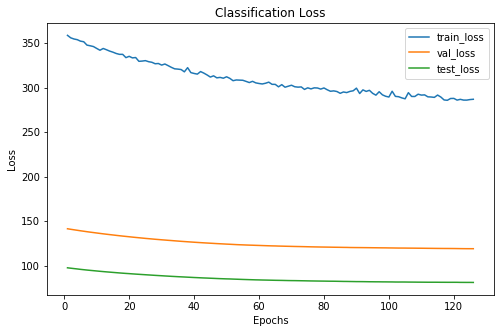

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  11  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       88     35      25
 1      158     63      40
 2       81     32      23
xxxxxxxxxxxxxx epoch: 126 xxxxxxxxxxxxxx


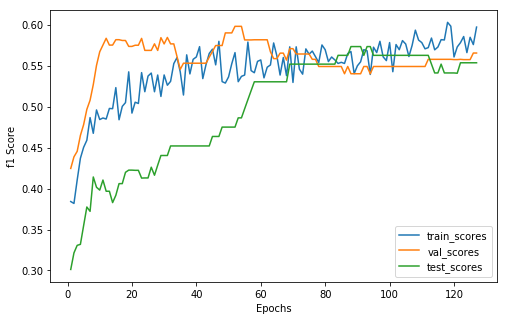

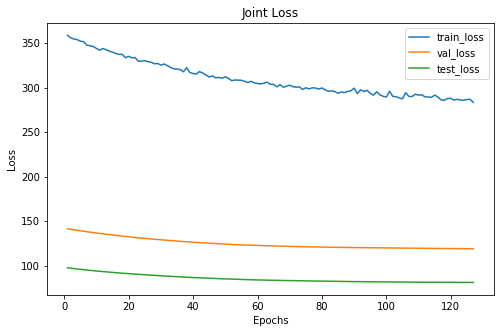

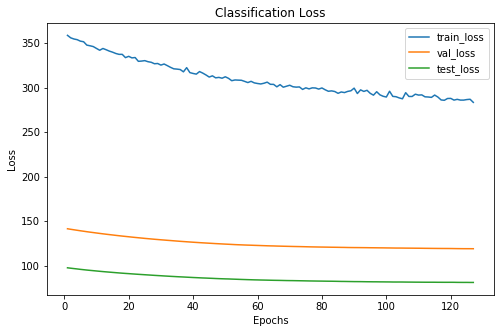

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 3  11  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       89     35      25
 1      158     63      40
 2       80     32      23
xxxxxxxxxxxxxx epoch: 127 xxxxxxxxxxxxxx


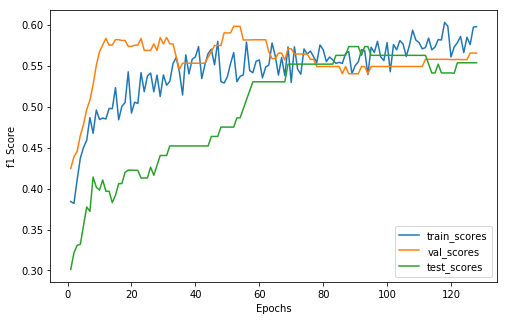

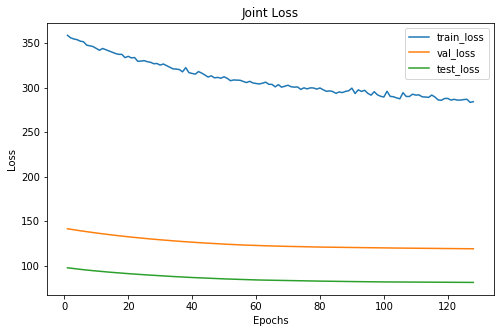

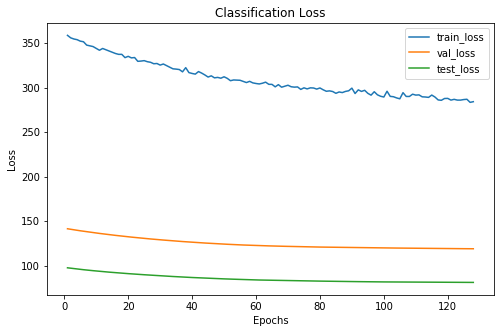

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     36      25
 1      158     62      40
 2       78     32      23
xxxxxxxxxxxxxx epoch: 128 xxxxxxxxxxxxxx


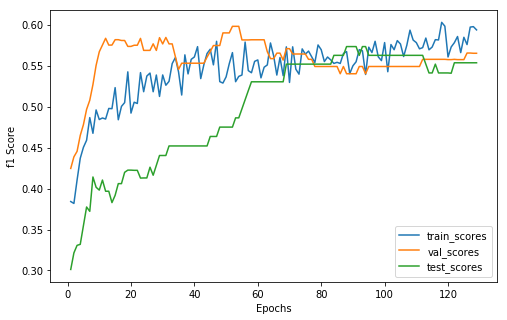

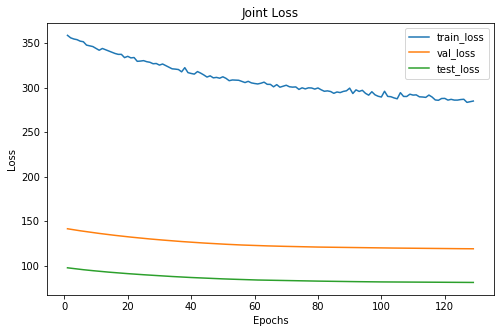

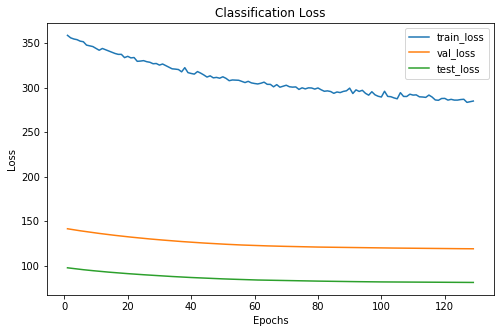

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     36      25
 1      157     62      40
 2       79     32      23
xxxxxxxxxxxxxx epoch: 129 xxxxxxxxxxxxxx


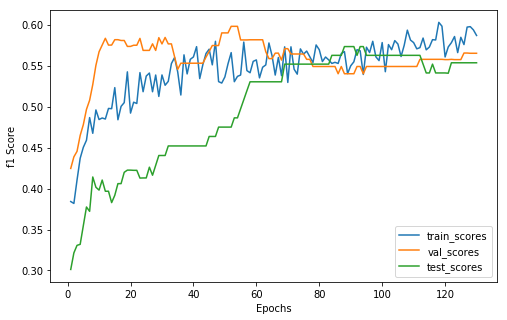

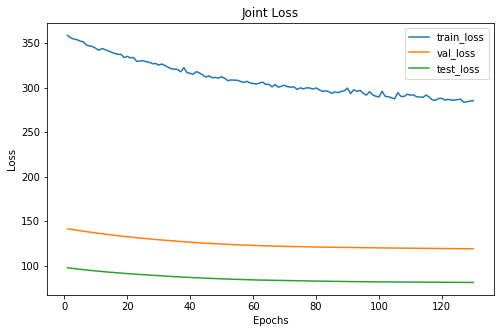

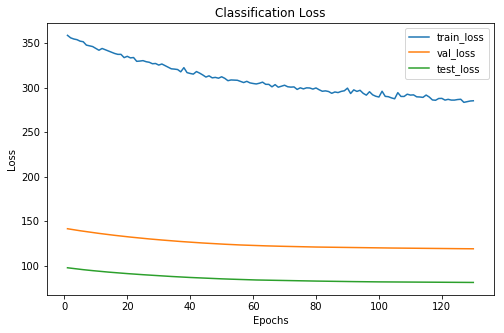

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       90     36      25
 1      162     62      40
 2       75     32      23
xxxxxxxxxxxxxx epoch: 130 xxxxxxxxxxxxxx


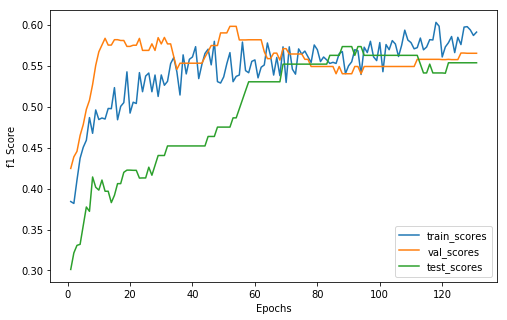

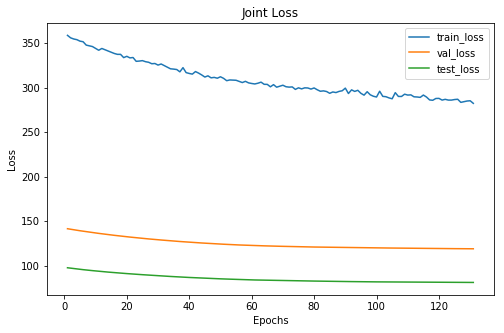

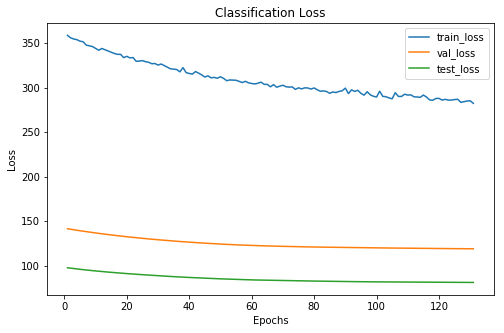

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       88     36      25
 1      157     62      40
 2       82     32      23
xxxxxxxxxxxxxx epoch: 131 xxxxxxxxxxxxxx


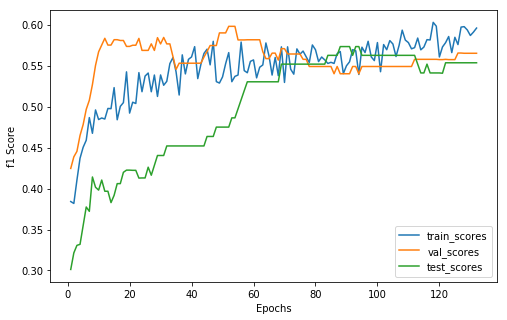

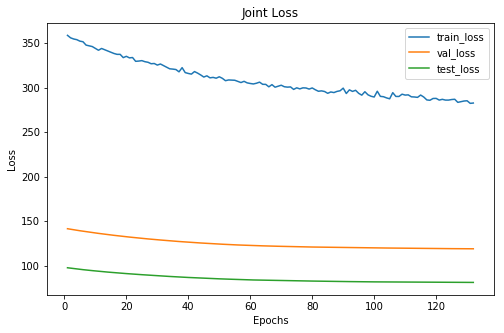

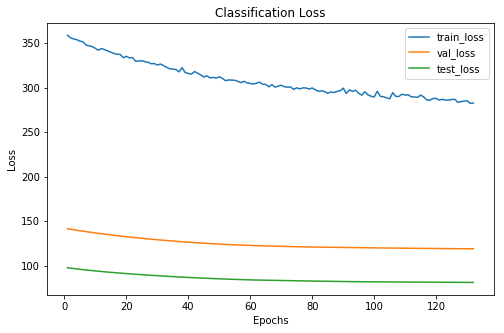

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       88     36      25
 1      164     62      40
 2       75     32      23
xxxxxxxxxxxxxx epoch: 132 xxxxxxxxxxxxxx


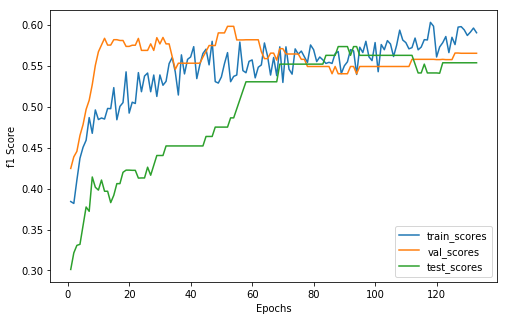

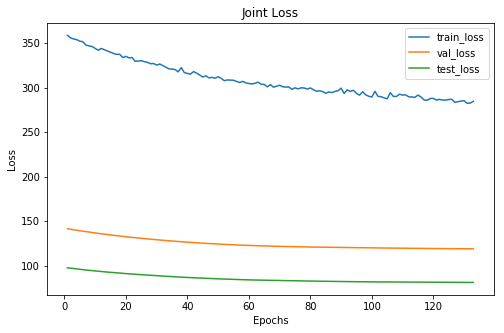

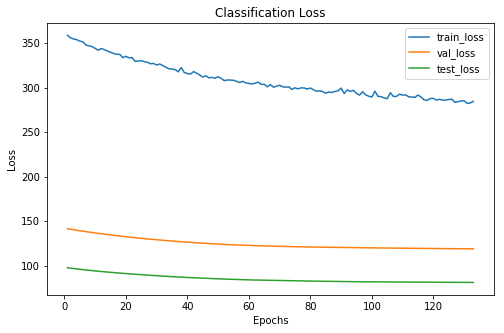

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     36      25
 1      162     62      40
 2       74     32      23
xxxxxxxxxxxxxx epoch: 133 xxxxxxxxxxxxxx


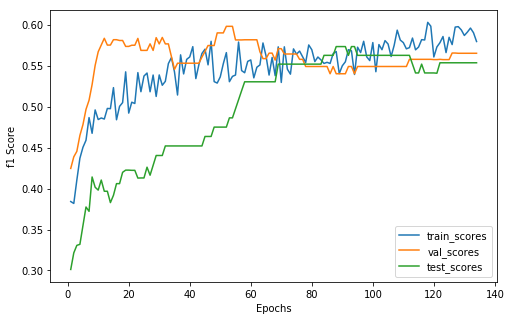

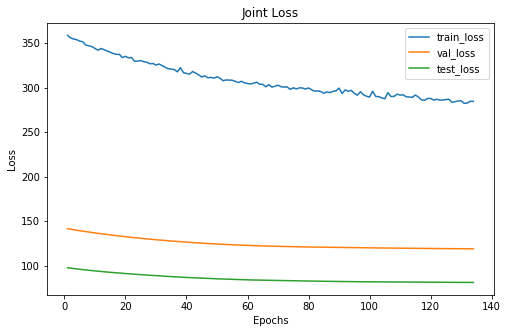

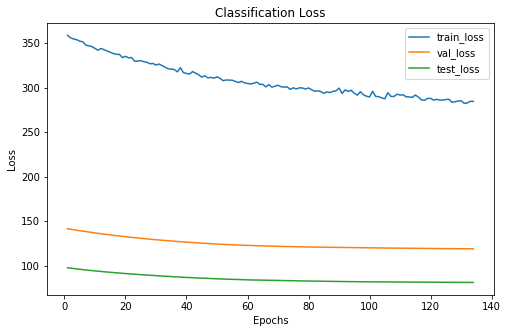

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       89     36      25
 1      155     62      40
 2       83     32      23
xxxxxxxxxxxxxx epoch: 134 xxxxxxxxxxxxxx


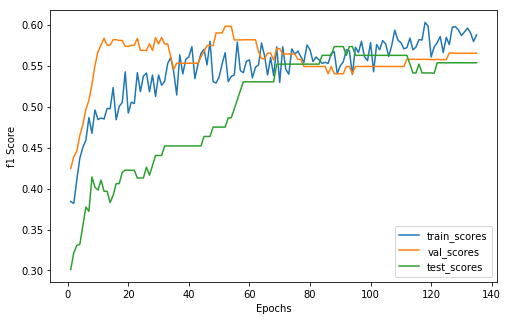

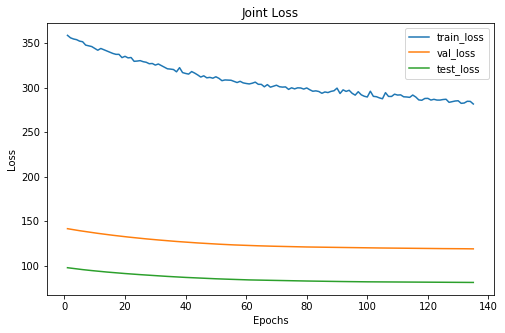

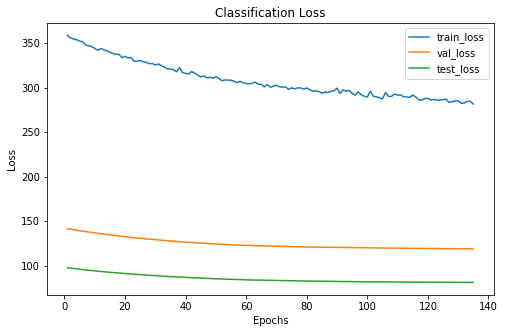

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       94     36      25
 1      160     62      40
 2       73     32      23
xxxxxxxxxxxxxx epoch: 135 xxxxxxxxxxxxxx


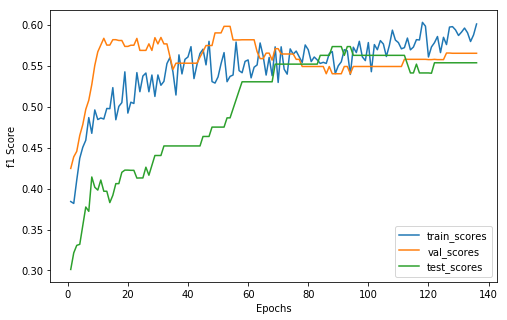

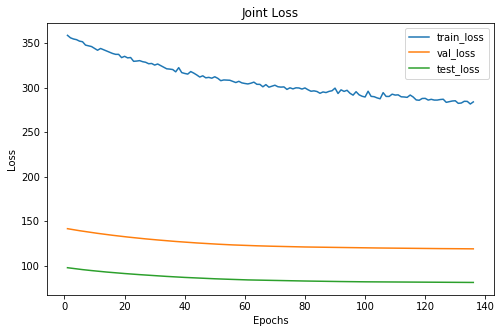

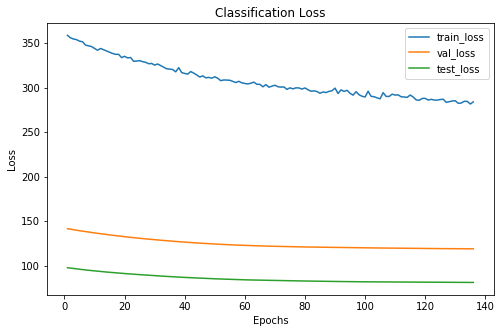

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     36      25
 1      155     62      40
 2       80     32      23
xxxxxxxxxxxxxx epoch: 136 xxxxxxxxxxxxxx


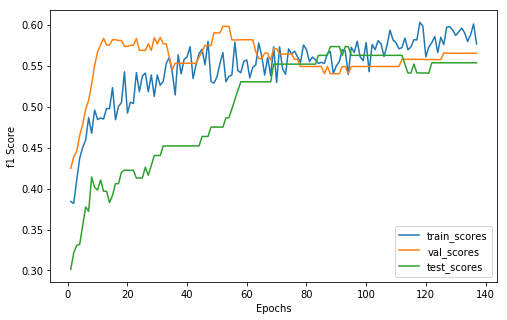

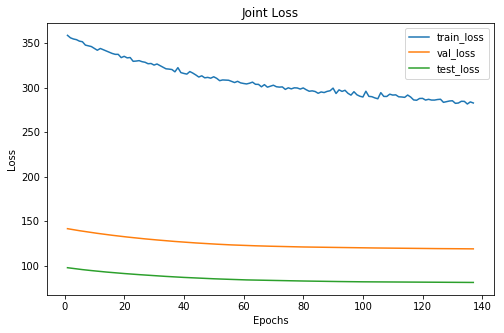

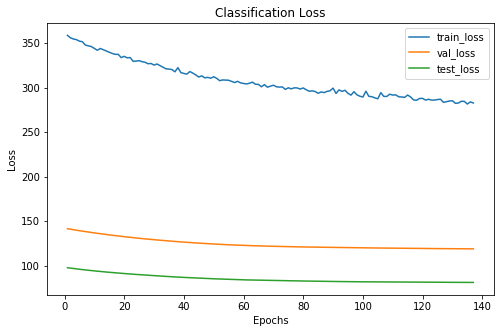

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       97     36      25
 1      153     62      40
 2       77     32      23
xxxxxxxxxxxxxx epoch: 137 xxxxxxxxxxxxxx


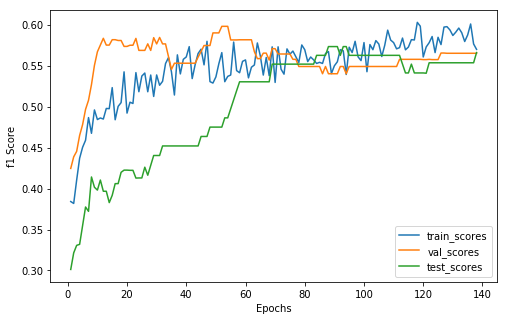

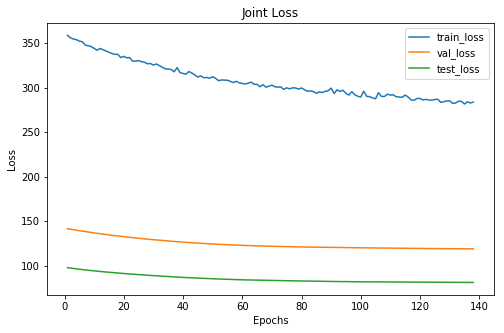

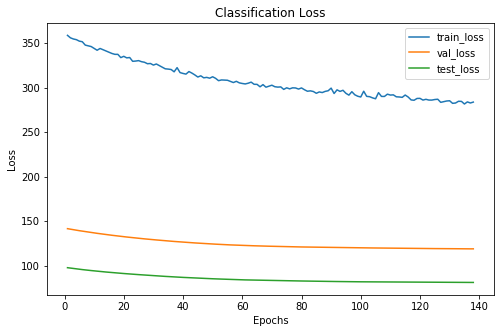

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       86     36      25
 1      161     62      39
 2       80     32      24
xxxxxxxxxxxxxx epoch: 138 xxxxxxxxxxxxxx


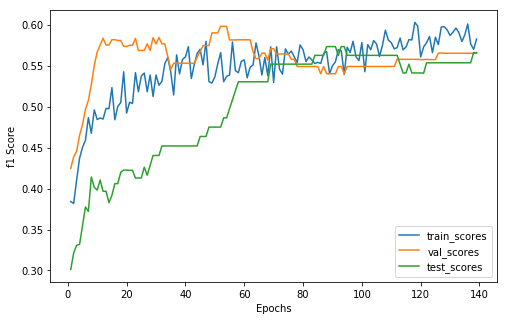

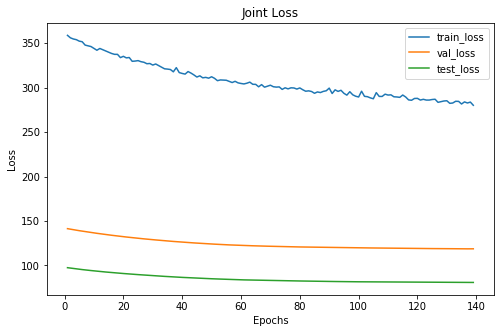

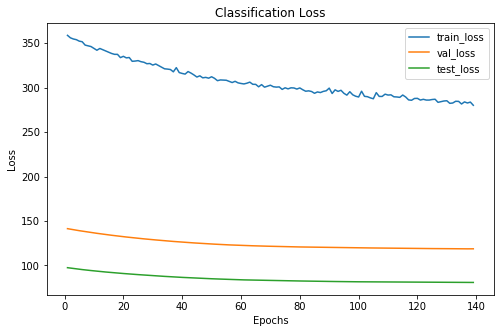

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     36      25
 1      154     62      39
 2       81     32      24
xxxxxxxxxxxxxx epoch: 139 xxxxxxxxxxxxxx


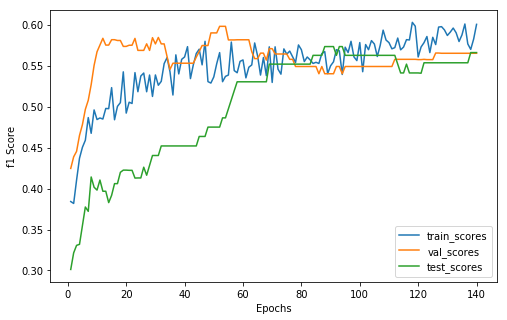

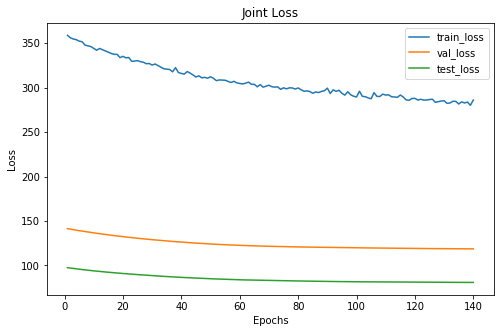

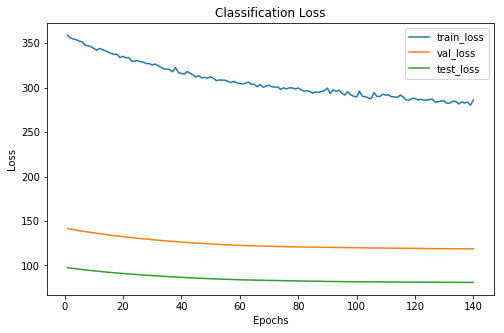

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       90     36      25
 1      153     62      39
 2       84     32      24
xxxxxxxxxxxxxx epoch: 140 xxxxxxxxxxxxxx


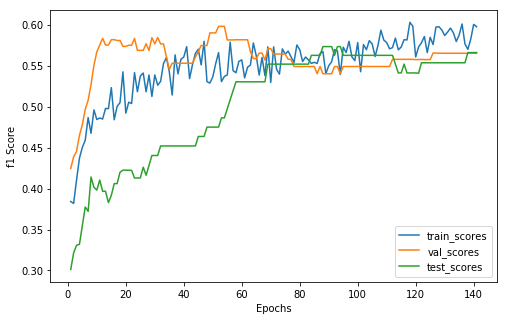

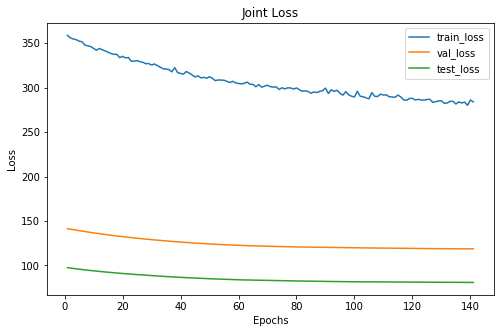

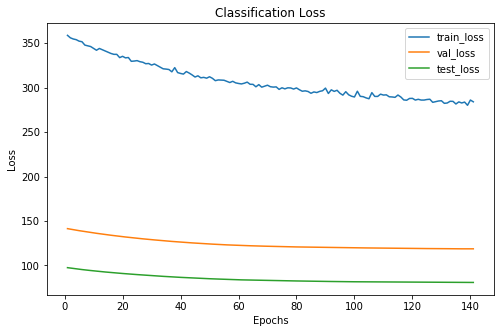

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       90     36      25
 1      155     62      39
 2       82     32      24
xxxxxxxxxxxxxx epoch: 141 xxxxxxxxxxxxxx


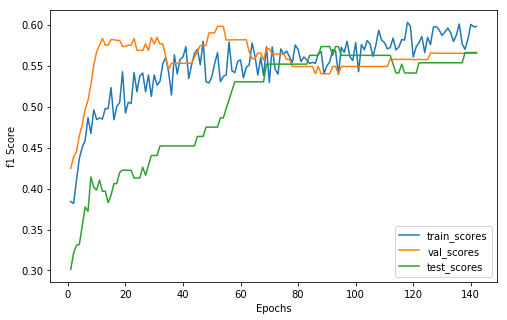

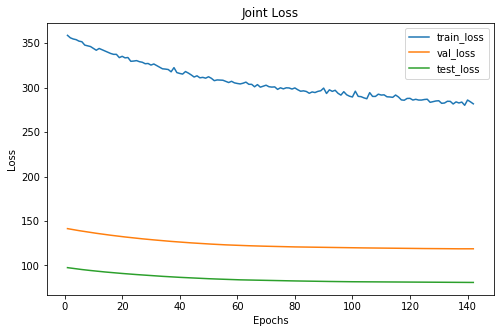

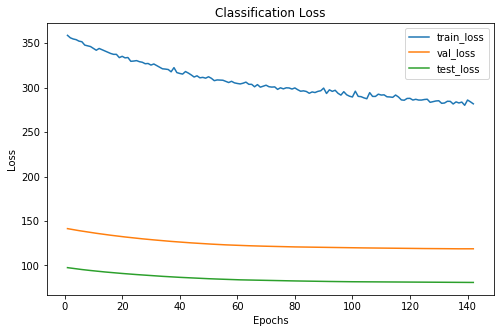

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       90     36      25
 1      152     62      39
 2       85     32      24
xxxxxxxxxxxxxx epoch: 142 xxxxxxxxxxxxxx


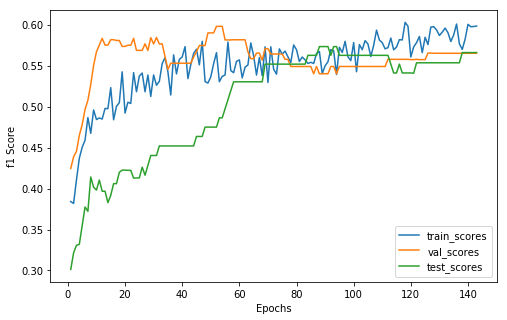

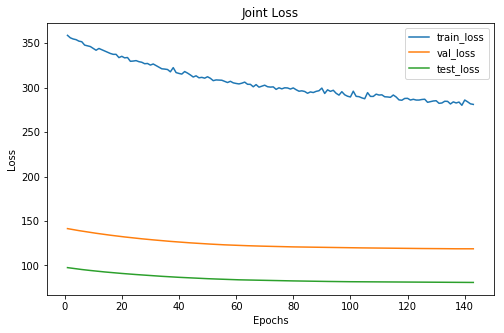

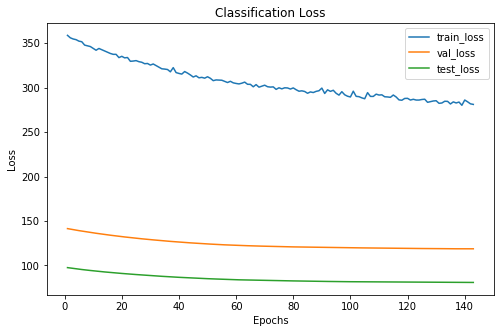

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     36      25
 1      149     62      39
 2       86     32      24
xxxxxxxxxxxxxx epoch: 143 xxxxxxxxxxxxxx


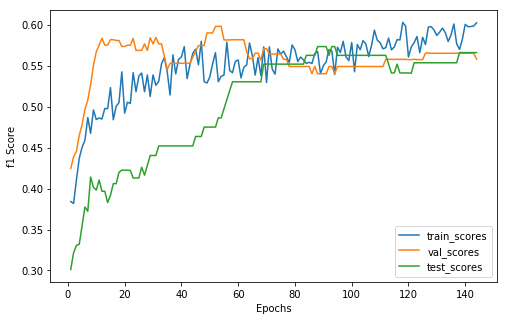

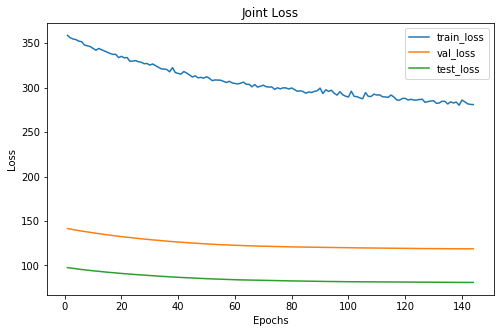

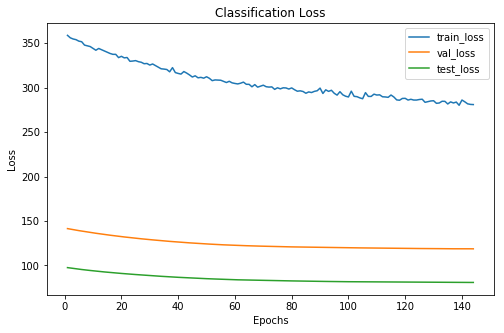

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       84     37      25
 1      161     61      39
 2       82     32      24
xxxxxxxxxxxxxx epoch: 144 xxxxxxxxxxxxxx


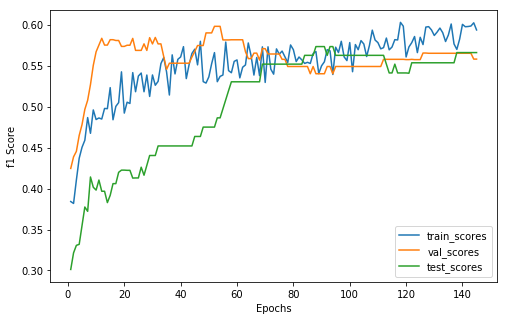

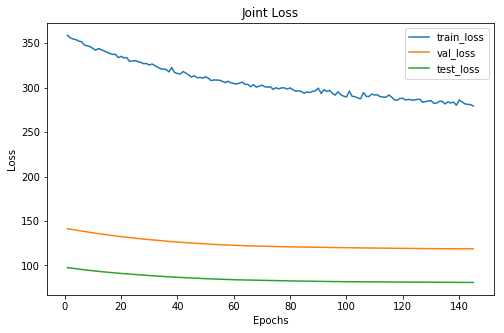

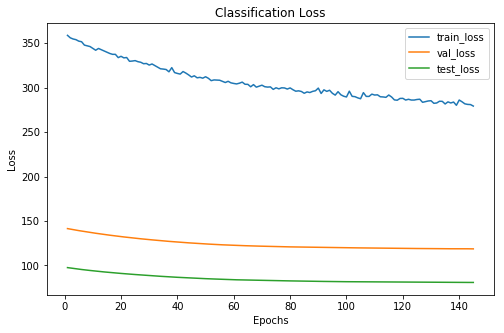

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       90     37      25
 1      158     61      39
 2       79     32      24
xxxxxxxxxxxxxx epoch: 145 xxxxxxxxxxxxxx


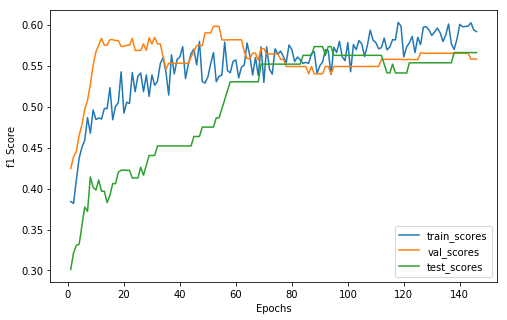

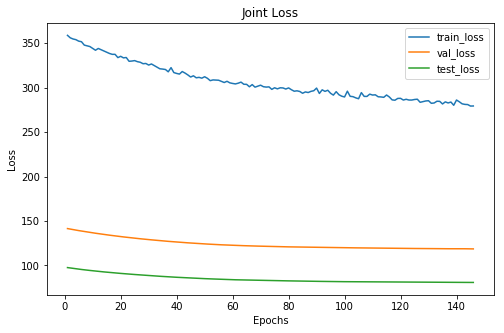

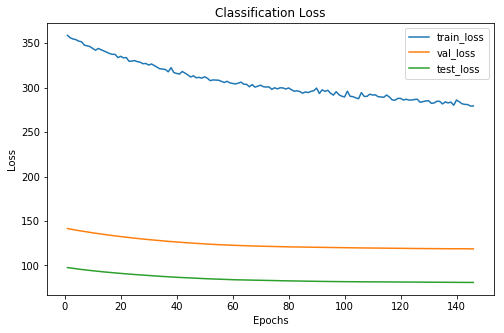

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     37      25
 1      151     61      39
 2       84     32      24
xxxxxxxxxxxxxx epoch: 146 xxxxxxxxxxxxxx


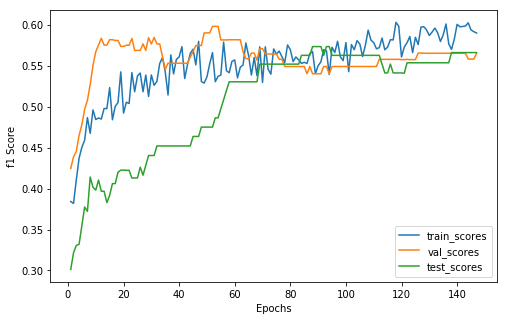

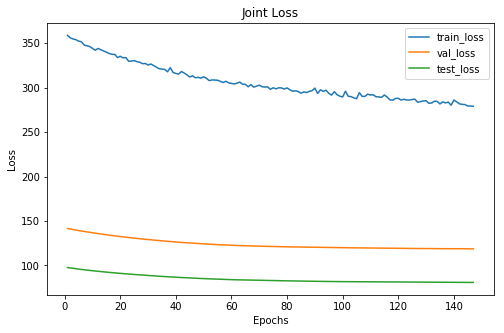

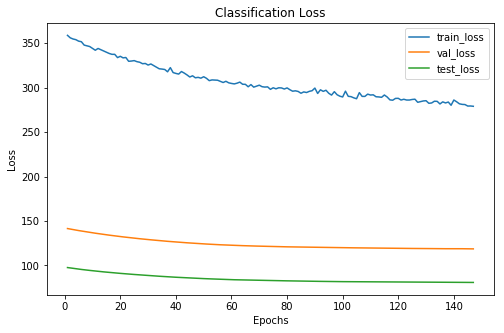

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
 9  35   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       97     36      25
 1      146     62      39
 2       84     32      24
xxxxxxxxxxxxxx epoch: 147 xxxxxxxxxxxxxx


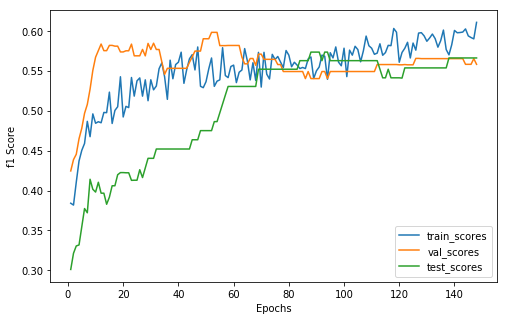

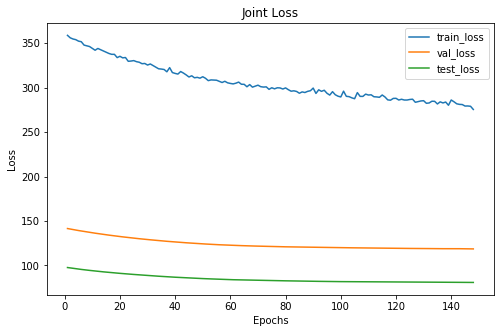

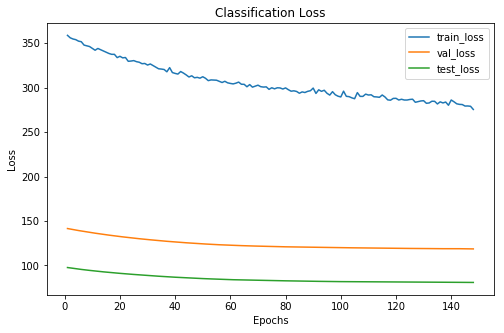

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       87     37      25
 1      154     61      39
 2       86     32      24
xxxxxxxxxxxxxx epoch: 148 xxxxxxxxxxxxxx


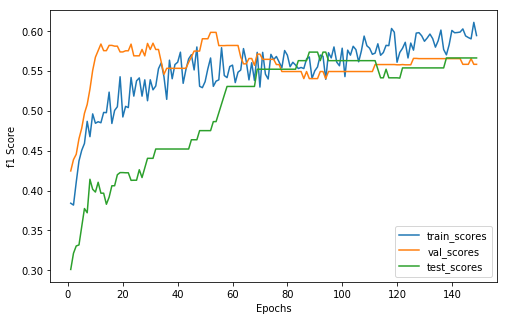

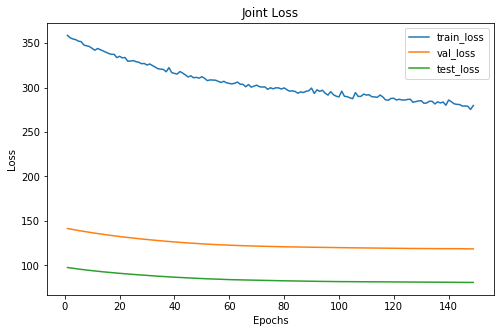

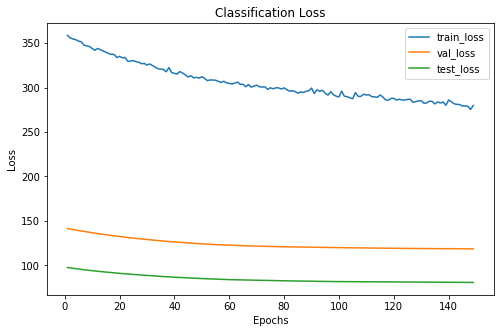

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     37      25
 1      160     61      39
 2       76     32      24
xxxxxxxxxxxxxx epoch: 149 xxxxxxxxxxxxxx


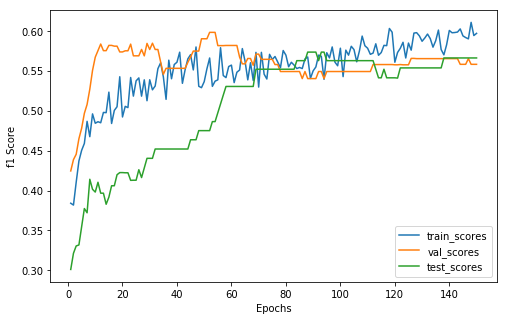

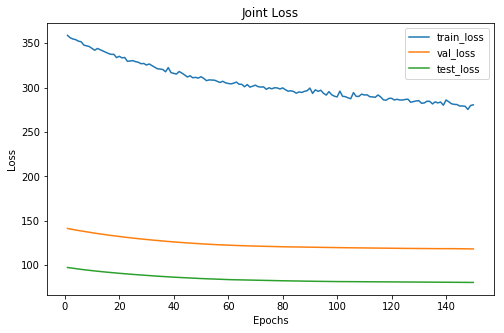

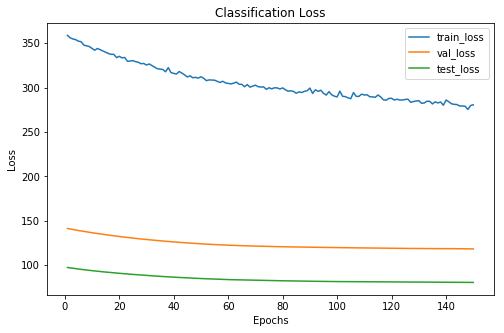

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     37      25
 1      161     61      39
 2       75     32      24
xxxxxxxxxxxxxx epoch: 150 xxxxxxxxxxxxxx


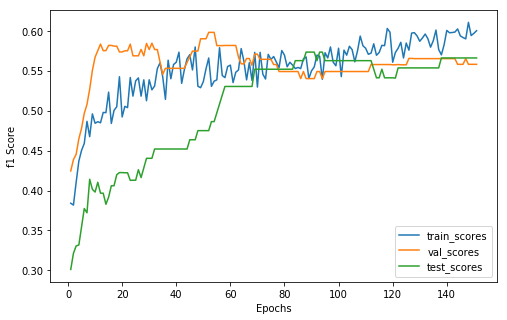

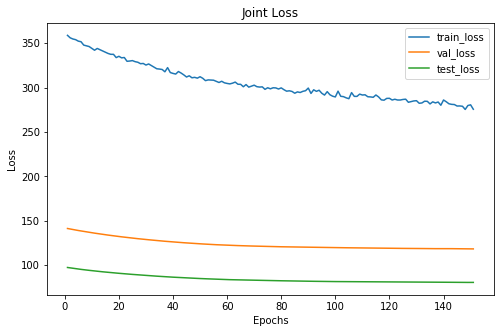

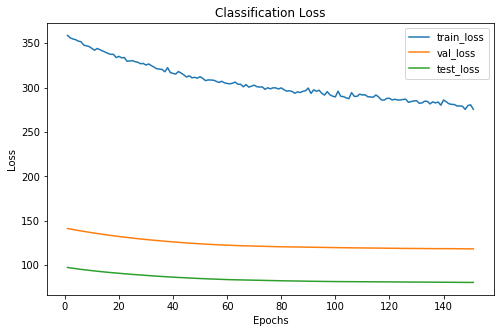

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       88     37      25
 1      156     61      39
 2       83     32      24
xxxxxxxxxxxxxx epoch: 151 xxxxxxxxxxxxxx


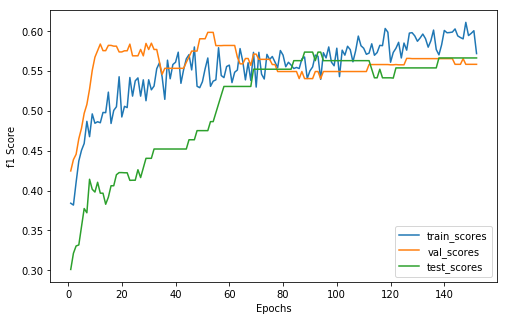

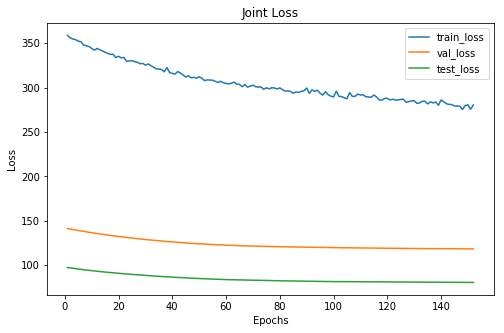

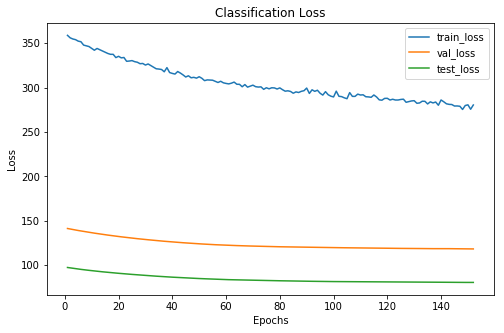

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       94     37      25
 1      145     61      39
 2       88     32      24
xxxxxxxxxxxxxx epoch: 152 xxxxxxxxxxxxxx


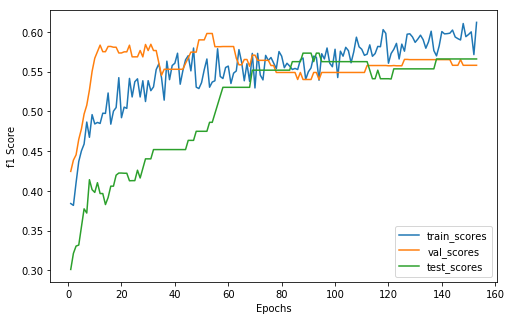

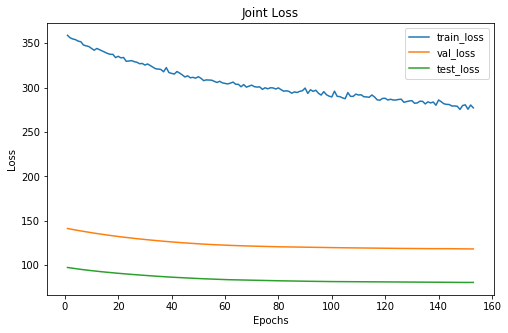

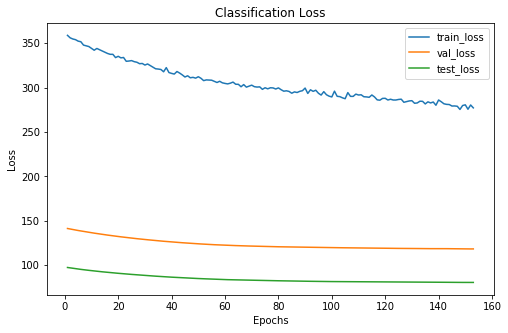

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4  10  16
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       86     37      25
 1      157     61      39
 2       84     32      24
xxxxxxxxxxxxxx epoch: 153 xxxxxxxxxxxxxx


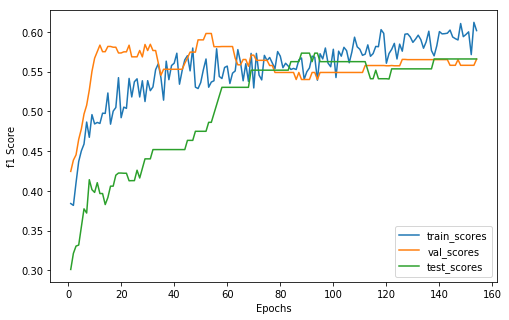

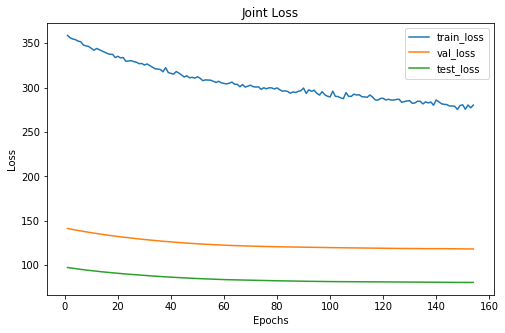

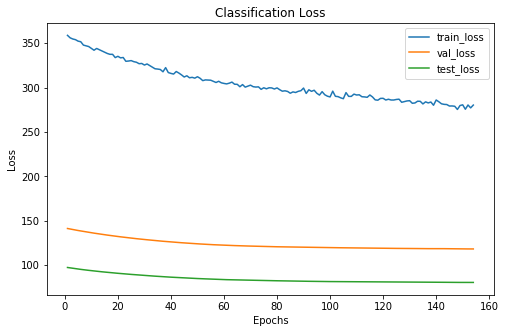

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       94     37      25
 1      150     60      39
 2       83     33      24
xxxxxxxxxxxxxx epoch: 154 xxxxxxxxxxxxxx


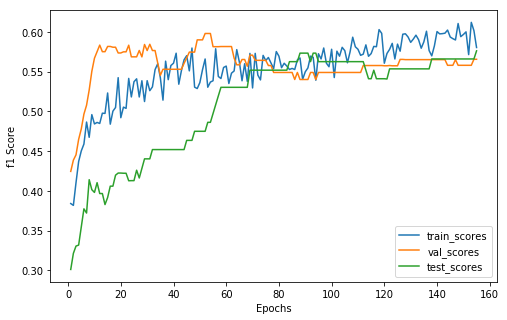

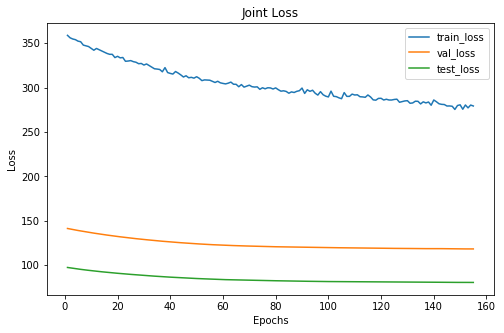

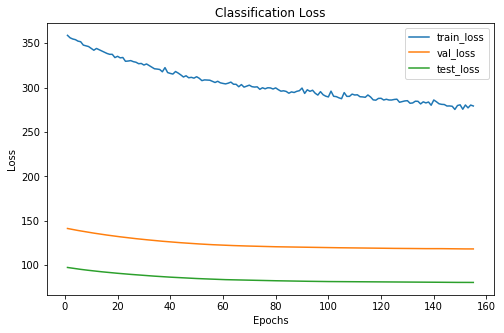

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       93     37      25
 1      150     60      40
 2       84     33      23
xxxxxxxxxxxxxx epoch: 155 xxxxxxxxxxxxxx


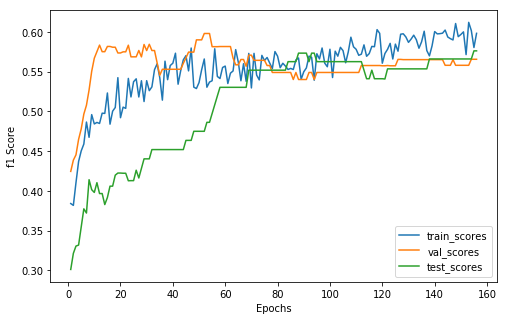

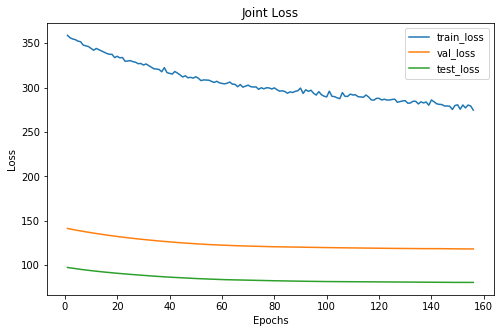

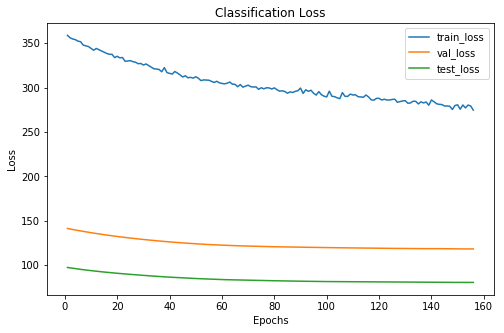

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       94     37      25
 1      155     60      40
 2       78     33      23
xxxxxxxxxxxxxx epoch: 156 xxxxxxxxxxxxxx


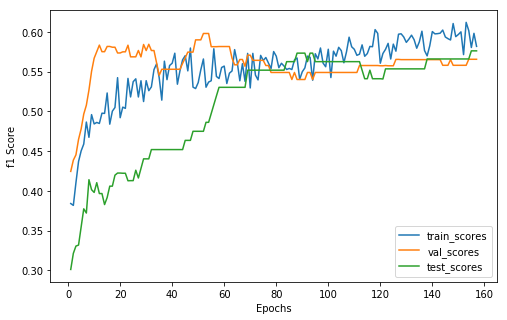

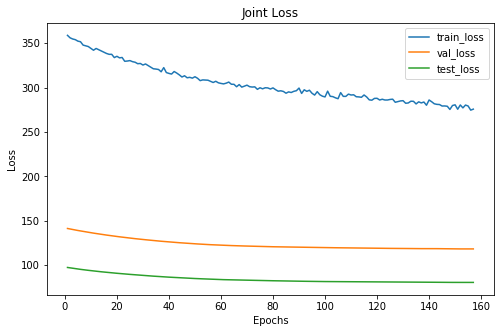

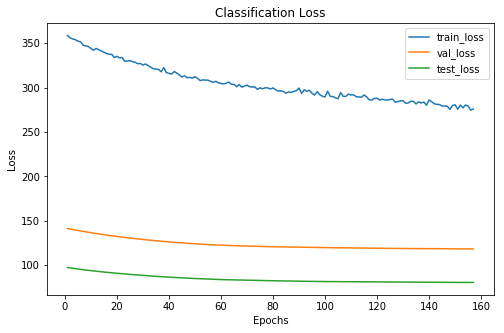

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       89     37      25
 1      159     60      40
 2       79     33      23
xxxxxxxxxxxxxx epoch: 157 xxxxxxxxxxxxxx


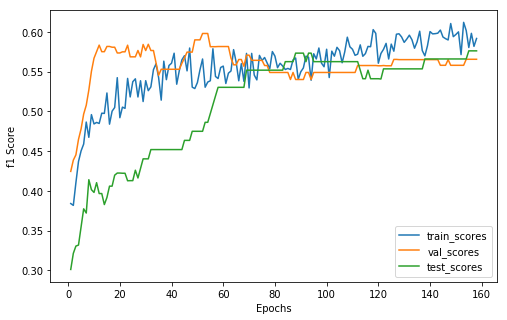

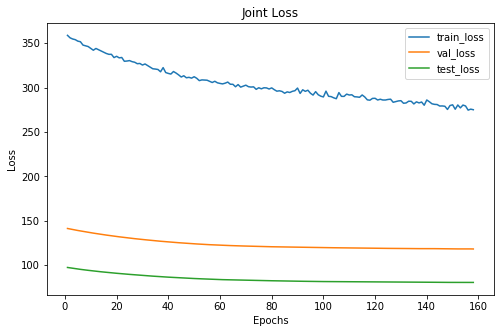

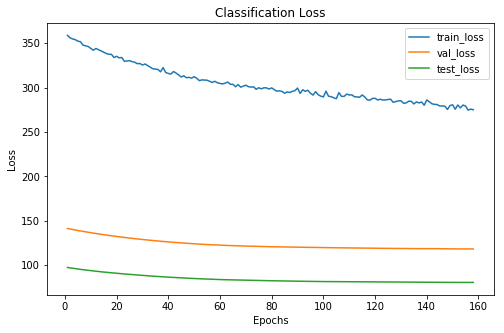

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       90     37      25
 1      155     60      40
 2       82     33      23
xxxxxxxxxxxxxx epoch: 158 xxxxxxxxxxxxxx


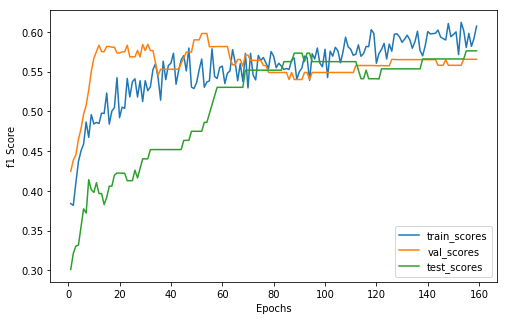

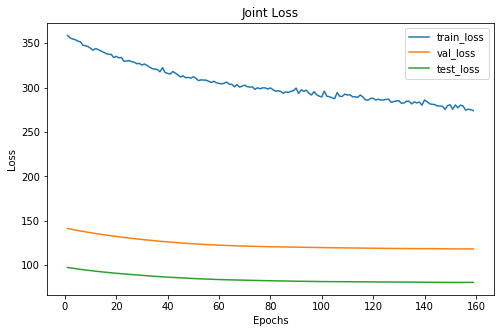

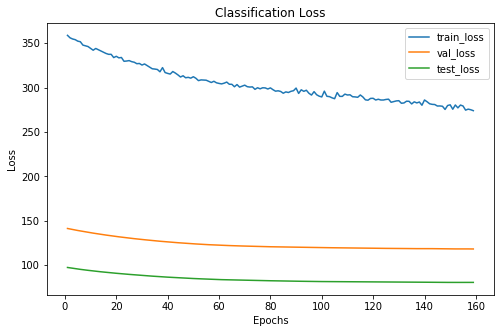

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       95     37      25
 1      152     60      40
 2       80     33      23
xxxxxxxxxxxxxx epoch: 159 xxxxxxxxxxxxxx


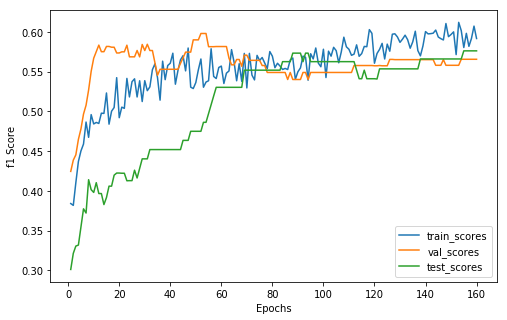

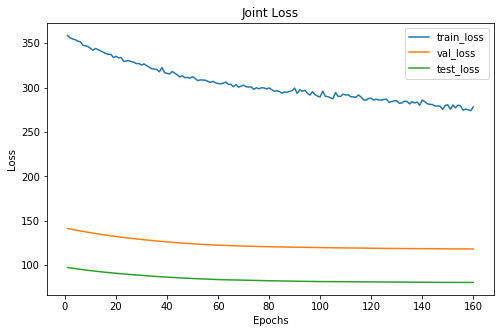

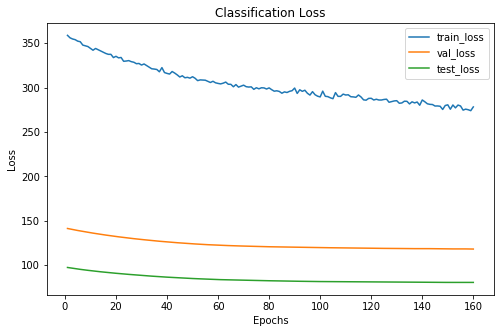

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     37      25
 1      152     60      40
 2       83     33      23
xxxxxxxxxxxxxx epoch: 160 xxxxxxxxxxxxxx


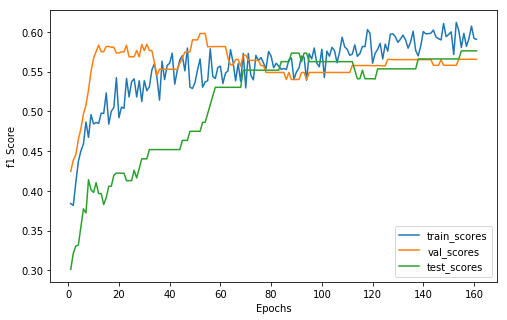

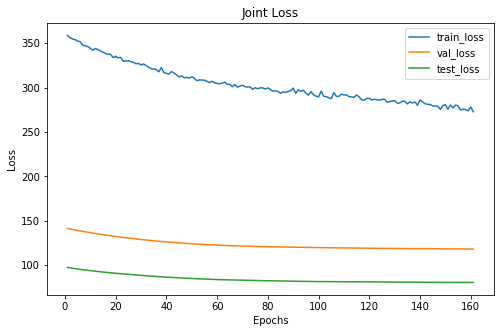

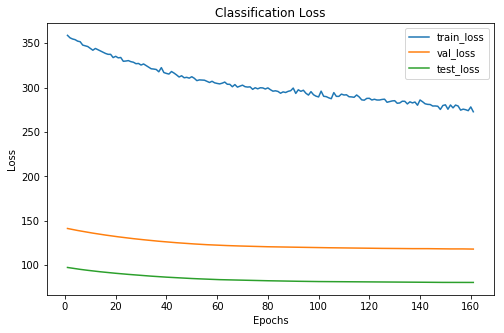

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       89     37      25
 1      159     60      40
 2       79     33      23
xxxxxxxxxxxxxx epoch: 161 xxxxxxxxxxxxxx


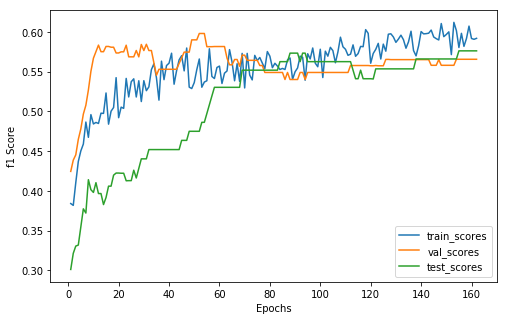

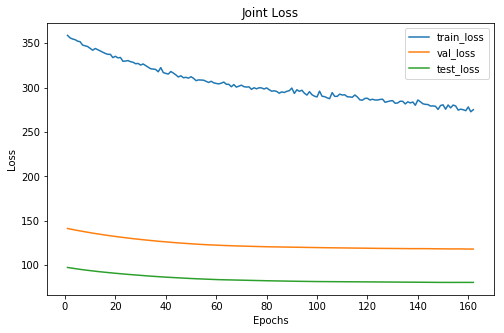

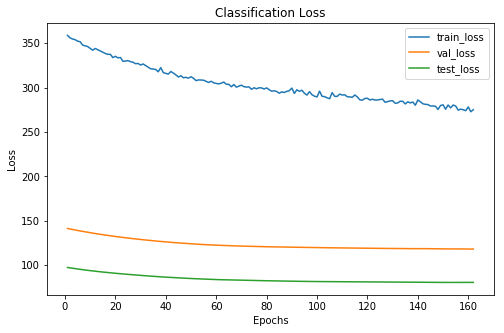

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       98     37      25
 1      152     60      40
 2       77     33      23
xxxxxxxxxxxxxx epoch: 162 xxxxxxxxxxxxxx


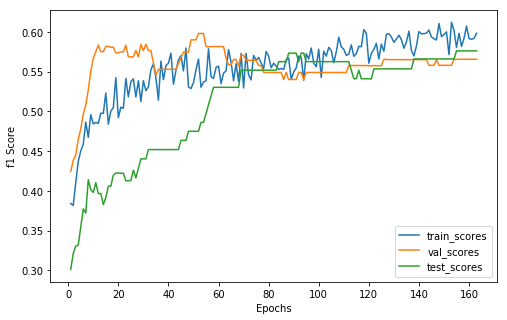

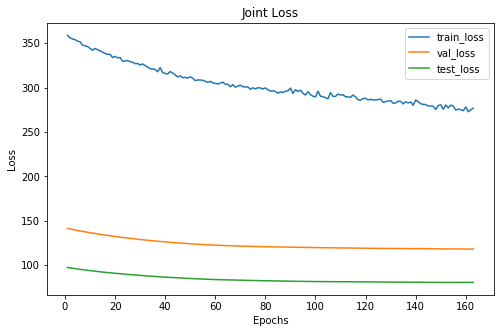

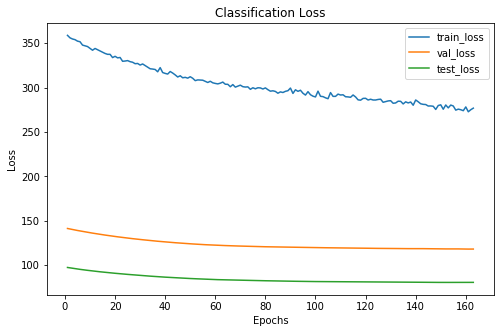

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       94     37      25
 1      155     60      40
 2       78     33      23
xxxxxxxxxxxxxx epoch: 163 xxxxxxxxxxxxxx


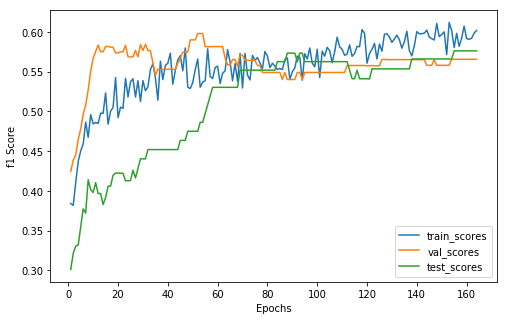

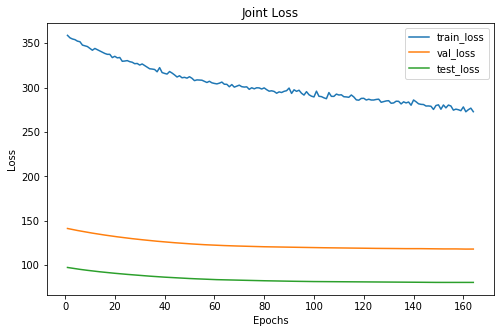

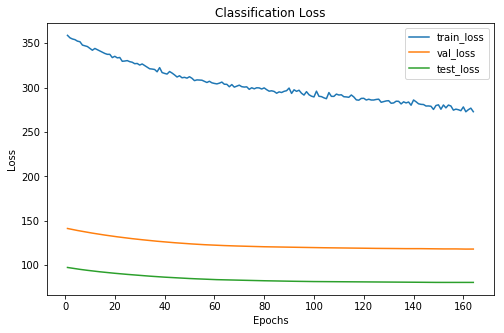

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0      100     37      25
 1      146     60      40
 2       81     33      23
xxxxxxxxxxxxxx epoch: 164 xxxxxxxxxxxxxx


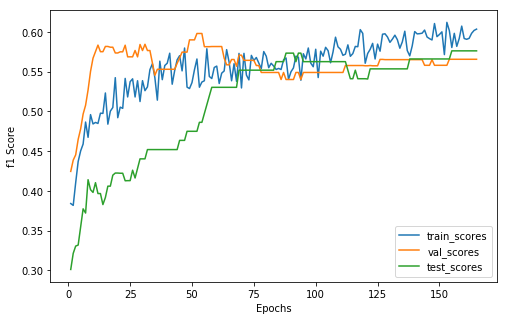

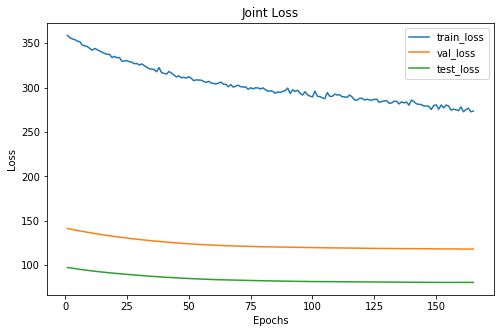

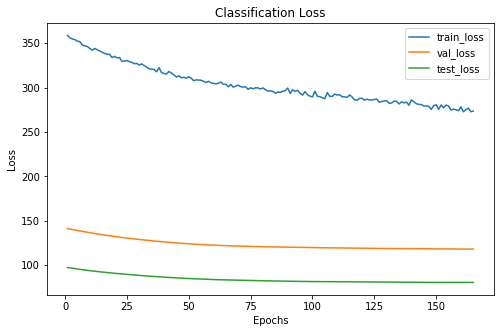

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     37      25
 1      157     60      40
 2       78     33      23
xxxxxxxxxxxxxx epoch: 165 xxxxxxxxxxxxxx


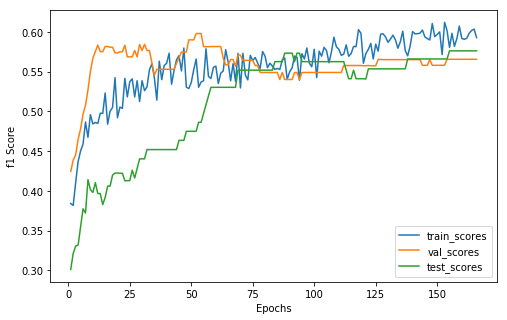

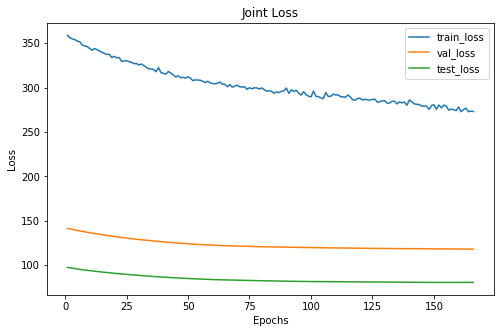

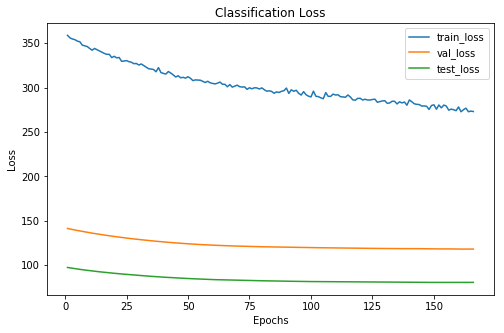

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       94     37      25
 1      147     60      40
 2       86     33      23
xxxxxxxxxxxxxx epoch: 166 xxxxxxxxxxxxxx


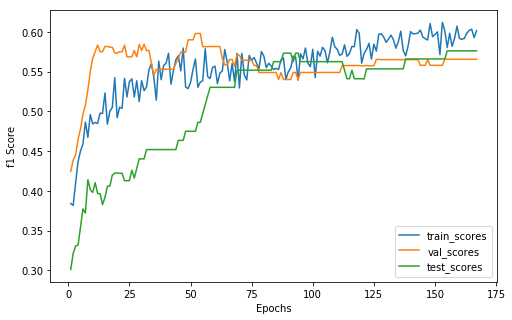

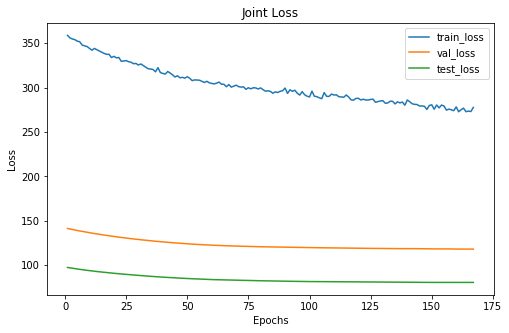

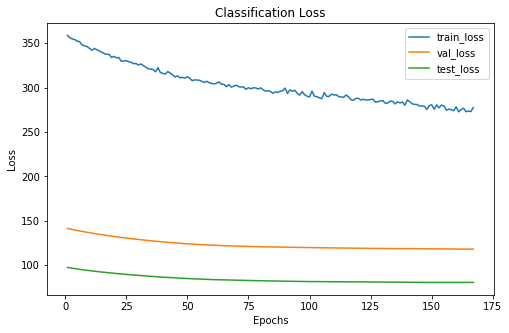

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       94     37      25
 1      151     60      40
 2       82     33      23
xxxxxxxxxxxxxx epoch: 167 xxxxxxxxxxxxxx


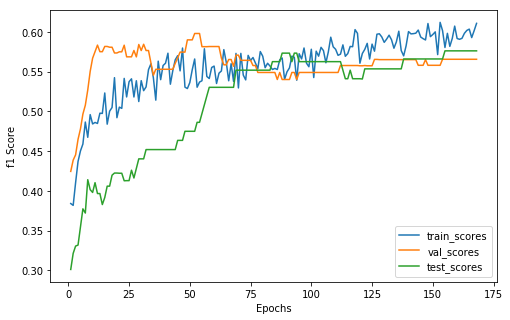

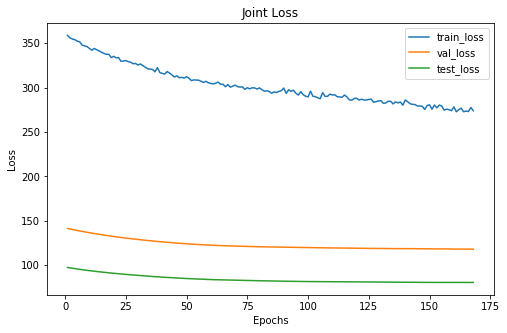

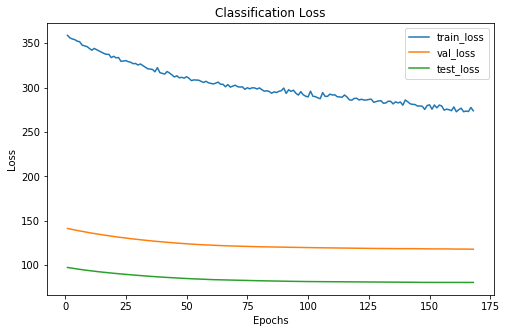

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       96     37      25
 1      148     60      40
 2       83     33      23
xxxxxxxxxxxxxx epoch: 168 xxxxxxxxxxxxxx


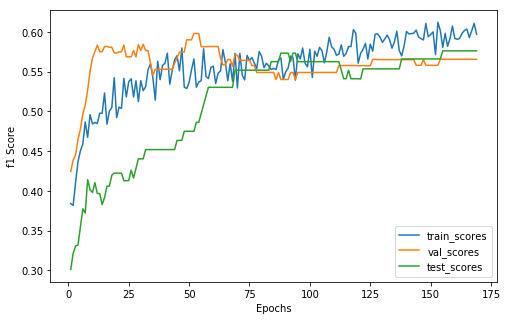

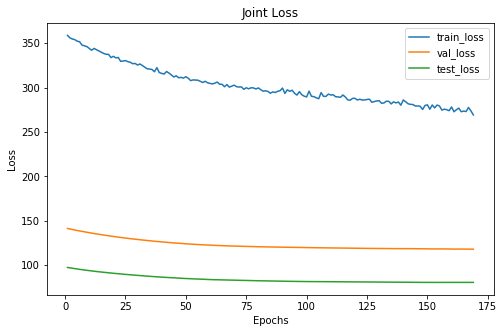

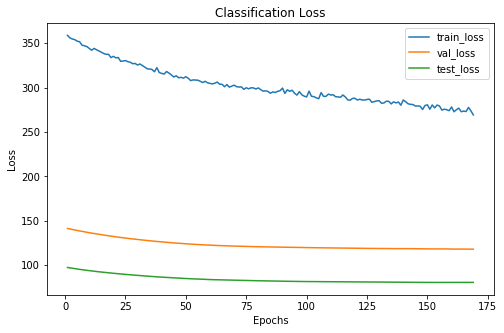

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       90     37      25
 1      158     60      40
 2       79     33      23
xxxxxxxxxxxxxx epoch: 169 xxxxxxxxxxxxxx


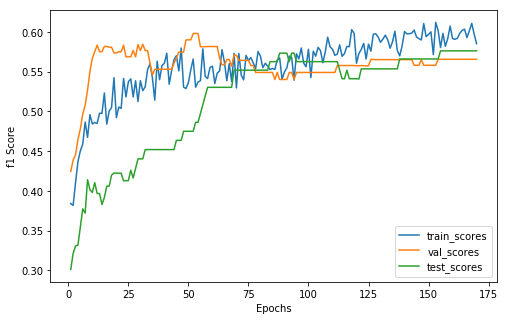

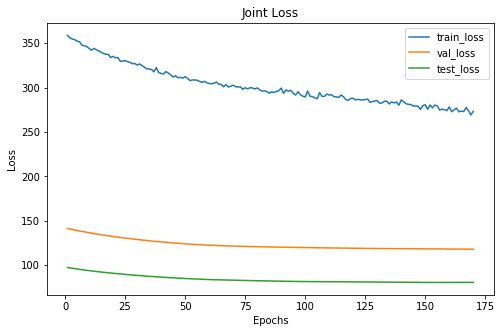

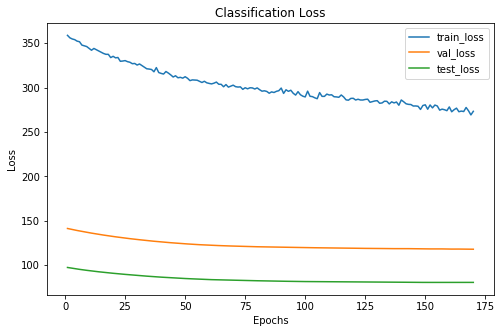

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       93     37      25
 1      156     60      40
 2       78     33      23
xxxxxxxxxxxxxx epoch: 170 xxxxxxxxxxxxxx


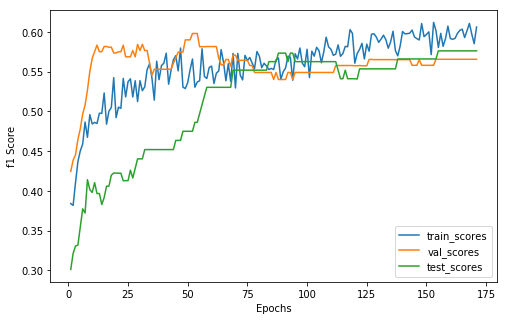

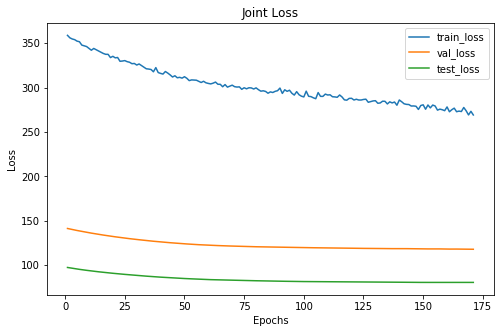

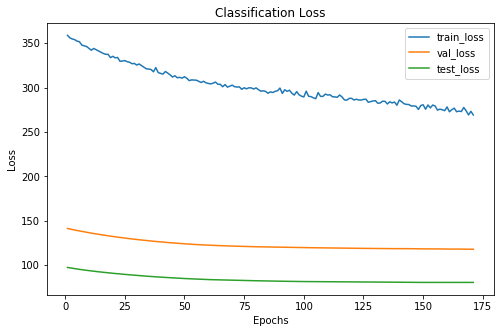

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       86     37      25
 1      161     60      40
 2       80     33      23
xxxxxxxxxxxxxx epoch: 171 xxxxxxxxxxxxxx


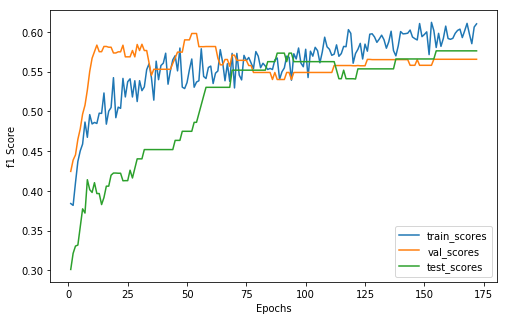

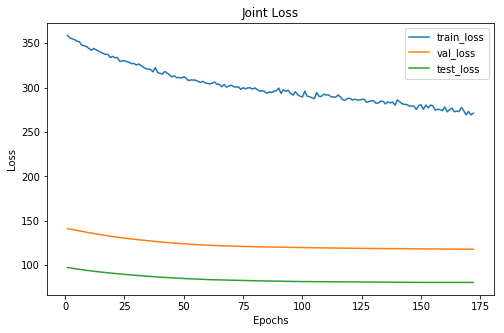

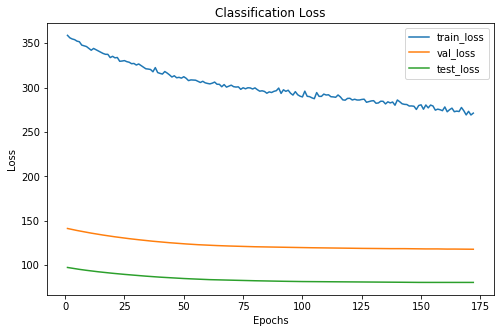

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   9  17
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       93     37      25
 1      157     60      40
 2       77     33      23
xxxxxxxxxxxxxx epoch: 172 xxxxxxxxxxxxxx


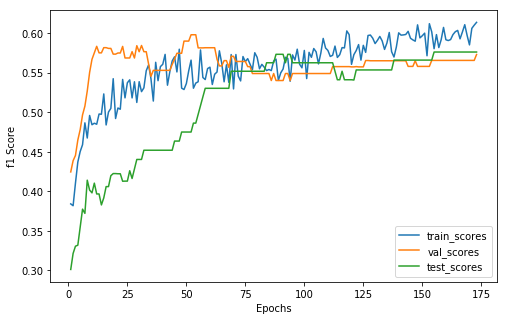

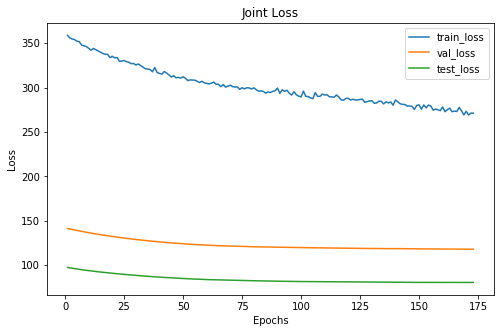

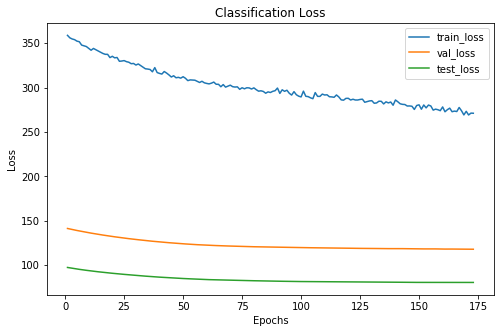

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   8  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       96     37      25
 1      149     59      40
 2       82     34      23
xxxxxxxxxxxxxx epoch: 173 xxxxxxxxxxxxxx


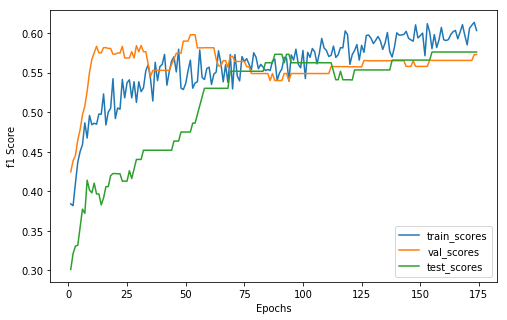

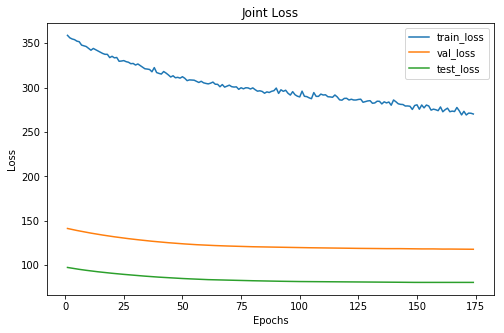

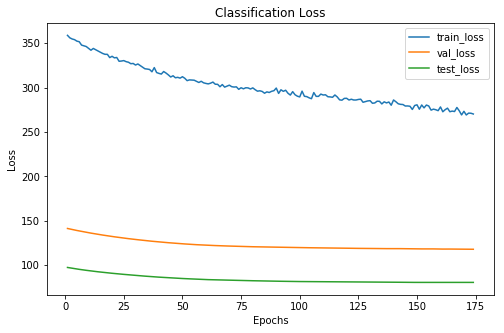

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   8  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       85     37      25
 1      156     59      40
 2       86     34      23
xxxxxxxxxxxxxx epoch: 174 xxxxxxxxxxxxxx


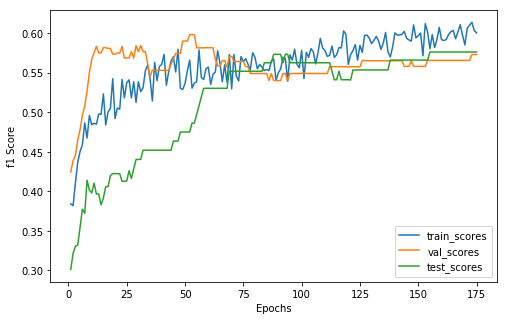

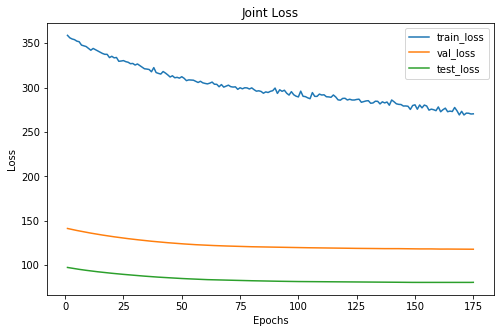

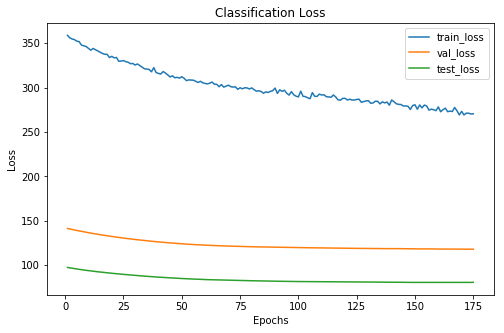

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   8  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       91     37      25
 1      154     59      40
 2       82     34      23
xxxxxxxxxxxxxx epoch: 175 xxxxxxxxxxxxxx


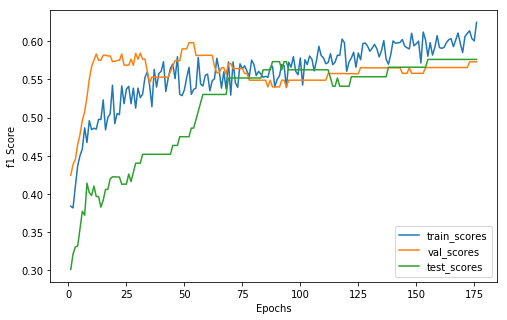

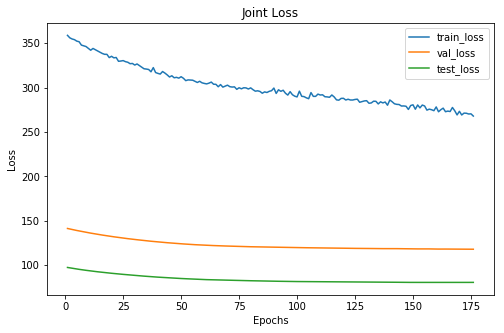

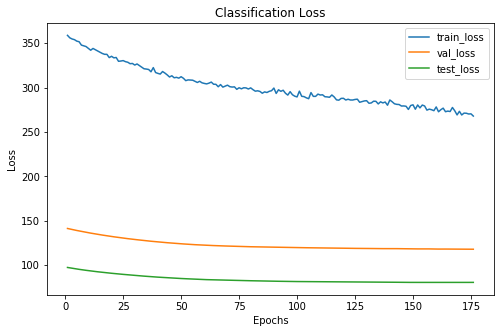

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   8  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       92     37      25
 1      152     59      40
 2       83     34      23
xxxxxxxxxxxxxx epoch: 176 xxxxxxxxxxxxxx


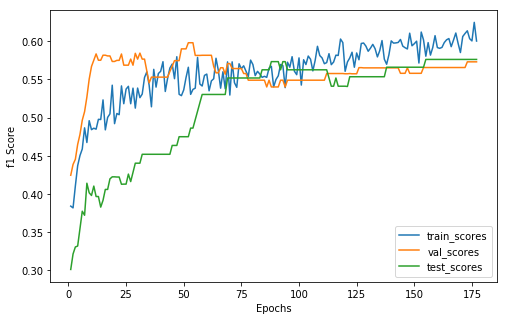

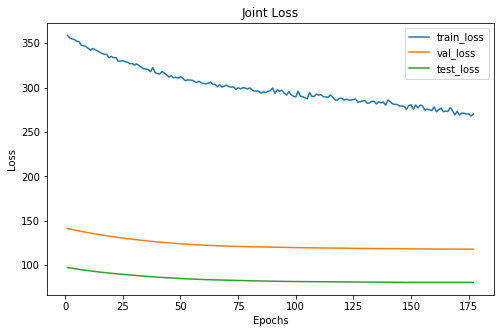

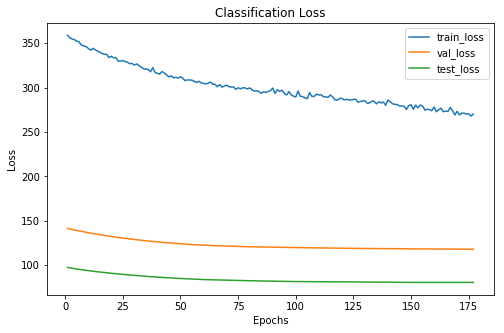

Cofusion Matrix For Val Set: 
--  --  --
23  17  10
10  34   6
 4   8  18
--  --  --
Predicted Label Distribution:
      Train    Val    Test
--  -------  -----  ------
 0       89     37      25
 1      157     59      40
 2       81     34      23


In [ ]:
total_loss_over_epochs, scores_over_epochs = plotting.get_empty_stat_over_n_epoch_dictionaries()
reconstruction_loss_over_epochs = deepcopy(total_loss_over_epochs)
classification_loss_over_epochs = deepcopy(total_loss_over_epochs)
validation_user_statistics_over_epochs = []


for epoch in range(n_epochs):
    
    (train_total_loss, train_total_reconstruction_loss , train_total_classification_loss, 
     train_labels, train_preds, train_users) = trainer.evaluate_multitask_learner(data, 
                                                                      'train_ids',
                                                                      model,
                                                                      reconstruction_criterion ,
                                                                      classification_criterion,
                                                                      optimizer=optimizer,
                                                                      alpha=alpha,
                                                                      beta=beta,
                                                                      use_histogram=use_historgram)
    
    (val_total_loss, val_total_reconstruction_loss , val_total_classification_loss, 
     val_labels, val_preds, val_users) =  trainer.evaluate_multitask_learner(data,
                                                                  'val_ids',
                                                                  model,
                                                                  reconstruction_criterion,
                                                                  classification_criterion,
                                                                  alpha=alpha,
                                                                  beta=beta,
                                                                  use_histogram=use_historgram)
    
    (test_total_loss, test_total_reconstruction_loss , test_total_classification_loss, 
     test_labels, test_preds, test_users) =  trainer.evaluate_multitask_learner(data, 
                                                                    'test_ids',
                                                                    model,
                                                                    reconstruction_criterion,
                                                                    classification_criterion,
                                                                    alpha=alpha,
                                                                    beta=beta,
                                                                    use_histogram=use_historgram)
    
    ######## Appending losses ######## 
    total_loss_over_epochs['train_loss'].append(train_total_loss)
    total_loss_over_epochs['val_loss'].append(val_total_loss)
    total_loss_over_epochs['test_loss'].append(test_total_loss)
    
    reconstruction_loss_over_epochs['train_loss'].append(train_total_reconstruction_loss)
    reconstruction_loss_over_epochs['val_loss'].append(val_total_reconstruction_loss)
    reconstruction_loss_over_epochs['test_loss'].append(test_total_reconstruction_loss)
    
    classification_loss_over_epochs['train_loss'].append(train_total_classification_loss)
    classification_loss_over_epochs['val_loss'].append(val_total_classification_loss)
    classification_loss_over_epochs['test_loss'].append(test_total_classification_loss)

    
    ######## Appending Metrics ######## 
    train_scores = metrics.precision_recall_fscore_support(conversions.tensor_list_to_int_list(train_labels),
                                                           conversions.tensor_list_to_int_list(train_preds), average='weighted')
    val_scores = metrics.precision_recall_fscore_support(conversions.tensor_list_to_int_list(val_labels),
                                                         conversions.tensor_list_to_int_list(val_preds), average='weighted')
    test_scores = metrics.precision_recall_fscore_support(conversions.tensor_list_to_int_list(test_labels),
                                                          conversions.tensor_list_to_int_list(test_preds), average='weighted')

    scores_over_epochs['train_scores'].append(train_scores)
    scores_over_epochs['val_scores'].append(val_scores)
    scores_over_epochs['test_scores'].append(test_scores)
    
    validation_user_statistics_over_epochs.append(statistics.generate_training_statistics_for_user(val_labels, 
                                                                                                val_preds, 
                                                                                                val_users))

    if epoch%1 == 0:
        print("xxxxxxxxxxxxxx epoch: {} xxxxxxxxxxxxxx".format(epoch))
        plotting.plot_score_over_n_epochs(scores_over_epochs, score_type='f1', fig_size=(8,5))
        plotting.plot_loss_over_n_epochs(total_loss_over_epochs, fig_size=(8, 5), title="Joint Loss")
#         plotting.plot_loss_over_n_epochs(reconstruction_loss_over_epochs, fig_size=(8, 5), title="Reconstruction Loss")
        plotting.plot_loss_over_n_epochs(classification_loss_over_epochs, fig_size=(8, 5), title="Classification Loss")
        
        print("Cofusion Matrix For Val Set: ")
        print(tabulate( metrics.confusion_matrix(conversions.tensor_list_to_int_list(val_labels), 
                                                 conversions.tensor_list_to_int_list(val_preds))))
        print("Predicted Label Distribution:")
        print(statistics.get_train_test_val_label_counts_from_predictions(train_preds, val_preds, test_preds))
